In [1]:
import joblib
import warnings
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from scipy.stats import randint
from sklearn.metrics import roc_curve, auc, RocCurveDisplay
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.compose import ColumnTransformer

# Explore and Preprocess Data

## Iris

### Load dataset

In [2]:
iris = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/iris/iris.data', header=None)
iris.columns = ['sepal_length', 'sepal_width', 'petal_length', 'petal_width', 'class']
# Replace all labels except 'Iris-virginica' with 'Iris-non-virginica'
iris['class'] = iris['class'].apply(lambda x: 'Iris-virginica' if x == 'Iris-virginica' else 'Iris-non-virginica')

In [3]:
iris.head()

,sepal_length,sepal_width,petal_length,petal_width,class
0,5.1,3.5,1.4,0.2,Iris-non-virginica
1,4.9,3.0,1.4,0.2,Iris-non-virginica
2,4.7,3.2,1.3,0.2,Iris-non-virginica
3,4.6,3.1,1.5,0.2,Iris-non-virginica
4,5.0,3.6,1.4,0.2,Iris-non-virginica


In [4]:
print(iris.dtypes)

sepal_length    float64
sepal_width     float64
petal_length    float64
petal_width     float64
class            object
dtype: object


### Drop duplicated observations

In [5]:
duplicated_rows = iris[iris.duplicated()]
print("Rows to remove:", duplicated_rows.shape)

Rows to remove: (3, 5)


In [6]:
iris = iris.drop_duplicates()
iris.shape

(147, 5)

### Check for missing observations

In [7]:
print(iris.isnull().sum())

sepal_length    0
sepal_width     0
petal_length    0
petal_width     0
class           0
dtype: int64


### Split data-labels

In [8]:
iris.describe()

,sepal_length,sepal_width,petal_length,petal_width
count,147.000000,147.000000,147.000000,147.000000
mean,5.856463,3.055782,3.780272,1.208844
std,0.829100,0.437009,1.759111,0.757874
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.400000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


In [9]:
X_iris = iris.iloc[:, :-1].values
y_iris = iris.iloc[:, -1].apply(lambda x: 1 if x == 'Iris-virginica' else 0).values
y_iris[:10], X_iris.shape, y_iris.shape

(array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), (147, 4), (147,))

### Scale data

In [10]:
scale = StandardScaler()
X_iris = scale.fit_transform(X_iris)

### Observe data

In [11]:
X_iris_pd = pd.DataFrame(X_iris, columns=iris.columns[:-1])
y_iris_pd = pd.DataFrame(y_iris, columns=iris.columns[-1:])
iris_pd = pd.concat([X_iris_pd, y_iris_pd], axis=1)
iris_pd.corr()

,sepal_length,sepal_width,petal_length,petal_width,class
sepal_length,1.000000,-0.109321,0.871305,0.817058,0.639795
sepal_width,-0.109321,1.000000,-0.421057,-0.356376,-0.123702
petal_length,0.871305,-0.421057,1.000000,0.961883,0.718334
petal_width,0.817058,-0.356376,0.961883,1.000000,0.767432
class,0.639795,-0.123702,0.718334,0.767432,1.000000


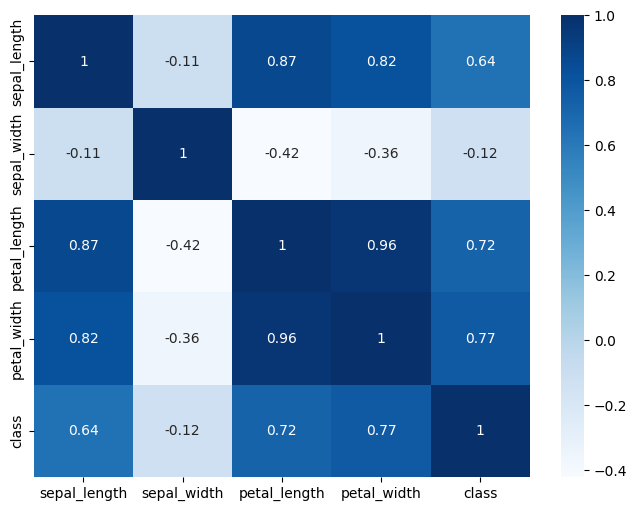

In [12]:
warnings.filterwarnings('ignore')
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(iris_pd.corr(), annot = True, cmap = 'Blues')
plt.show()

#### Observe:

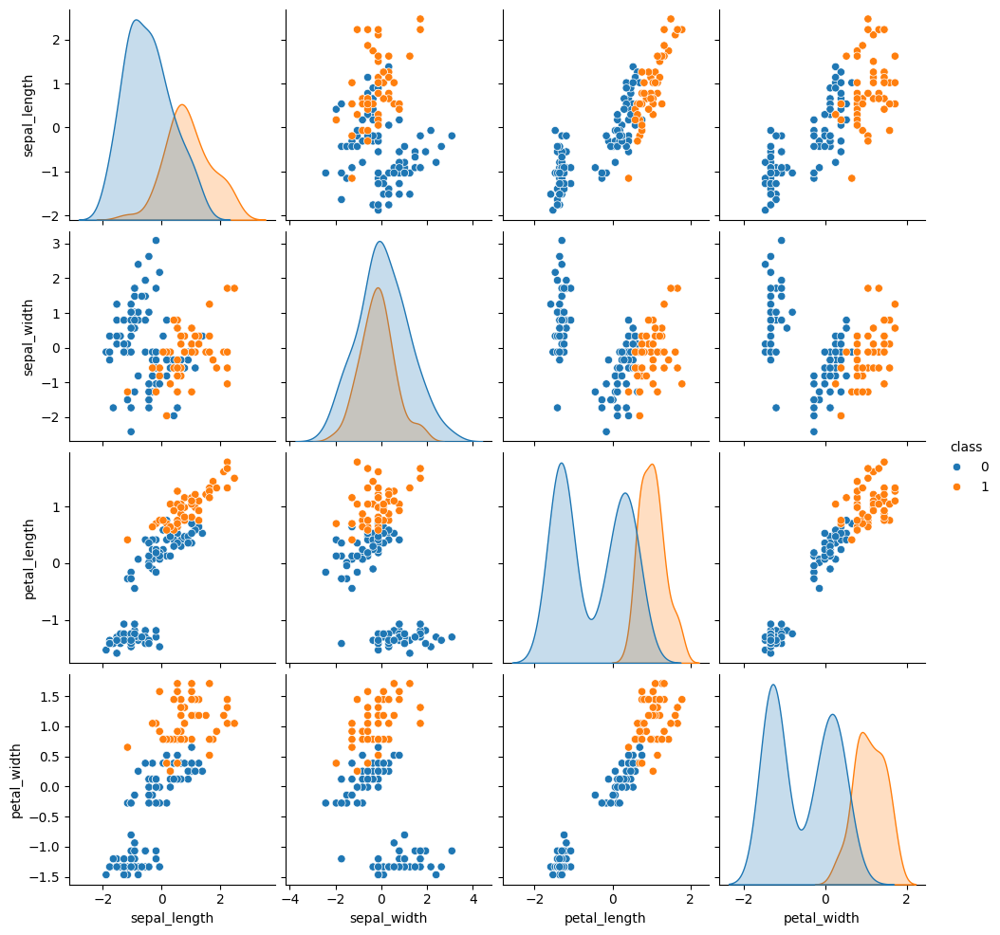

In [13]:
sns.pairplot(iris_pd, hue='class')
plt.show()

#### Observe:

## Wine

### Load dataset

In [14]:
wine = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/wine-quality/winequality-red.csv',delimiter=';')
# Replace all qualities>5 with high otherwise low
wine['quality'] = wine['quality'].apply(lambda x: 'high' if x > 5 else 'low')

In [15]:
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,low
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,low
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,low
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,high
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,low


In [16]:
print(wine.dtypes)

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                  object
dtype: object


### Drop duplicated observations

In [17]:
duplicated_rows = wine[wine.duplicated()]
print("Rows to remove:", duplicated_rows.shape)

Rows to remove: (240, 12)


In [18]:
wine = wine.drop_duplicates()
wine.shape

(1359, 12)

### Check for missing observations

In [19]:
print(wine.isnull().sum())

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64


### Split data-labels

In [20]:
wine.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
count,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000,1359.000000
mean,8.310596,0.529478,0.272333,2.523400,0.088124,15.893304,46.825975,0.996709,3.309787,0.658705,10.432315
std,1.736990,0.183031,0.195537,1.352314,0.049377,10.447270,33.408946,0.001869,0.155036,0.170667,1.082065
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996700,3.310000,0.620000,10.200000
75%,9.200000,0.640000,0.430000,2.600000,0.091000,21.000000,63.000000,0.997820,3.400000,0.730000,11.100000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000


In [21]:
X_wine = wine.iloc[:, :-1].values
y_wine = wine.iloc[:, -1].apply(lambda x: 1 if x == 'high' else 0).values
y_wine[:10], X_wine.shape, y_wine.shape

(array([0, 0, 0, 1, 0, 0, 1, 1, 0, 0]), (1359, 11), (1359,))

### Scale data

In [22]:
scale = StandardScaler()
X_wine = scale.fit_transform(X_wine)

### Observe data

In [23]:
X_wine_pd = pd.DataFrame(X_wine, columns=wine.columns[:-1])
y_wine_pd = pd.DataFrame(y_wine, columns=wine.columns[-1:])
wine_pd = pd.concat([X_wine_pd, y_wine_pd], axis=1)
wine_pd.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.255124,0.667437,0.111025,0.085886,-0.140580,-0.103777,0.670195,-0.686685,0.190269,-0.061596,0.091761
volatile acidity,-0.255124,1.000000,-0.551248,-0.002449,0.055154,-0.020945,0.071701,0.023943,0.247111,-0.256948,-0.197812,-0.327195
citric acid,0.667437,-0.551248,1.000000,0.143892,0.210195,-0.048004,0.047358,0.357962,-0.550310,0.326062,0.105108,0.167903
residual sugar,0.111025,-0.002449,0.143892,1.000000,0.026656,0.160527,0.201038,0.324522,-0.083143,-0.011837,0.063281,-0.002371
chlorides,0.085886,0.055154,0.210195,0.026656,1.000000,0.000749,0.045773,0.193592,-0.270893,0.394557,-0.223824,-0.115071
free sulfur dioxide,-0.140580,-0.020945,-0.048004,0.160527,0.000749,1.000000,0.667246,-0.018071,0.056631,0.054126,-0.080125,-0.069207
total sulfur dioxide,-0.103777,0.071701,0.047358,0.201038,0.045773,0.667246,1.000000,0.078141,-0.079257,0.035291,-0.217829,-0.235046
density,0.670195,0.023943,0.357962,0.324522,0.193592,-0.018071,0.078141,1.000000,-0.355617,0.146036,-0.504995,-0.168958
pH,-0.686685,0.247111,-0.550310,-0.083143,-0.270893,0.056631,-0.079257,-0.355617,1.000000,-0.214134,0.213418,0.004693
sulphates,0.190269,-0.256948,0.326062,-0.011837,0.394557,0.054126,0.035291,0.146036,-0.214134,1.000000,0.091621,0.211365


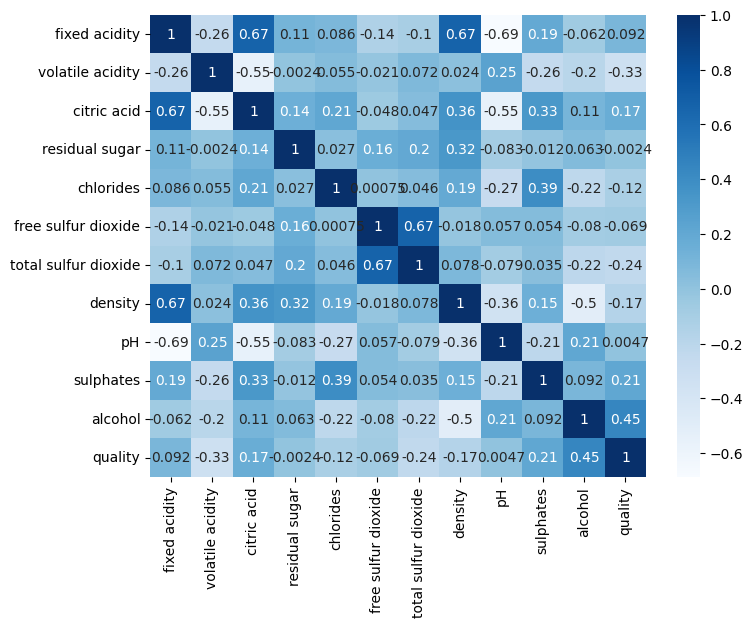

In [24]:
warnings.filterwarnings('ignore')
fig, ax = plt.subplots(figsize=(8, 6))
sns.heatmap(wine_pd.corr(), annot = True, cmap = 'Blues')
plt.show()

#### Observe:

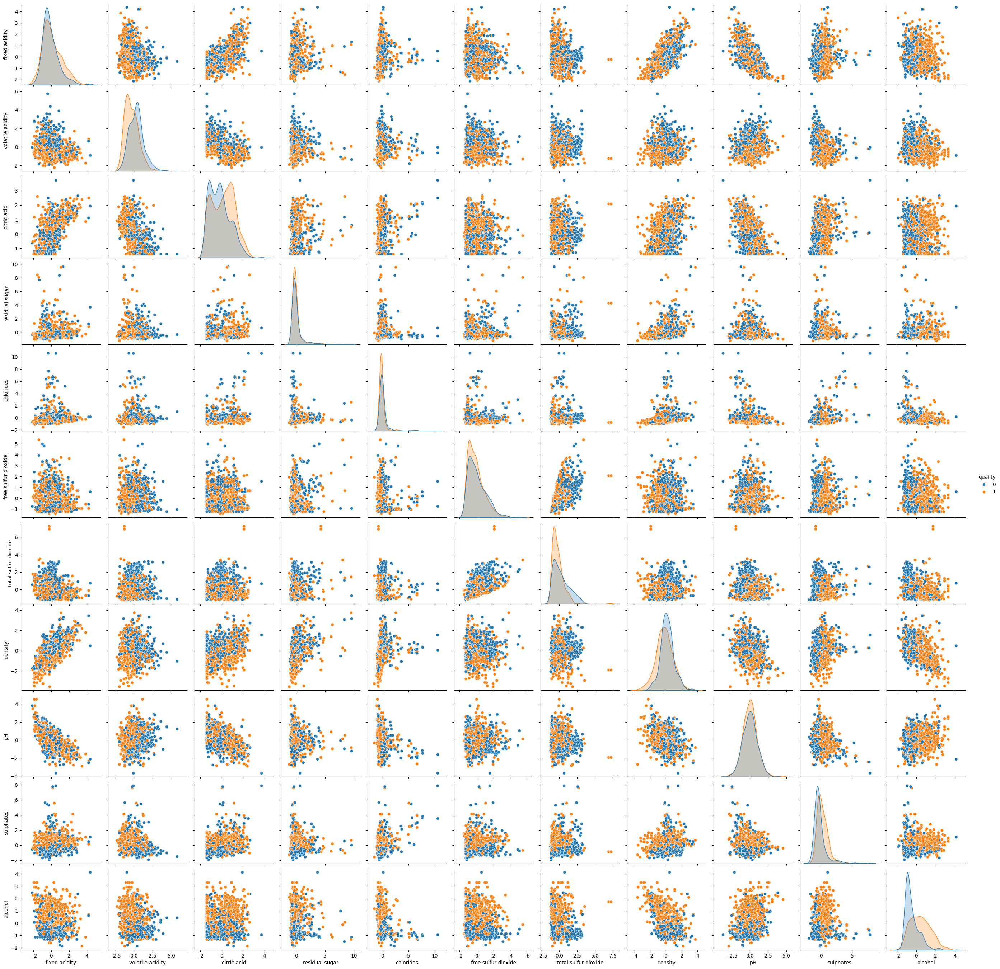

In [25]:
sns.pairplot(wine_pd, hue='quality')
plt.show()

#### Observe:

## Cancer

### Load dataset

In [26]:
cancer = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/breast-cancer-wisconsin/wdbc.data', header=None)
cancer.columns = [ "ID", "Diagnosis", "Radius_mean", "Texture_mean", "Perimeter_mean", "Area_mean", "Smoothness_mean", "Compactness_mean", "Concavity_mean", "Concave_points_mean", "Symmetry_mean", "Fractal_dimension_mean", "Radius_se", "Texture_se", "Perimeter_se", "Area_se", "Smoothness_se", "Compactness_se", "Concavity_se", "Concave_points_se", "Symmetry_se", "Fractal_dimension_se", "Radius_worst", "Texture_worst", "Perimeter_worst", "Area_worst", "Smoothness_worst", "Compactness_worst", "Concavity_worst", "Concave_points_worst", "Symmetry_worst", "Fractal_dimension_worst" ]
# drop ID column
cancer = cancer.drop(columns='ID')

In [27]:
cancer.head()

,Diagnosis,Radius_mean,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave_points_mean,Symmetry_mean,...,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave_points_worst,Symmetry_worst,Fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [28]:
print(cancer.dtypes)

Diagnosis                   object
Radius_mean                float64
Texture_mean               float64
Perimeter_mean             float64
Area_mean                  float64
Smoothness_mean            float64
Compactness_mean           float64
Concavity_mean             float64
Concave_points_mean        float64
Symmetry_mean              float64
Fractal_dimension_mean     float64
Radius_se                  float64
Texture_se                 float64
Perimeter_se               float64
Area_se                    float64
Smoothness_se              float64
Compactness_se             float64
Concavity_se               float64
Concave_points_se          float64
Symmetry_se                float64
Fractal_dimension_se       float64
Radius_worst               float64
Texture_worst              float64
Perimeter_worst            float64
Area_worst                 float64
Smoothness_worst           float64
Compactness_worst          float64
Concavity_worst            float64
Concave_points_worst

### Drop duplicated observations

In [29]:
duplicated_rows = cancer[cancer.duplicated()]
print("Rows to remove:", duplicated_rows.shape)

Rows to remove: (0, 31)


In [30]:
cancer = cancer.drop_duplicates()
cancer.shape

(569, 31)

### Check for missing observations

In [31]:
print(cancer.isnull().sum())

Diagnosis                  0
Radius_mean                0
Texture_mean               0
Perimeter_mean             0
Area_mean                  0
Smoothness_mean            0
Compactness_mean           0
Concavity_mean             0
Concave_points_mean        0
Symmetry_mean              0
Fractal_dimension_mean     0
Radius_se                  0
Texture_se                 0
Perimeter_se               0
Area_se                    0
Smoothness_se              0
Compactness_se             0
Concavity_se               0
Concave_points_se          0
Symmetry_se                0
Fractal_dimension_se       0
Radius_worst               0
Texture_worst              0
Perimeter_worst            0
Area_worst                 0
Smoothness_worst           0
Compactness_worst          0
Concavity_worst            0
Concave_points_worst       0
Symmetry_worst             0
Fractal_dimension_worst    0
dtype: int64


### Split data-labels

In [32]:
cancer.describe()

,Radius_mean,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave_points_mean,Symmetry_mean,Fractal_dimension_mean,...,Radius_worst,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave_points_worst,Symmetry_worst,Fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [33]:
X_cancer = cancer.iloc[:, 1:].values
y_cancer = cancer.iloc[:, 0].apply(lambda x: 1 if x == 'M' else 0).values
y_cancer[:10], X_cancer.shape, y_cancer.shape

(array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1]), (569, 30), (569,))

### Scale data

In [34]:
scale = StandardScaler()
X_cancer = scale.fit_transform(X_cancer)

### Observe data

In [35]:
X_cancer_pd = pd.DataFrame(X_cancer, columns=cancer.columns[1:])
y_cancer_pd = pd.DataFrame(y_cancer, columns=cancer.columns[:1])
cancer_pd = pd.concat([X_cancer_pd, y_cancer_pd], axis=1)
cancer_pd.corr()

,Radius_mean,Texture_mean,Perimeter_mean,Area_mean,Smoothness_mean,Compactness_mean,Concavity_mean,Concave_points_mean,Symmetry_mean,Fractal_dimension_mean,...,Texture_worst,Perimeter_worst,Area_worst,Smoothness_worst,Compactness_worst,Concavity_worst,Concave_points_worst,Symmetry_worst,Fractal_dimension_worst,Diagnosis
Radius_mean,1.000000,0.323782,0.997855,0.987357,0.170581,0.506124,0.676764,0.822529,0.147741,-0.311631,...,0.297008,0.965137,0.941082,0.119616,0.413463,0.526911,0.744214,0.163953,0.007066,0.730029
Texture_mean,0.323782,1.000000,0.329533,0.321086,-0.023389,0.236702,0.302418,0.293464,0.071401,-0.076437,...,0.912045,0.358040,0.343546,0.077503,0.277830,0.301025,0.295316,0.105008,0.119205,0.415185
Perimeter_mean,0.997855,0.329533,1.000000,0.986507,0.207278,0.556936,0.716136,0.850977,0.183027,-0.261477,...,0.303038,0.970387,0.941550,0.150549,0.455774,0.563879,0.771241,0.189115,0.051019,0.742636
Area_mean,0.987357,0.321086,0.986507,1.000000,0.177028,0.498502,0.685983,0.823269,0.151293,-0.283110,...,0.287489,0.959120,0.959213,0.123523,0.390410,0.512606,0.722017,0.143570,0.003738,0.708984
Smoothness_mean,0.170581,-0.023389,0.207278,0.177028,1.000000,0.659123,0.521984,0.553695,0.557775,0.584792,...,0.036072,0.238853,0.206718,0.805324,0.472468,0.434926,0.503053,0.394309,0.499316,0.358560
Compactness_mean,0.506124,0.236702,0.556936,0.498502,0.659123,1.000000,0.883121,0.831135,0.602641,0.565369,...,0.248133,0.590210,0.509604,0.565541,0.865809,0.816275,0.815573,0.510223,0.687382,0.596534
Concavity_mean,0.676764,0.302418,0.716136,0.685983,0.521984,0.883121,1.000000,0.921391,0.500667,0.336783,...,0.299879,0.729565,0.675987,0.448822,0.754968,0.884103,0.861323,0.409464,0.514930,0.696360
Concave_points_mean,0.822529,0.293464,0.850977,0.823269,0.553695,0.831135,0.921391,1.000000,0.462497,0.166917,...,0.292752,0.855923,0.809630,0.452753,0.667454,0.752399,0.910155,0.375744,0.368661,0.776614
Symmetry_mean,0.147741,0.071401,0.183027,0.151293,0.557775,0.602641,0.500667,0.462497,1.000000,0.479921,...,0.090651,0.219169,0.177193,0.426675,0.473200,0.433721,0.430297,0.699826,0.438413,0.330499
Fractal_dimension_mean,-0.311631,-0.076437,-0.261477,-0.283110,0.584792,0.565369,0.336783,0.166917,0.479921,1.000000,...,-0.051269,-0.205151,-0.231854,0.504942,0.458798,0.346234,0.175325,0.334019,0.767297,-0.012838


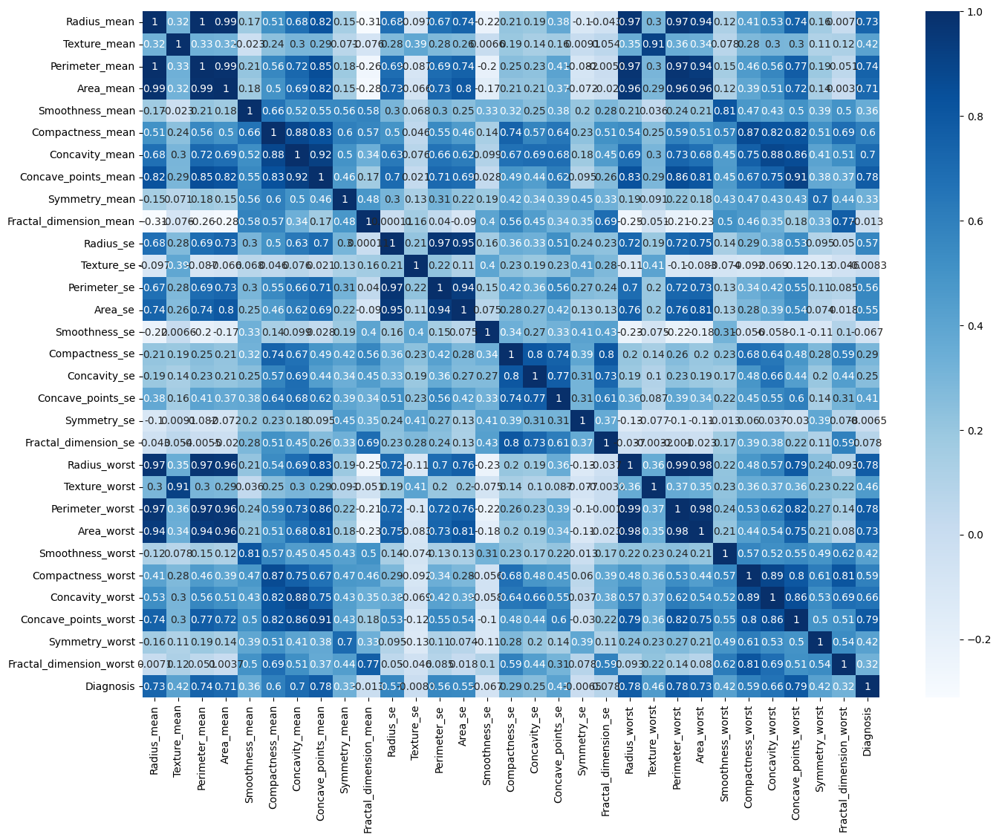

In [36]:
warnings.filterwarnings('ignore')
fig, ax = plt.subplots(figsize=(16, 12))
sns.heatmap(cancer_pd.corr(), annot = True, cmap = 'Blues')
plt.show()

#### Observe:

In [37]:
# sns.pairplot(cancer_pd, hue='Diagnosis')
# plt.show()

#### Observe:

## Bank

### Load dataset

In [38]:
import zipfile
import io
import requests

response = requests.get('https://archive.ics.uci.edu/ml/machine-learning-databases/00222/bank.zip')
with zipfile.ZipFile(io.BytesIO(response.content)) as z: 
    with z.open('bank-full.csv') as f: 
        bank = pd.read_csv(f, delimiter=';')
bank


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [39]:
bank.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [40]:
print(bank.dtypes)

age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
y            object
dtype: object


### Drop duplicated observations

In [41]:
duplicated_rows = bank[bank.duplicated()]
print("Rows to remove:", duplicated_rows.shape)

Rows to remove: (0, 17)


In [42]:
bank = bank.drop_duplicates()
bank.shape

(45211, 17)

### Check for missing observations

In [43]:
print(bank.isnull().sum())

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64


### Split data-labels

In [44]:
bank.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [45]:
X_bank = bank.iloc[:, :-1].values
y_bank = bank.iloc[:, -1].apply(lambda x: 1 if x == 'yes' else 0).values
y_bank[:10], X_bank.shape, y_bank.shape

(array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0]), (45211, 16), (45211,))

### Scale data

In [46]:
from sklearn.compose import ColumnTransformer
column_names = bank.iloc[:, :-1].columns.tolist()
categorical_features = [name for name in column_names if bank.iloc[:, :-1][name].dtype == 'object']
numerical_features = [name for name in column_names if name not in categorical_features]
preprocessor = ColumnTransformer(
    transformers=[ 
        ('num', StandardScaler(), numerical_features), 
        ('cat', OneHotEncoder(), categorical_features) 
    ] 
)
X_bank = preprocessor.fit_transform(bank.iloc[:, :-1])
cat_feature_names = preprocessor.named_transformers_['cat'].get_feature_names_out(categorical_features)
all_feature_names = numerical_features + list(cat_feature_names)

X_bank = pd.DataFrame(X_bank, columns=all_feature_names)
X_bank[numerical_features]
categorical_features

['job',
 'marital',
 'education',
 'default',
 'housing',
 'loan',
 'contact',
 'month',
 'poutcome']

### Observe data

In [47]:
X_bank_pd = X_bank[numerical_features]
y_bank_pd = pd.DataFrame(y_bank, columns=bank.columns[-1:])
bank_pd = pd.concat([X_bank_pd, y_bank_pd], axis=1)
bank_pd.corr()

,age,balance,day,duration,campaign,pdays,previous,y
age,1.000000,0.097783,-0.009120,-0.004648,0.004760,-0.023758,0.001288,0.025155
balance,0.097783,1.000000,0.004503,0.021560,-0.014578,0.003435,0.016674,0.052838
day,-0.009120,0.004503,1.000000,-0.030206,0.162490,-0.093044,-0.051710,-0.028348
duration,-0.004648,0.021560,-0.030206,1.000000,-0.084570,-0.001565,0.001203,0.394521
campaign,0.004760,-0.014578,0.162490,-0.084570,1.000000,-0.088628,-0.032855,-0.073172
pdays,-0.023758,0.003435,-0.093044,-0.001565,-0.088628,1.000000,0.454820,0.103621
previous,0.001288,0.016674,-0.051710,0.001203,-0.032855,0.454820,1.000000,0.093236
y,0.025155,0.052838,-0.028348,0.394521,-0.073172,0.103621,0.093236,1.000000


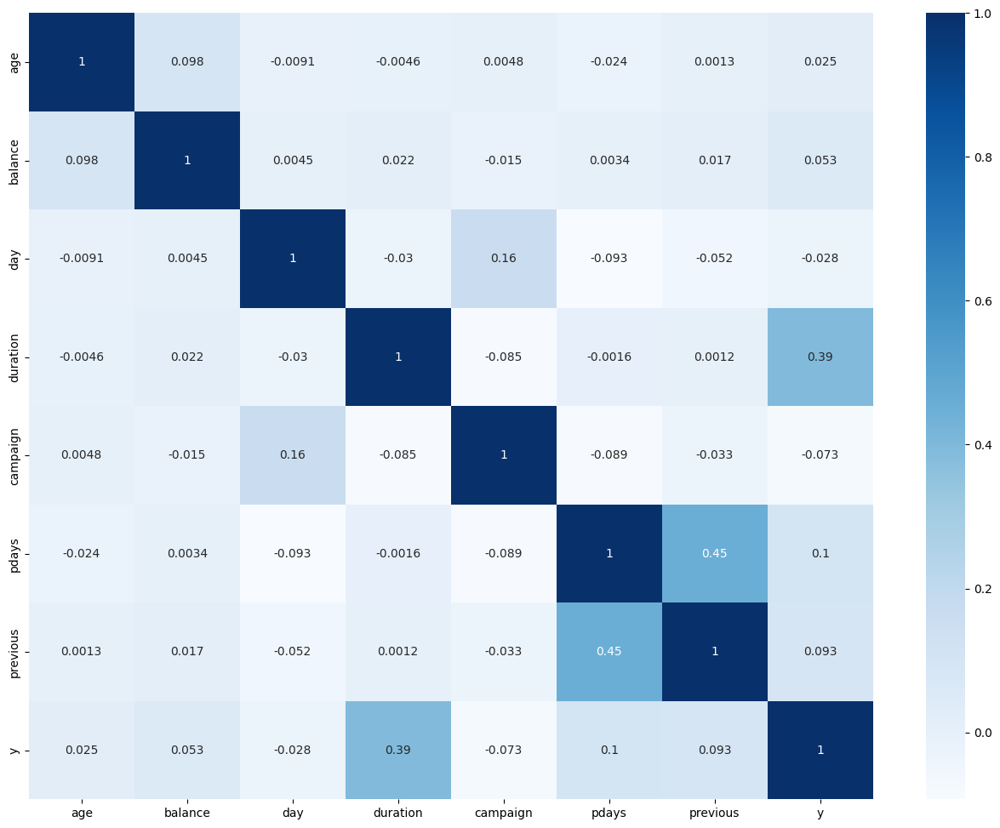

In [48]:
warnings.filterwarnings('ignore')
fig, ax = plt.subplots(figsize=(16, 12))
sns.heatmap(bank_pd.corr(), annot = True, cmap = 'Blues')
plt.show()

#### Observe:

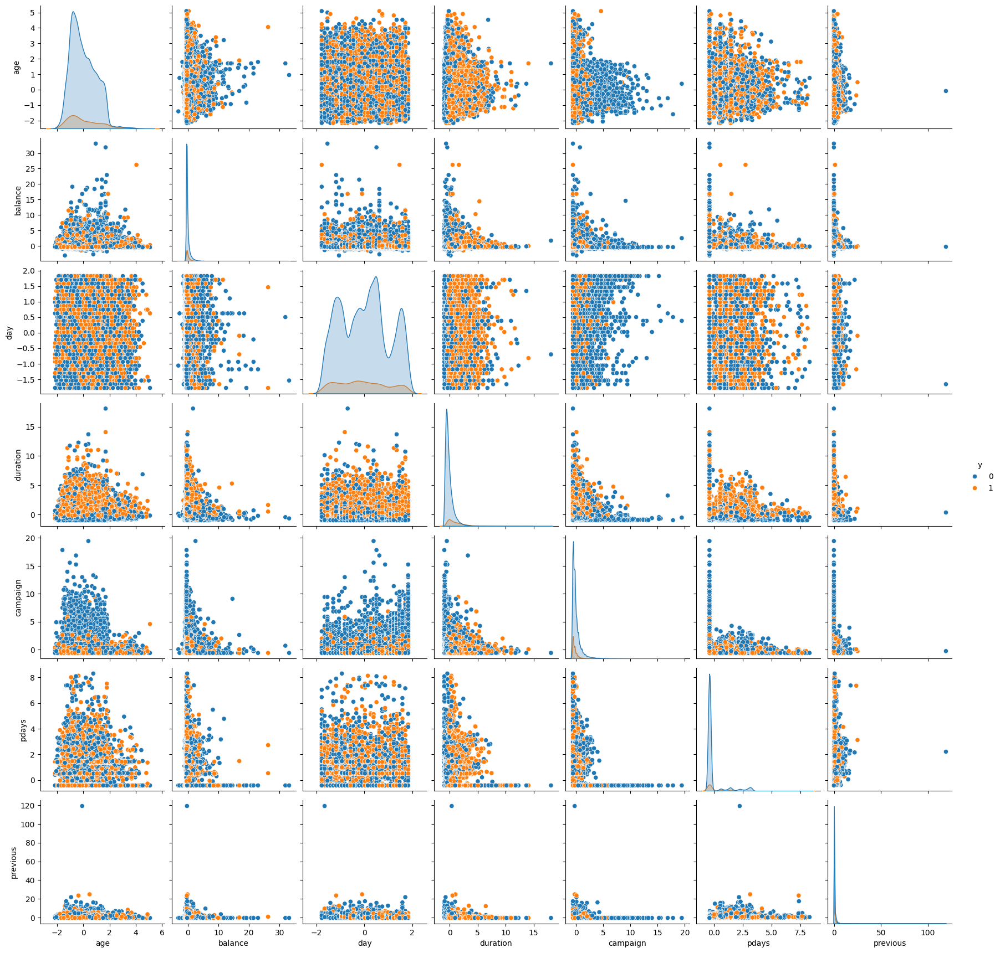

In [49]:
sns.pairplot(bank_pd, hue='y')
plt.show()

#### Observe:

# Visualization

In [50]:

def report_cm(
    model,
    X_train,
    y_train,
    X_val,
    y_val,
    X_test,
    y_test
):
    y_train_pred = model.predict(X_train)
    report_train = classification_report(y_train,y_train_pred)
    print(report_train)
    cm_train = confusion_matrix(y_train,y_train_pred)

    y_val_pred = model.predict(X_val)
    report_val = classification_report(y_val,y_val_pred)
    print(report_val)
    cm_val = confusion_matrix(y_val,y_val_pred)


    # Predictions on test data
    y_test_pred = model.predict(X_test)
    report_test = classification_report(y_test,y_test_pred)
    print(report_test)
    cm_test = confusion_matrix(y_test,y_test_pred)


    # Plot confusion matrices
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    sns.heatmap(cm_train, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix - Train')
    plt.subplot(1, 3, 2)
    sns.heatmap(cm_val, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix - Val')
    plt.subplot(1,3, 3)
    sns.heatmap(cm_test, annot=True, fmt='d', cmap='Blues')
    plt.title('Confusion Matrix - Test')
    plt.show(block=False)
    plt.close()

def plot_roc_curve(y_test, yhat_test):
    fpr, tpr, thresholds = roc_curve(y_test, yhat_test)
    roc_auc = auc(fpr, tpr)
    RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc).plot()
    plt.plot([0, 1], [0, 1], 'r--', label='Random Guess')
    plt.title('Receiver Operating Characteristic')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.legend(loc='lower right')
    plt.show()



# Split test set

In [51]:
X_iris = iris.iloc[:, :-1].values
y_iris = iris.iloc[:, -1].apply(lambda x: 1 if x == 'Iris-virginica' else 0).values
X_iris, X_iris_test, y_iris, y_iris_test = train_test_split(X_iris, y_iris, train_size=0.7,random_state=2024,shuffle=True, stratify=y_iris)
scale = StandardScaler()
X_iris = scale.fit_transform(X_iris)
X_iris_test = scale.transform(X_iris_test)

In [52]:
X_wine = wine.iloc[:, :-1].values
y_wine = wine.iloc[:, -1].apply(lambda x: 1 if x == 'high' else 0).values
X_wine, X_wine_test, y_wine, y_wine_test = train_test_split(X_wine, y_wine, train_size=0.7,random_state=2024,shuffle=True, stratify=y_wine)
scale = StandardScaler()
X_wine = scale.fit_transform(X_wine)
X_wine_test = scale.transform(X_wine_test)

In [53]:
X_cancer = cancer.iloc[:, 1:].values
y_cancer = cancer.iloc[:, 0].apply(lambda x: 1 if x == 'M' else 0).values
X_cancer, X_cancer_test, y_cancer, y_cancer_test = train_test_split(X_cancer, y_cancer, train_size=0.7,random_state=2024,shuffle=True, stratify=y_cancer)
scale = StandardScaler()
X_cancer = scale.fit_transform(X_cancer)
X_cancer_test = scale.transform(X_cancer_test)

In [54]:
X_bank = bank.iloc[:, :-1]
y_bank = bank.iloc[:, -1].apply(lambda x: 1 if x == 'yes' else 0).values
X_bank, X_bank_test, y_bank, y_bank_test = train_test_split(X_bank, y_bank, train_size=0.7,random_state=2024,shuffle=True, stratify=y_bank)
column_names = bank.iloc[:, :-1].columns.tolist()
categorical_features = [name for name in column_names if bank.iloc[:, :-1][name].dtype == 'object']
numerical_features = [name for name in column_names if name not in categorical_features]
preprocessor = ColumnTransformer(
    transformers=[ 
        ('num', StandardScaler(), numerical_features), 
        ('cat', OneHotEncoder(), categorical_features) 
    ] 
)
X_bank = preprocessor.fit_transform(X_bank)
X_bank_test = preprocessor.transform(X_bank_test)
X_bank.shape,X_bank_test.shape

((31647, 51), (13564, 51))

# Logistic Regression

## Iris

In [55]:
pipe = Pipeline(
    steps=[
        ("classifier", LogisticRegression(class_weight= 'balanced', max_iter=10000))
    ]
)
search_space = [{'classifier__C': (np.logspace(-4, 1, 6)),
                'classifier__penalty': ['l2', 'l1'],
                'classifier__solver': ['saga'],
                },
                {'classifier__C': (np.logspace(-4, 1, 6)),
                 'classifier__penalty': ['l2'],
                 'classifier__solver': ['lbfgs'],}
                ]
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [56]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [57]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_size[j], shuffle=True, stratify=y_iris)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_iris_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_iris_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__C','classifier__penalty','classifier__solver'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)
    
results = pd.concat(results, ignore_index=True)

results



,Train Size,classifier__C,classifier__penalty,classifier__solver,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,0.0001,l1,saga,0.583333,0.866667,0.836353,0.876543
1,0.1,0.0001,l2,lbfgs,0.638889,0.866667,0.836353,0.876543
2,0.1,0.0001,l2,saga,0.712963,0.866667,0.836353,0.876543
3,0.1,0.0010,l1,saga,0.527778,0.866667,0.836353,0.876543
4,0.1,0.0010,l2,lbfgs,0.731481,0.866667,0.836353,0.876543
...,...,...,...,...,...,...,...,...
157,0.9,1.0000,l2,lbfgs,0.930585,0.950549,0.974747,0.997531
158,0.9,1.0000,l2,saga,0.930585,0.950549,0.974747,0.997531
159,0.9,10.0000,l1,saga,0.941338,0.950549,0.974747,0.997531
160,0.9,10.0000,l2,lbfgs,0.948626,0.950549,0.974747,0.997531


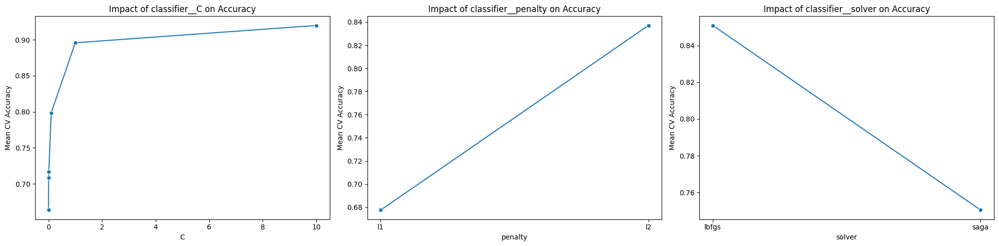

In [58]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

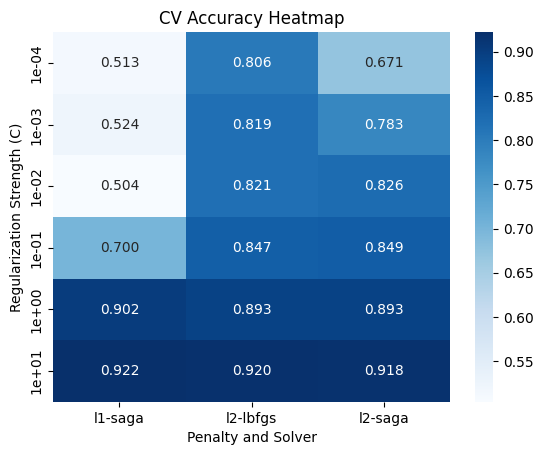

In [59]:
# Pivot table for heatmap
heatmap_data = results.pivot_table(
    values='CV_Acc', 
    index=['classifier__C'], 
    columns=['classifier__penalty', 'classifier__solver']
)
heatmap_data.index = [f"{x:.0e}" for x in heatmap_data.index]
sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
plt.title('CV Accuracy Heatmap')
plt.xlabel('Penalty and Solver')
plt.ylabel('Regularization Strength (C)')
plt.show()

### Learning Curve

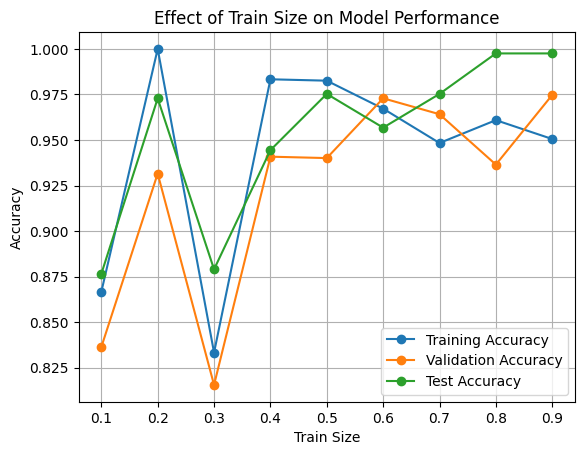

In [60]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [61]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__C,classifier__penalty,classifier__solver,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,1.0,l2,lbfgs,0.824074,0.866667,0.836353,0.876543
1,0.2,10.0,l2,lbfgs,0.936508,1.000000,0.931572,0.972840
2,0.3,10.0,l1,saga,0.911111,0.833333,0.815586,0.879012
3,0.4,10.0,l2,lbfgs,0.932845,0.983333,0.940860,0.944444
4,0.5,10.0,l2,lbfgs,0.954248,0.982571,0.940087,0.975309
5,0.6,10.0,l1,saga,0.939683,0.967213,0.972900,0.956790
6,0.7,10.0,l1,saga,0.952697,0.948357,0.964158,0.975309
7,0.8,1.0,l1,saga,0.942387,0.960905,0.936508,0.997531
8,0.9,10.0,l2,lbfgs,0.948626,0.950549,0.974747,0.997531


### Train Size = 0.2,0.5,0.8

In [62]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__C,classifier__penalty,classifier__solver,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,10.0,l2,lbfgs,0.936508,1.000000,0.931572,0.972840
1,0.5,10.0,l2,lbfgs,0.954248,0.982571,0.940087,0.975309
2,0.8,1.0,l1,saga,0.942387,0.960905,0.936508,0.997531


Train Size: 0.2
training set accuracy (n=20): 0.950
val set accuracy (n=82): 0.963
test set accuracy(n=45): 0.978
              precision    recall  f1-score   support

           0       1.00      0.92      0.96        13
           1       0.88      1.00      0.93         7

    accuracy                           0.95        20
   macro avg       0.94      0.96      0.95        20
weighted avg       0.96      0.95      0.95        20

              precision    recall  f1-score   support

           0       1.00      0.95      0.97        55
           1       0.90      1.00      0.95        27

    accuracy                           0.96        82
   macro avg       0.95      0.97      0.96        82
weighted avg       0.97      0.96      0.96        82

              precision    recall  f1-score   support

           0       1.00      0.97      0.98        30
           1       0.94      1.00      0.97        15

    accuracy                           0.98        45
   macro avg  

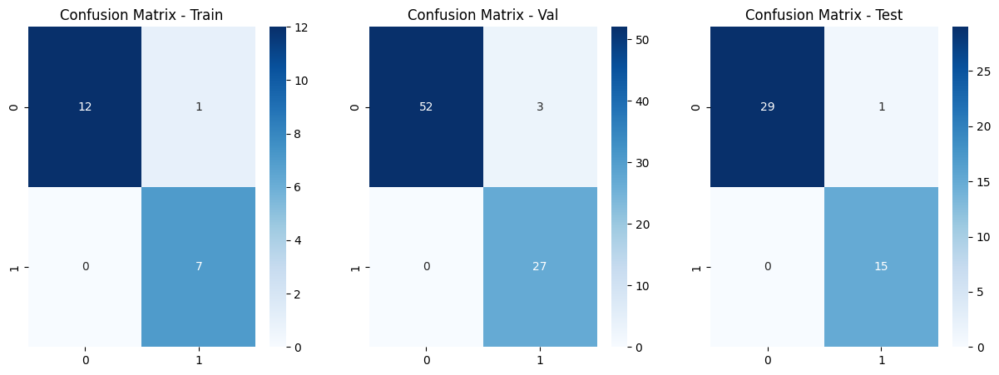

Train Size: 0.5
training set accuracy (n=51): 0.922
val set accuracy (n=51): 1.000
test set accuracy(n=45): 0.978
              precision    recall  f1-score   support

           0       0.97      0.91      0.94        34
           1       0.84      0.94      0.89        17

    accuracy                           0.92        51
   macro avg       0.91      0.93      0.91        51
weighted avg       0.93      0.92      0.92        51

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00        17

    accuracy                           1.00        51
   macro avg       1.00      1.00      1.00        51
weighted avg       1.00      1.00      1.00        51

              precision    recall  f1-score   support

           0       1.00      0.97      0.98        30
           1       0.94      1.00      0.97        15

    accuracy                           0.98        45
   macro avg  

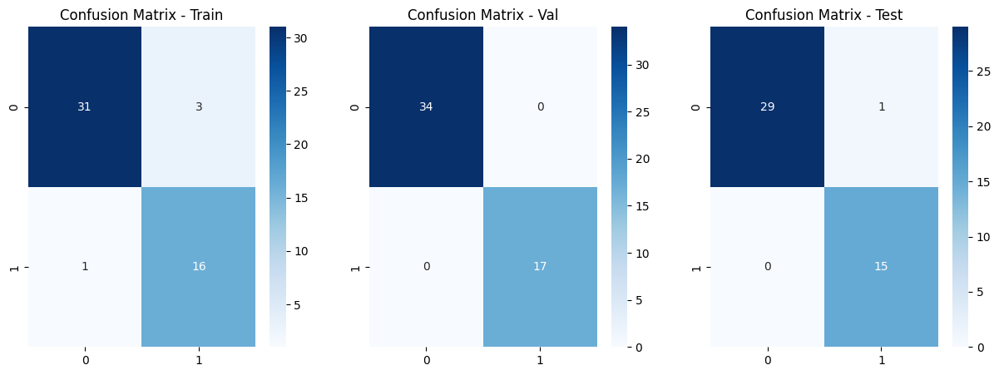

Train Size: 0.8
training set accuracy (n=81): 0.951
val set accuracy (n=21): 1.000
test set accuracy(n=45): 1.000
              precision    recall  f1-score   support

           0       0.98      0.94      0.96        54
           1       0.90      0.96      0.93        27

    accuracy                           0.95        81
   macro avg       0.94      0.95      0.95        81
weighted avg       0.95      0.95      0.95        81

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       1.00      1.00      1.00         7

    accuracy                           1.00        21
   macro avg       1.00      1.00      1.00        21
weighted avg       1.00      1.00      1.00        21

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        30
           1       1.00      1.00      1.00        15

    accuracy                           1.00        45
   macro avg  

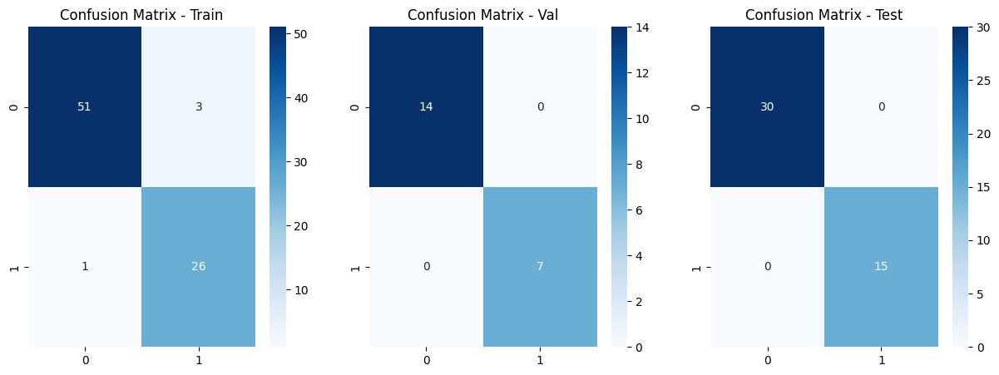

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,LogisticRegression,0.2,1.000000,0.931572,0.972840
0,LogisticRegression,0.5,0.982571,0.940087,0.975309
0,LogisticRegression,0.8,0.960905,0.936508,0.997531


In [63]:
train_sets = [0.2,0.5,0.8]
log_results_iris = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]
    best_model= Pipeline(
        steps=[
            ("classifier", LogisticRegression(
                class_weight="balanced",
                max_iter=10000,
                **{key.split("__")[1]: value for key, value in b[['classifier__C', 'classifier__penalty', 'classifier__solver']].items()}
            ))
        ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_iris)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_iris_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_iris_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_iris_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_iris_test, y_iris_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_iris_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['LogisticRegression'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_iris = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    log_results_iris= pd.concat([log_results_iris, result], axis=0)

log_results_iris

### Best Model + Train size

In [64]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.9


In [65]:
# Eyeballing
best_ratio = best_ratio

In [66]:
best_pipe= Pipeline(
        steps=[
            ("classifier", LogisticRegression(
                class_weight="balanced",
                max_iter=10000,
                **{key.split("__")[1]: value for key, value in best.iloc[best_ratio][['classifier__C', 'classifier__penalty', 'classifier__solver']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_iris)

best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"LogisticClassification_iris.joblib")
X_train.shape,X_val.shape

((91, 4), (11, 4))

In [67]:
best_model = joblib.load(f"LogisticClassification_iris.joblib")

In [68]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_iris_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_iris_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_iris_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=91): 0.967
val set accuracy (n=11): 1.000
test set accuracy(n=45): 0.978


Best model train_size: 0.9
              precision    recall  f1-score   support

           0       1.00      0.95      0.97        61
           1       0.91      1.00      0.95        30

    accuracy                           0.97        91
   macro avg       0.95      0.98      0.96        91
weighted avg       0.97      0.97      0.97        91

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         7
           1       1.00      1.00      1.00         4

    accuracy                           1.00        11
   macro avg       1.00      1.00      1.00        11
weighted avg       1.00      1.00      1.00        11

              precision    recall  f1-score   support

           0       1.00      0.97      0.98        30
           1       0.94      1.00      0.97        15

    accuracy                           0.98        45
   macro avg       0.97      0.98      0.98        45
weighted avg       0.98      0.98      0.98    

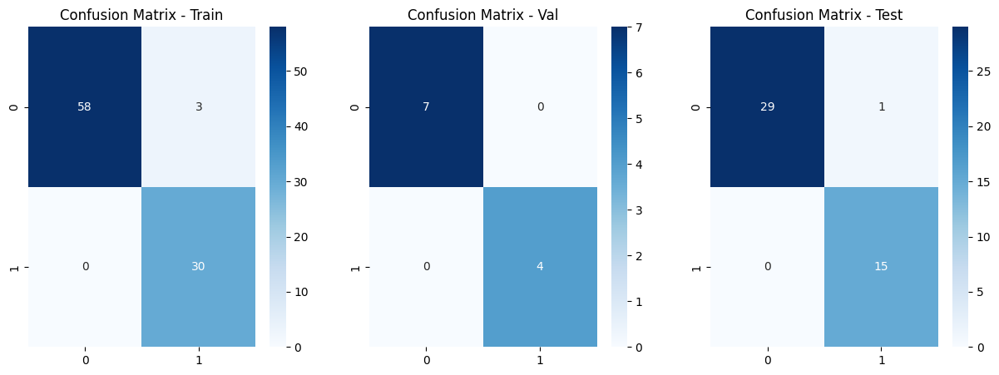

In [69]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_iris_test, y_iris_test)

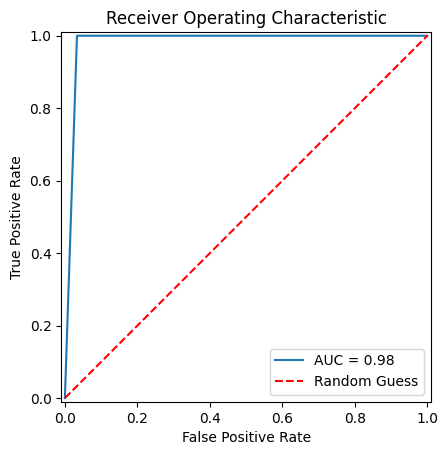

In [70]:
plot_roc_curve(y_iris_test, yhat_test)

## Wine

In [71]:
pipe = Pipeline(
    steps=[
        ("classifier", LogisticRegression(class_weight= 'balanced', max_iter=10000))
    ]
)
search_space = [{'classifier__C': (np.logspace(-4, 1, 6)),
                'classifier__penalty': ['l2', 'l1'],
                'classifier__solver': ['saga'],
                },
                {'classifier__C': (np.logspace(-4, 1, 6)),
                 'classifier__penalty': ['l2'],
                 'classifier__solver': ['lbfgs'],}
                ]
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [72]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [73]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_size[j], shuffle=True, stratify=y_wine)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_wine_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_wine_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__C','classifier__penalty','classifier__solver'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)
    
results = pd.concat(results, ignore_index=True)

results



,Train Size,classifier__C,classifier__penalty,classifier__solver,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,0.0001,l1,saga,0.487903,0.769006,0.725143,0.685185
1,0.1,0.0001,l2,lbfgs,0.670699,0.769006,0.725143,0.685185
2,0.1,0.0001,l2,saga,0.586022,0.769006,0.725143,0.685185
3,0.1,0.0010,l1,saga,0.487679,0.769006,0.725143,0.685185
4,0.1,0.0010,l2,lbfgs,0.674171,0.769006,0.725143,0.685185
...,...,...,...,...,...,...,...,...
157,0.9,1.0000,l2,lbfgs,0.752047,0.752047,0.828704,0.707244
158,0.9,1.0000,l2,saga,0.752047,0.752047,0.828704,0.707244
159,0.9,10.0000,l1,saga,0.752047,0.752047,0.828704,0.707244
160,0.9,10.0000,l2,lbfgs,0.751657,0.752047,0.828704,0.707244


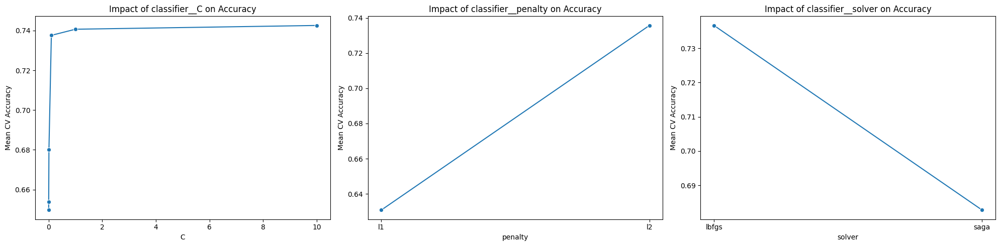

In [74]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

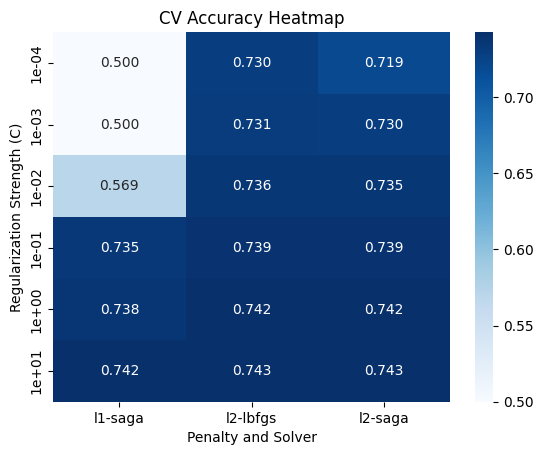

In [75]:
# Pivot table for heatmap
heatmap_data = results.pivot_table(
    values='CV_Acc', 
    index=['classifier__C'], 
    columns=['classifier__penalty', 'classifier__solver']
)
heatmap_data.index = [f"{x:.0e}" for x in heatmap_data.index]
sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
plt.title('CV Accuracy Heatmap')
plt.xlabel('Penalty and Solver')
plt.ylabel('Regularization Strength (C)')
plt.show()

### Learning Curve

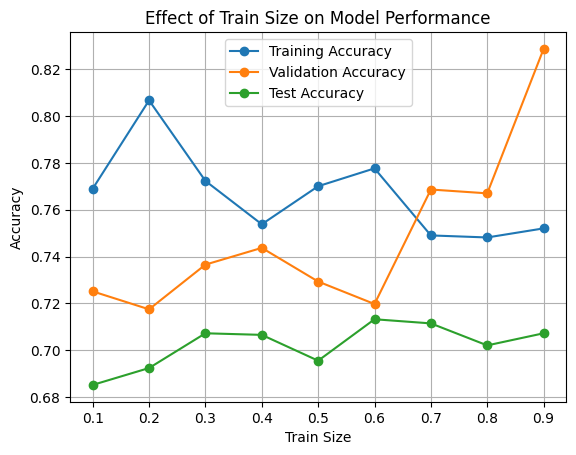

In [76]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [77]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__C,classifier__penalty,classifier__solver,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,10.00,l1,saga,0.695116,0.769006,0.725143,0.685185
1,0.2,1.00,l2,lbfgs,0.768326,0.806725,0.717477,0.692402
2,0.3,0.01,l2,lbfgs,0.754386,0.772320,0.736570,0.707244
3,0.4,0.10,l2,lbfgs,0.750864,0.753801,0.743724,0.706563
4,0.5,0.10,l2,lbfgs,0.746614,0.770058,0.729342,0.695534
5,0.6,10.00,l2,saga,0.763743,0.777680,0.719743,0.713235
6,0.7,1.00,l1,saga,0.737328,0.749039,0.768648,0.711465
7,0.8,0.10,l1,saga,0.741209,0.748173,0.767016,0.702070
8,0.9,1.00,l2,lbfgs,0.752047,0.752047,0.828704,0.707244


### Train Size = 0.2,0.5,0.8

In [78]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__C,classifier__penalty,classifier__solver,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,1.0,l2,lbfgs,0.768326,0.806725,0.717477,0.692402
1,0.5,0.1,l2,lbfgs,0.746614,0.770058,0.729342,0.695534
2,0.8,0.1,l1,saga,0.741209,0.748173,0.767016,0.702070


Train Size: 0.2
training set accuracy (n=190): 0.737
val set accuracy (n=761): 0.745
test set accuracy(n=408): 0.721
              precision    recall  f1-score   support

           0       0.69      0.82      0.75        90
           1       0.80      0.66      0.73       100

    accuracy                           0.74       190
   macro avg       0.75      0.74      0.74       190
weighted avg       0.75      0.74      0.74       190

              precision    recall  f1-score   support

           0       0.73      0.73      0.73       358
           1       0.76      0.76      0.76       403

    accuracy                           0.75       761
   macro avg       0.74      0.74      0.74       761
weighted avg       0.74      0.75      0.75       761

              precision    recall  f1-score   support

           0       0.72      0.67      0.69       192
           1       0.72      0.76      0.74       216

    accuracy                           0.72       408
   macro av

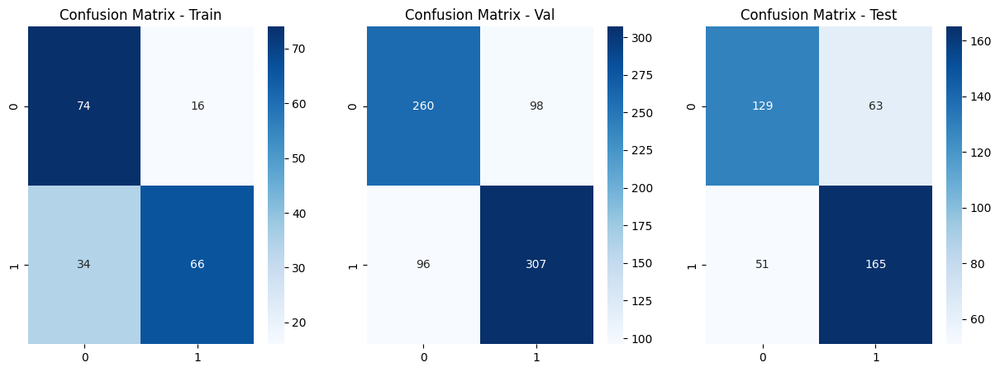

Train Size: 0.5
training set accuracy (n=475): 0.762
val set accuracy (n=476): 0.739
test set accuracy(n=408): 0.703
              precision    recall  f1-score   support

           0       0.72      0.81      0.76       224
           1       0.81      0.72      0.76       251

    accuracy                           0.76       475
   macro avg       0.77      0.76      0.76       475
weighted avg       0.77      0.76      0.76       475

              precision    recall  f1-score   support

           0       0.71      0.76      0.73       224
           1       0.77      0.72      0.74       252

    accuracy                           0.74       476
   macro avg       0.74      0.74      0.74       476
weighted avg       0.74      0.74      0.74       476

              precision    recall  f1-score   support

           0       0.68      0.70      0.69       192
           1       0.73      0.70      0.72       216

    accuracy                           0.70       408
   macro av

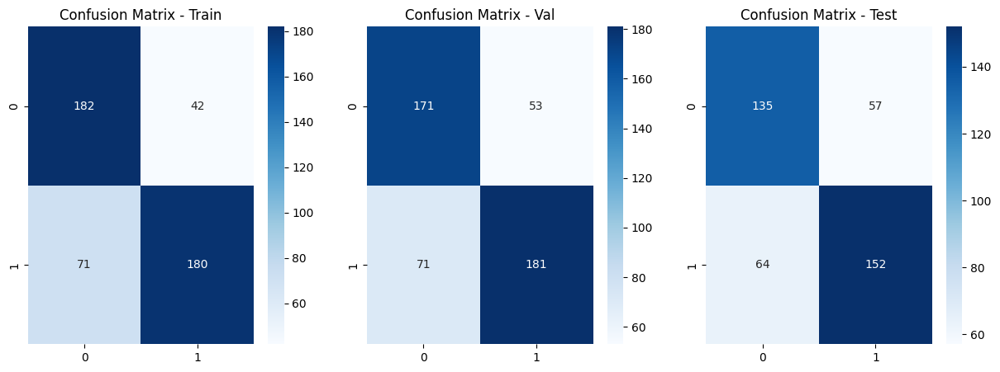

Train Size: 0.8
training set accuracy (n=760): 0.754
val set accuracy (n=191): 0.738
test set accuracy(n=408): 0.708
              precision    recall  f1-score   support

           0       0.71      0.80      0.75       358
           1       0.80      0.71      0.75       402

    accuracy                           0.75       760
   macro avg       0.76      0.76      0.75       760
weighted avg       0.76      0.75      0.75       760

              precision    recall  f1-score   support

           0       0.70      0.78      0.74        90
           1       0.78      0.70      0.74       101

    accuracy                           0.74       191
   macro avg       0.74      0.74      0.74       191
weighted avg       0.74      0.74      0.74       191

              precision    recall  f1-score   support

           0       0.68      0.73      0.70       192
           1       0.74      0.69      0.71       216

    accuracy                           0.71       408
   macro av

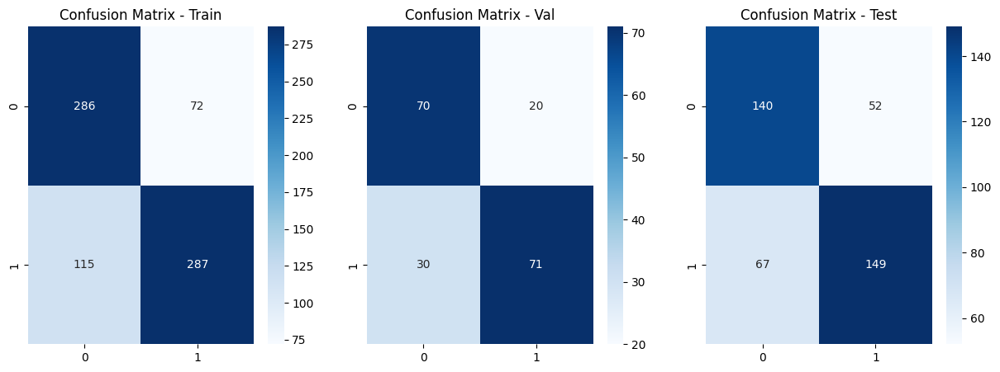

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,LogisticRegression,0.2,0.806725,0.717477,0.692402
0,LogisticRegression,0.5,0.770058,0.729342,0.695534
0,LogisticRegression,0.8,0.748173,0.767016,0.702070


In [79]:
train_sets = [0.2,0.5,0.8]
log_results_wine = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]
    best_model= Pipeline(
        steps=[
            ("classifier", LogisticRegression(
                class_weight="balanced",
                max_iter=10000,
                **{key.split("__")[1]: value for key, value in b[['classifier__C', 'classifier__penalty', 'classifier__solver']].items()}
            ))
        ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_wine)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_wine_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_wine_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_wine_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_wine_test, y_wine_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_wine_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['LogisticRegression'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_wine = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    log_results_wine= pd.concat([log_results_wine, result], axis=0)

log_results_wine

### Best Model + Train size

In [80]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.9


In [81]:
# Eyeballing
best_ratio = best_ratio

In [82]:
best_pipe= Pipeline(
        steps=[
            ("classifier", LogisticRegression(
                class_weight="balanced",
                max_iter=10000,
                **{key.split("__")[1]: value for key, value in best.iloc[best_ratio][['classifier__C', 'classifier__penalty', 'classifier__solver']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_wine)

best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"LogisticClassification_wine.joblib")
X_train.shape,X_val.shape

((855, 11), (96, 11))

In [83]:
best_model = joblib.load(f"LogisticClassification_wine.joblib")

In [84]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_wine_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_wine_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_wine_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=855): 0.764
val set accuracy (n=96): 0.719
test set accuracy(n=408): 0.706


Best model train_size: 0.9
              precision    recall  f1-score   support

           0       0.72      0.81      0.76       403
           1       0.81      0.73      0.76       452

    accuracy                           0.76       855
   macro avg       0.77      0.77      0.76       855
weighted avg       0.77      0.76      0.76       855

              precision    recall  f1-score   support

           0       0.67      0.78      0.72        45
           1       0.77      0.67      0.72        51

    accuracy                           0.72        96
   macro avg       0.72      0.72      0.72        96
weighted avg       0.73      0.72      0.72        96

              precision    recall  f1-score   support

           0       0.68      0.71      0.70       192
           1       0.73      0.70      0.72       216

    accuracy                           0.71       408
   macro avg       0.71      0.71      0.71       408
weighted avg       0.71      0.71      0.71    

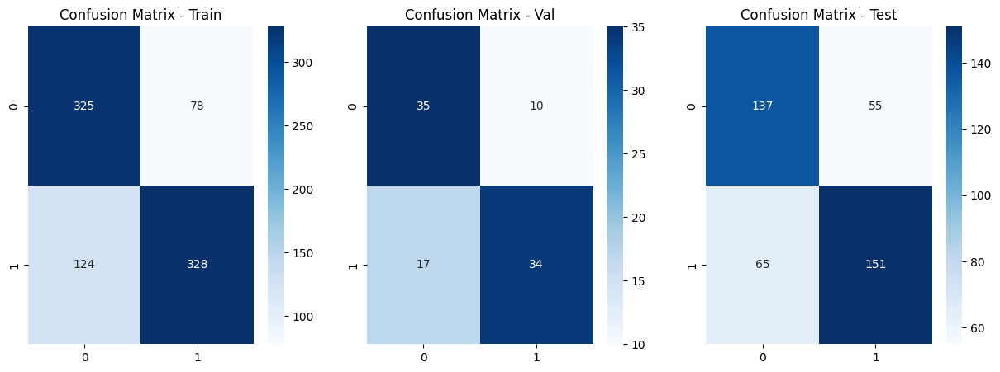

In [85]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_wine_test, y_wine_test)

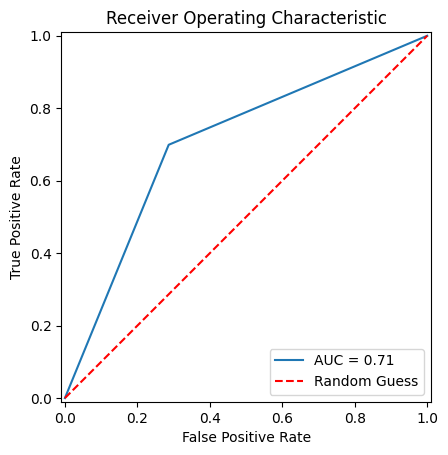

In [86]:
plot_roc_curve(y_wine_test, yhat_test)

## Cancer

In [87]:
pipe = Pipeline(
    steps=[
        ("classifier", LogisticRegression(class_weight= 'balanced', max_iter=10000))
    ]
)
search_space = [{'classifier__C': (np.logspace(-4, 1, 6)),
                'classifier__penalty': ['l2', 'l1'],
                'classifier__solver': ['saga'],
                },
                {'classifier__C': (np.logspace(-4, 1, 6)),
                 'classifier__penalty': ['l2'],
                 'classifier__solver': ['lbfgs'],}
                ]
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [88]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [89]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_size[j], shuffle=True, stratify=y_cancer)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_cancer_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_cancer_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__C','classifier__penalty','classifier__solver'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)
    
results = pd.concat(results, ignore_index=True)

results



,Train Size,classifier__C,classifier__penalty,classifier__solver,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,0.0001,l1,saga,0.512821,0.960114,0.908078,0.924626
1,0.1,0.0001,l2,lbfgs,0.914530,0.960114,0.908078,0.924626
2,0.1,0.0001,l2,saga,0.940171,0.960114,0.908078,0.924626
3,0.1,0.0010,l1,saga,0.512821,0.960114,0.908078,0.924626
4,0.1,0.0010,l2,lbfgs,0.914530,0.960114,0.908078,0.924626
...,...,...,...,...,...,...,...,...
157,0.9,1.0000,l2,lbfgs,0.976720,0.986344,0.972222,0.969461
158,0.9,1.0000,l2,saga,0.975794,0.986344,0.972222,0.969461
159,0.9,10.0000,l1,saga,0.958077,0.986344,0.972222,0.969461
160,0.9,10.0000,l2,lbfgs,0.959928,0.986344,0.972222,0.969461


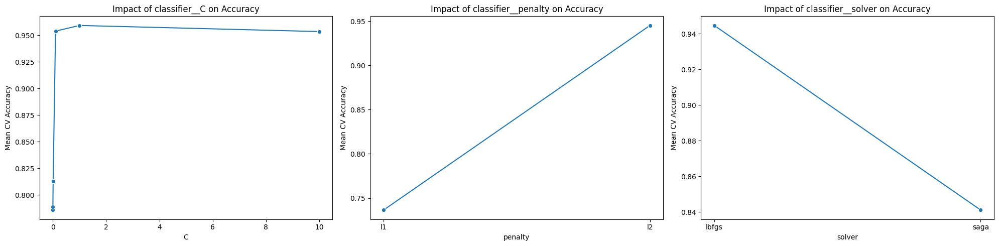

In [90]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

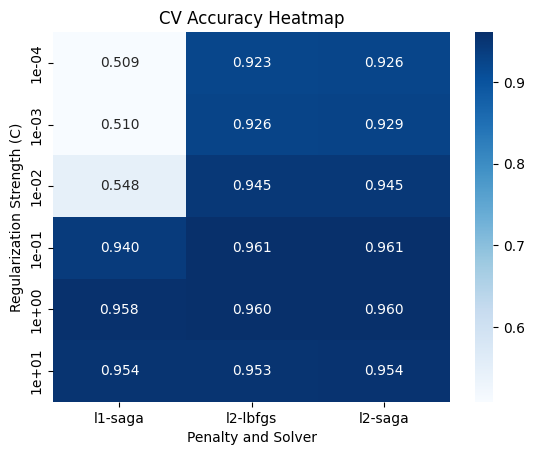

In [91]:
# Pivot table for heatmap
heatmap_data = results.pivot_table(
    values='CV_Acc', 
    index=['classifier__C'], 
    columns=['classifier__penalty', 'classifier__solver']
)
heatmap_data.index = [f"{x:.0e}" for x in heatmap_data.index]
sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
plt.title('CV Accuracy Heatmap')
plt.xlabel('Penalty and Solver')
plt.ylabel('Regularization Strength (C)')
plt.show()

### Learning Curve

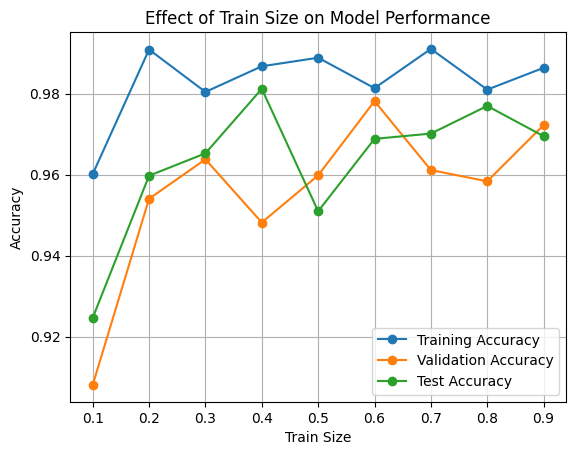

In [92]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [93]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__C,classifier__penalty,classifier__solver,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,0.0001,l2,saga,0.940171,0.960114,0.908078,0.924626
1,0.2,1.0000,l1,saga,0.970560,0.990858,0.954023,0.959714
2,0.3,0.1000,l2,lbfgs,0.957764,0.980392,0.963759,0.965237
3,0.4,0.1000,l2,lbfgs,0.968553,0.986723,0.948164,0.981157
4,0.5,1.0000,l1,saga,0.969823,0.988833,0.959799,0.950942
5,0.6,1.0000,l2,lbfgs,0.967809,0.981326,0.978125,0.968811
6,0.7,1.0000,l2,lbfgs,0.965249,0.991007,0.961111,0.970110
7,0.8,0.1000,l2,lbfgs,0.972746,0.980957,0.958333,0.976933
8,0.9,1.0000,l2,lbfgs,0.976720,0.986344,0.972222,0.969461


### Train Size = 0.2,0.5,0.8

In [94]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__C,classifier__penalty,classifier__solver,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,1.0,l1,saga,0.970560,0.990858,0.954023,0.959714
1,0.5,1.0,l1,saga,0.969823,0.988833,0.959799,0.950942
2,0.8,0.1,l2,lbfgs,0.972746,0.980957,0.958333,0.976933


Train Size: 0.2
training set accuracy (n=79): 0.987
val set accuracy (n=319): 0.956
test set accuracy(n=171): 0.959
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        50
           1       1.00      0.97      0.98        29

    accuracy                           0.99        79
   macro avg       0.99      0.98      0.99        79
weighted avg       0.99      0.99      0.99        79

              precision    recall  f1-score   support

           0       0.96      0.97      0.97       200
           1       0.96      0.92      0.94       119

    accuracy                           0.96       319
   macro avg       0.96      0.95      0.95       319
weighted avg       0.96      0.96      0.96       319

              precision    recall  f1-score   support

           0       0.97      0.96      0.97       107
           1       0.94      0.95      0.95        64

    accuracy                           0.96       171
   macro avg

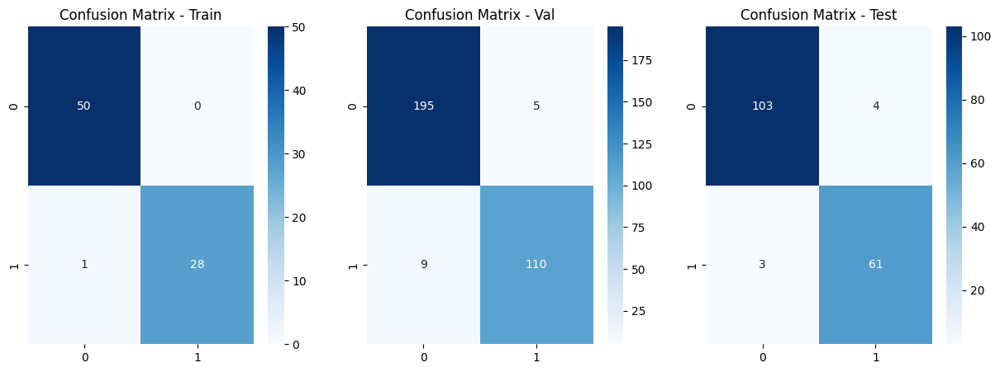

Train Size: 0.5
training set accuracy (n=199): 0.985
val set accuracy (n=199): 0.975
test set accuracy(n=171): 0.959
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       125
           1       0.99      0.97      0.98        74

    accuracy                           0.98       199
   macro avg       0.99      0.98      0.98       199
weighted avg       0.98      0.98      0.98       199

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       125
           1       0.97      0.96      0.97        74

    accuracy                           0.97       199
   macro avg       0.97      0.97      0.97       199
weighted avg       0.97      0.97      0.97       199

              precision    recall  f1-score   support

           0       0.96      0.97      0.97       107
           1       0.95      0.94      0.94        64

    accuracy                           0.96       171
   macro av

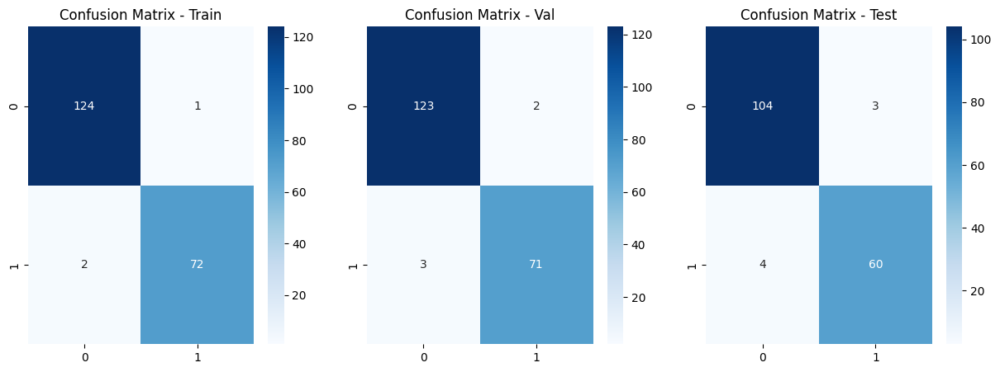

Train Size: 0.8
training set accuracy (n=318): 0.981
val set accuracy (n=80): 0.975
test set accuracy(n=171): 0.982
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       200
           1       0.98      0.97      0.97       118

    accuracy                           0.98       318
   macro avg       0.98      0.98      0.98       318
weighted avg       0.98      0.98      0.98       318

              precision    recall  f1-score   support

           0       1.00      0.96      0.98        50
           1       0.94      1.00      0.97        30

    accuracy                           0.97        80
   macro avg       0.97      0.98      0.97        80
weighted avg       0.98      0.97      0.98        80

              precision    recall  f1-score   support

           0       0.99      0.98      0.99       107
           1       0.97      0.98      0.98        64

    accuracy                           0.98       171
   macro avg

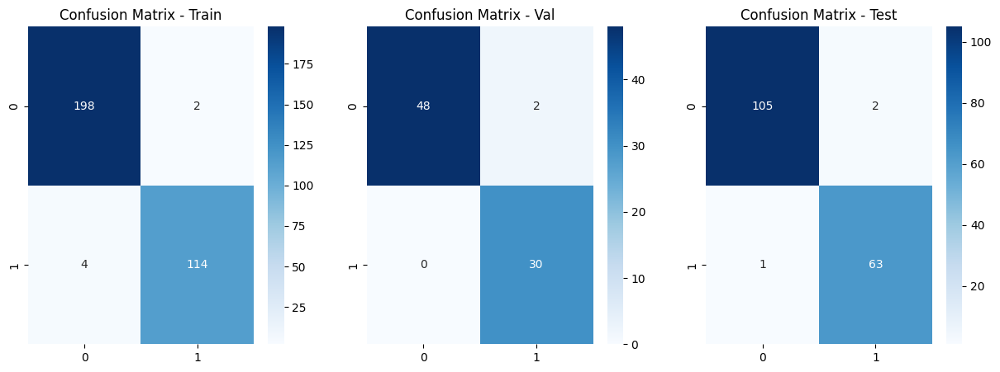

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,LogisticRegression,0.2,0.990858,0.954023,0.959714
0,LogisticRegression,0.5,0.988833,0.959799,0.950942
0,LogisticRegression,0.8,0.980957,0.958333,0.976933


In [95]:
train_sets = [0.2,0.5,0.8]
log_results_cancer = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]
    best_model= Pipeline(
        steps=[
            ("classifier", LogisticRegression(
                class_weight="balanced",
                max_iter=10000,
                **{key.split("__")[1]: value for key, value in b[['classifier__C', 'classifier__penalty', 'classifier__solver']].items()}
            ))
        ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_cancer)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_cancer_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_cancer_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_cancer_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_cancer_test, y_cancer_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_cancer_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['LogisticRegression'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_cancer = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    log_results_cancer= pd.concat([log_results_cancer, result], axis=0)

log_results_cancer

### Best Model + Train size

In [96]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.6


In [97]:
# Eyeballing
best_ratio = best_ratio

In [98]:
best_pipe= Pipeline(
        steps=[
            ("classifier", LogisticRegression(
                class_weight="balanced",
                max_iter=10000,
                **{key.split("__")[1]: value for key, value in best.iloc[best_ratio][['classifier__C', 'classifier__penalty', 'classifier__solver']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_cancer)

best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"LogisticClassification_cancer.joblib")
X_train.shape,X_val.shape

((238, 30), (160, 30))

In [99]:
best_model = joblib.load(f"LogisticClassification_cancer.joblib")

In [100]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_cancer_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_cancer_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_cancer_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=238): 0.983
val set accuracy (n=160): 0.994
test set accuracy(n=171): 0.959


Best model train_size: 0.6
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       149
           1       0.99      0.97      0.98        89

    accuracy                           0.98       238
   macro avg       0.98      0.98      0.98       238
weighted avg       0.98      0.98      0.98       238

              precision    recall  f1-score   support

           0       0.99      1.00      1.00       101
           1       1.00      0.98      0.99        59

    accuracy                           0.99       160
   macro avg       1.00      0.99      0.99       160
weighted avg       0.99      0.99      0.99       160

              precision    recall  f1-score   support

           0       0.96      0.97      0.97       107
           1       0.95      0.94      0.94        64

    accuracy                           0.96       171
   macro avg       0.96      0.95      0.96       171
weighted avg       0.96      0.96      0.96    

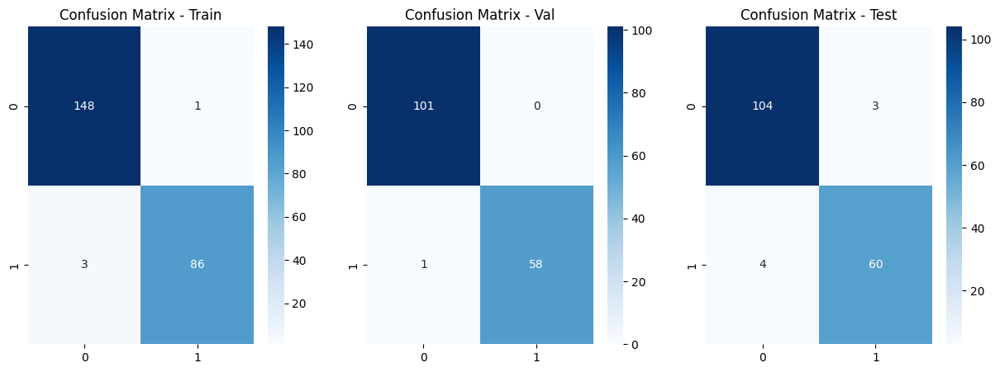

In [101]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_cancer_test, y_cancer_test)

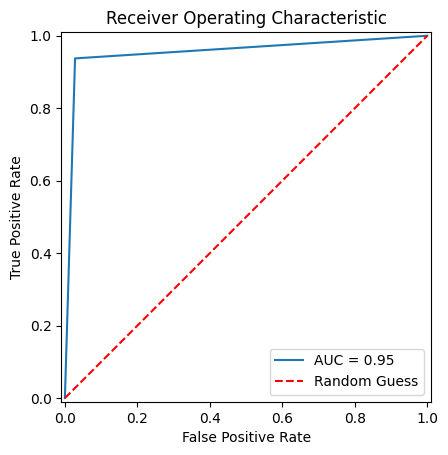

In [102]:
plot_roc_curve(y_cancer_test, yhat_test)

## Bank

In [103]:
pipe = Pipeline(
    steps=[
        ("classifier", LogisticRegression(class_weight= 'balanced', max_iter=10000))
    ]
)
search_space = [{'classifier__C': (np.logspace(-4, 1, 6)),
                'classifier__penalty': ['l2', 'l1'],
                'classifier__solver': ['saga'],
                },
                {'classifier__C': (np.logspace(-4, 1, 6)),
                 'classifier__penalty': ['l2'],
                 'classifier__solver': ['lbfgs'],}
                ]
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [104]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [105]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_size[j], shuffle=True, stratify=y_bank)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_bank_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_bank_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__C','classifier__penalty','classifier__solver'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)
    
results = pd.concat(results, ignore_index=True)

results



,Train Size,classifier__C,classifier__penalty,classifier__solver,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,0.0001,l1,saga,0.797881,0.877616,0.877241,0.876872
1,0.1,0.0001,l2,lbfgs,0.834806,0.877616,0.877241,0.876872
2,0.1,0.0001,l2,saga,0.834806,0.877616,0.877241,0.876872
3,0.1,0.0010,l1,saga,0.883059,0.877616,0.877241,0.876872
4,0.1,0.0010,l2,lbfgs,0.833753,0.877616,0.877241,0.876872
...,...,...,...,...,...,...,...,...
157,0.9,1.0000,l2,lbfgs,0.847611,0.670228,0.670265,0.670222
158,0.9,1.0000,l2,saga,0.847506,0.670228,0.670265,0.670222
159,0.9,10.0000,l1,saga,0.847658,0.670228,0.670265,0.670222
160,0.9,10.0000,l2,lbfgs,0.847834,0.670228,0.670265,0.670222


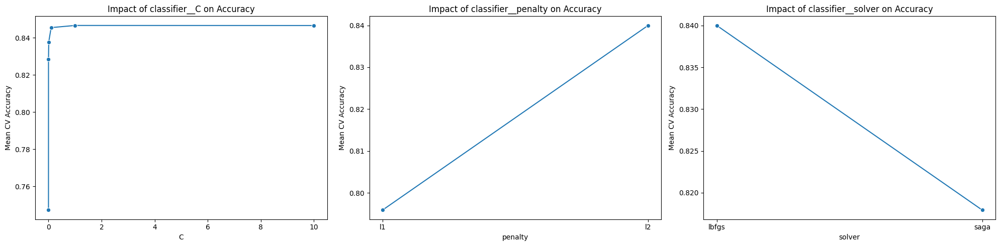

In [106]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

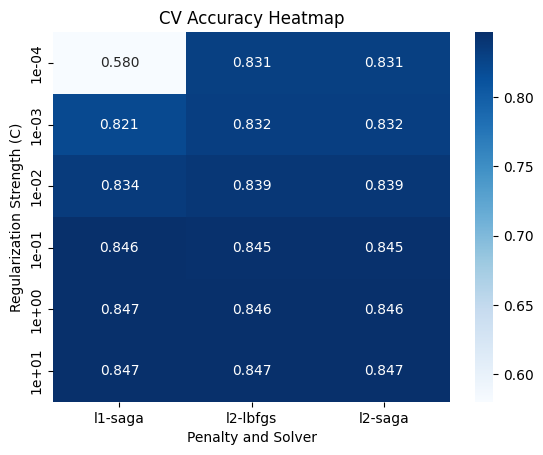

In [107]:
# Pivot table for heatmap
heatmap_data = results.pivot_table(
    values='CV_Acc', 
    index=['classifier__C'], 
    columns=['classifier__penalty', 'classifier__solver']
)
heatmap_data.index = [f"{x:.0e}" for x in heatmap_data.index]
sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
plt.title('CV Accuracy Heatmap')
plt.xlabel('Penalty and Solver')
plt.ylabel('Regularization Strength (C)')
plt.show()

### Learning Curve

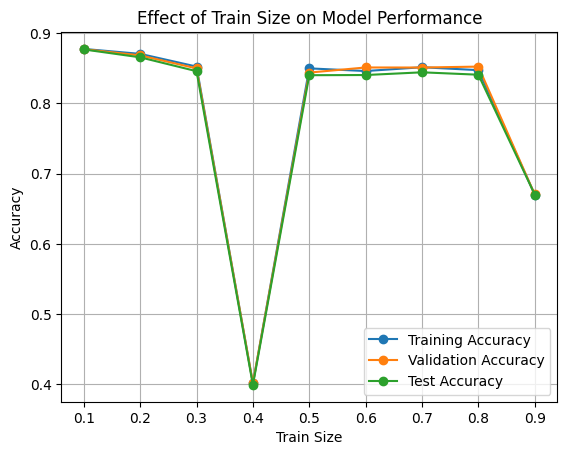

In [108]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [109]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__C,classifier__penalty,classifier__solver,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,0.0010,l1,saga,0.883059,0.877616,0.877241,0.876872
1,0.2,1.0000,l1,saga,0.845367,0.870569,0.868425,0.865657
2,0.3,1.0000,l1,saga,0.848606,0.852474,0.849892,0.845887
3,0.4,1.0000,l1,saga,0.847843,0.401117,0.401630,0.399014
4,0.5,1.0000,l1,saga,0.848132,0.849909,0.843919,0.840173
5,0.6,1.0000,l1,saga,0.845113,0.846122,0.851191,0.840435
6,0.7,10.0000,l1,saga,0.846530,0.851523,0.851109,0.844298
7,0.8,10.0000,l2,lbfgs,0.846546,0.847395,0.852422,0.840882
8,0.9,0.0001,l1,saga,0.883014,0.670228,0.670265,0.670222


### Train Size = 0.2,0.5,0.8

In [110]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__C,classifier__penalty,classifier__solver,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,1.0,l1,saga,0.845367,0.870569,0.868425,0.865657
1,0.5,1.0,l1,saga,0.848132,0.849909,0.843919,0.840173
2,0.8,10.0,l2,lbfgs,0.846546,0.847395,0.852422,0.840882


Train Size: 0.2
training set accuracy (n=6329): 0.842
val set accuracy (n=25318): 0.850
test set accuracy(n=13564): 0.840
              precision    recall  f1-score   support

           0       0.97      0.84      0.90      5589
           1       0.41      0.82      0.55       740

    accuracy                           0.84      6329
   macro avg       0.69      0.83      0.73      6329
weighted avg       0.91      0.84      0.86      6329

              precision    recall  f1-score   support

           0       0.97      0.85      0.91     22356
           1       0.43      0.82      0.56      2962

    accuracy                           0.85     25318
   macro avg       0.70      0.84      0.74     25318
weighted avg       0.91      0.85      0.87     25318

              precision    recall  f1-score   support

           0       0.97      0.85      0.90     11977
           1       0.41      0.78      0.53      1587

    accuracy                           0.84     13564
   mac

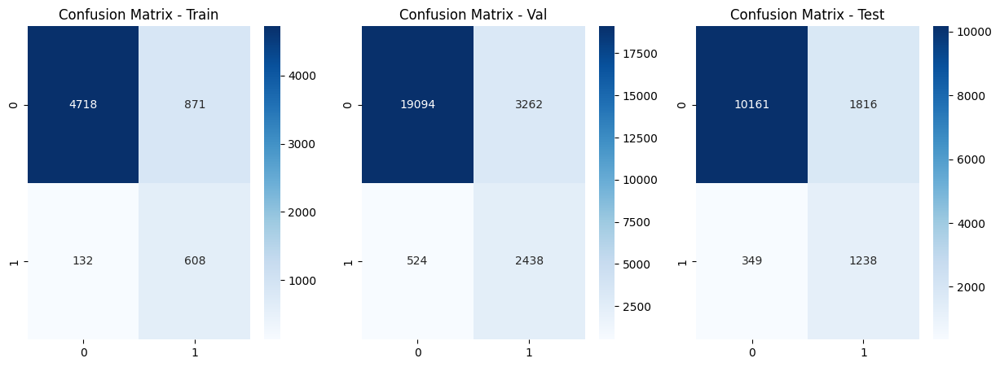

Train Size: 0.5
training set accuracy (n=15823): 0.847
val set accuracy (n=15824): 0.851
test set accuracy(n=13564): 0.841
              precision    recall  f1-score   support

           0       0.97      0.85      0.91     13972
           1       0.42      0.83      0.56      1851

    accuracy                           0.85     15823
   macro avg       0.70      0.84      0.73     15823
weighted avg       0.91      0.85      0.87     15823

              precision    recall  f1-score   support

           0       0.97      0.86      0.91     13973
           1       0.43      0.82      0.56      1851

    accuracy                           0.85     15824
   macro avg       0.70      0.84      0.74     15824
weighted avg       0.91      0.85      0.87     15824

              precision    recall  f1-score   support

           0       0.97      0.85      0.90     11977
           1       0.41      0.78      0.54      1587

    accuracy                           0.84     13564
   ma

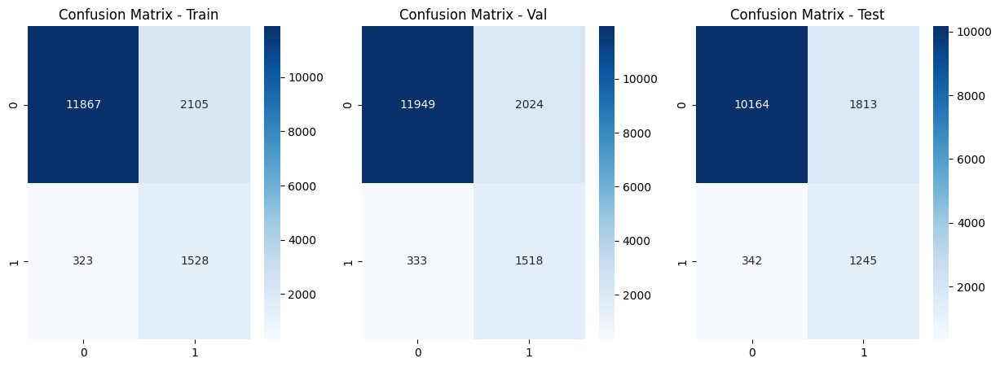

Train Size: 0.8
training set accuracy (n=25317): 0.848
val set accuracy (n=6330): 0.849
test set accuracy(n=13564): 0.841
              precision    recall  f1-score   support

           0       0.97      0.85      0.91     22355
           1       0.42      0.83      0.56      2962

    accuracy                           0.85     25317
   macro avg       0.70      0.84      0.73     25317
weighted avg       0.91      0.85      0.87     25317

              precision    recall  f1-score   support

           0       0.97      0.85      0.91      5590
           1       0.42      0.81      0.56       740

    accuracy                           0.85      6330
   macro avg       0.70      0.83      0.73      6330
weighted avg       0.91      0.85      0.87      6330

              precision    recall  f1-score   support

           0       0.97      0.85      0.90     11977
           1       0.41      0.79      0.54      1587

    accuracy                           0.84     13564
   mac

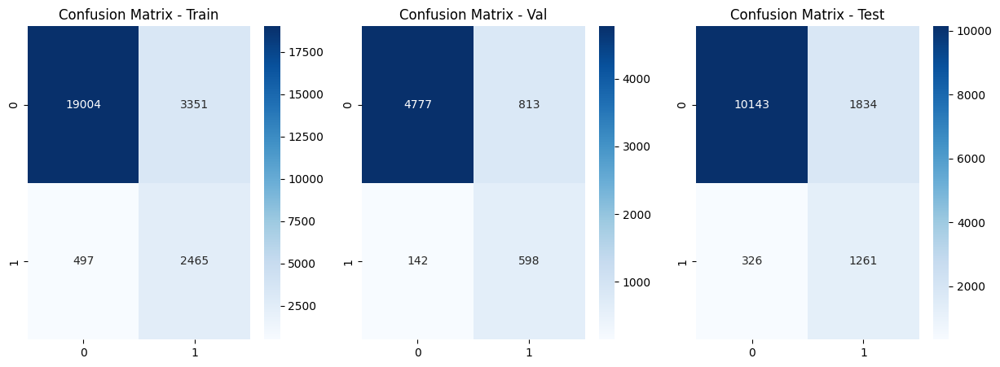

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,LogisticRegression,0.2,0.870569,0.868425,0.865657
0,LogisticRegression,0.5,0.849909,0.843919,0.840173
0,LogisticRegression,0.8,0.847395,0.852422,0.840882


In [111]:
train_sets = [0.2,0.5,0.8]
log_results_bank = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]
    best_model= Pipeline(
        steps=[
            ("classifier", LogisticRegression(
                class_weight="balanced",
                max_iter=10000,
                **{key.split("__")[1]: value for key, value in b[['classifier__C', 'classifier__penalty', 'classifier__solver']].items()}
            ))
        ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_bank)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_bank_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_bank_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_bank_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_bank_test, y_bank_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_bank_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['LogisticRegression'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_bank = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    log_results_bank= pd.concat([log_results_bank, result], axis=0)

log_results_bank

### Best Model + Train size

In [112]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.1


In [113]:
# Eyeballing
best_ratio = best_ratio

In [114]:
best_pipe= Pipeline(
        steps=[
            ("classifier", LogisticRegression(
                class_weight="balanced",
                max_iter=10000,
                **{key.split("__")[1]: value for key, value in best.iloc[best_ratio][['classifier__C', 'classifier__penalty', 'classifier__solver']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_bank)

best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"LogisticClassification_bank.joblib")
X_train.shape,X_val.shape

((3164, 51), (28483, 51))

In [115]:
best_model = joblib.load(f"LogisticClassification_bank.joblib")

In [116]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_bank_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_bank_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_bank_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=3164): 0.117
val set accuracy (n=28483): 0.117
test set accuracy(n=13564): 0.117


Best model train_size: 0.1
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      2794
           1       0.12      1.00      0.21       370

    accuracy                           0.12      3164
   macro avg       0.06      0.50      0.10      3164
weighted avg       0.01      0.12      0.02      3164

              precision    recall  f1-score   support

           0       0.00      0.00      0.00     25151
           1       0.12      1.00      0.21      3332

    accuracy                           0.12     28483
   macro avg       0.06      0.50      0.10     28483
weighted avg       0.01      0.12      0.02     28483

              precision    recall  f1-score   support

           0       0.00      0.00      0.00     11977
           1       0.12      1.00      0.21      1587

    accuracy                           0.12     13564
   macro avg       0.06      0.50      0.10     13564
weighted avg       0.01      0.12      0.02    

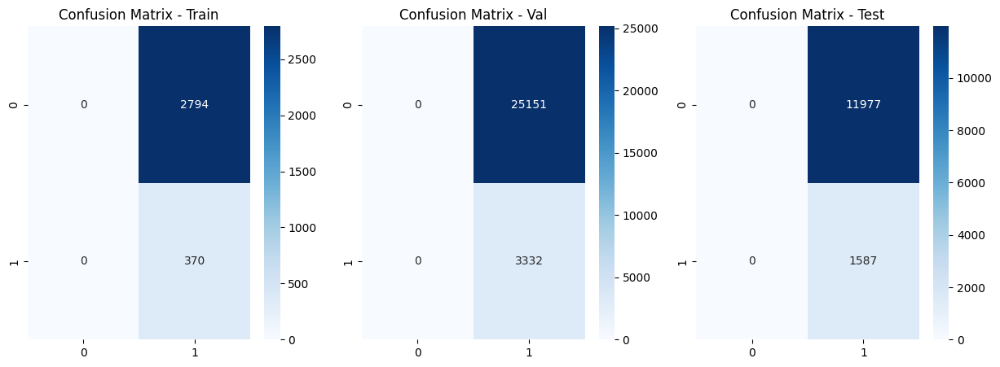

In [117]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_bank_test, y_bank_test)

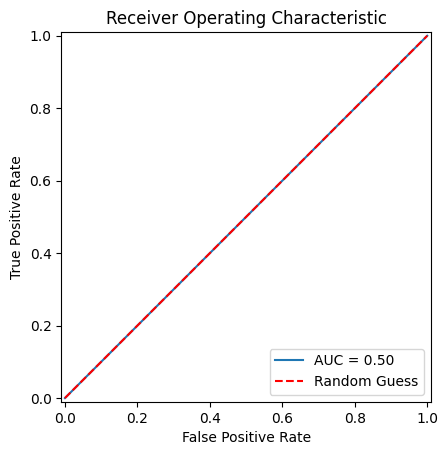

In [118]:
plot_roc_curve(y_bank_test, yhat_test)

# Decision Tree

## Iris

In [119]:
pipe = Pipeline(
    steps=[("classifier", DecisionTreeClassifier(class_weight = 'balanced'))]
)
search_space = {'classifier__max_depth': np.arange(5,15),
               'classifier__min_samples_split': np.arange(3,8),
               'classifier__criterion': ['gini','entropy']}
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [120]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [121]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_size[j], shuffle=True, stratify=y_iris)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_iris_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_iris_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__criterion','classifier__max_depth','classifier__min_samples_split'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)

results = pd.concat(results, ignore_index=True)

results

# result

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,entropy,5,3,0.972222,1.000000,0.906401,0.918519
1,0.1,entropy,5,4,1.000000,1.000000,0.906401,0.918519
2,0.1,entropy,5,5,0.925926,1.000000,0.906401,0.918519
3,0.1,entropy,5,6,0.935185,1.000000,0.906401,0.918519
4,0.1,entropy,5,7,0.879630,1.000000,0.906401,0.918519
...,...,...,...,...,...,...,...,...
895,0.9,gini,14,3,0.918996,0.985958,0.853535,0.932099
896,0.9,gini,14,4,0.918996,0.985958,0.853535,0.932099
897,0.9,gini,14,5,0.929988,0.985958,0.853535,0.932099
898,0.9,gini,14,6,0.929988,0.985958,0.853535,0.932099


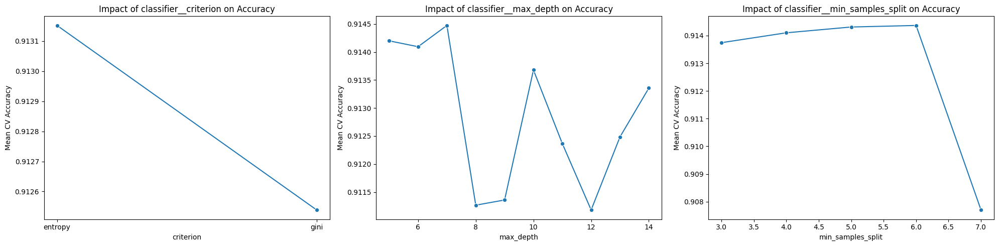

In [122]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

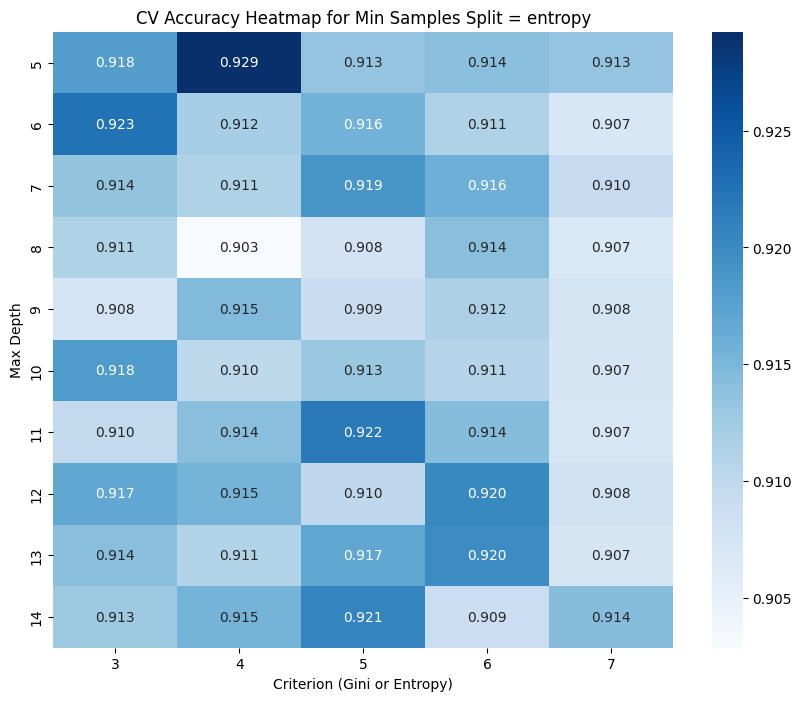

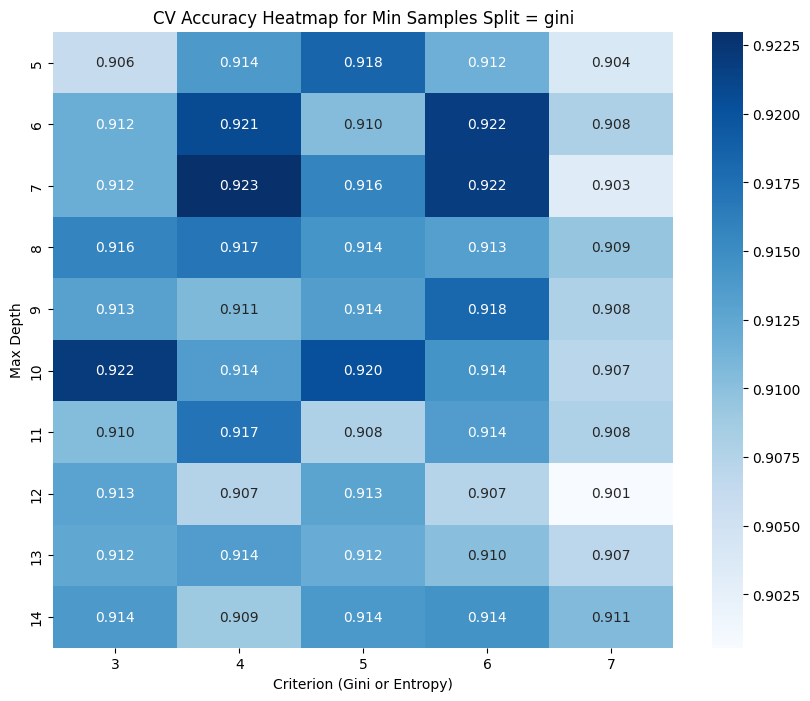

In [123]:
unique_splits = results['classifier__criterion'].unique()
for min_split in sorted(unique_splits):
    heatmap_data = results[results['classifier__criterion'] == min_split].pivot_table(
        values='CV_Acc',
        index='classifier__max_depth',
        columns='classifier__min_samples_split'
    )

    plt.figure(figsize=(10, 8))
    sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
    plt.title(f'CV Accuracy Heatmap for Min Samples Split = {min_split}')
    plt.xlabel('Criterion (Gini or Entropy)')
    plt.ylabel('Max Depth')
    plt.show()


### Learning Curve

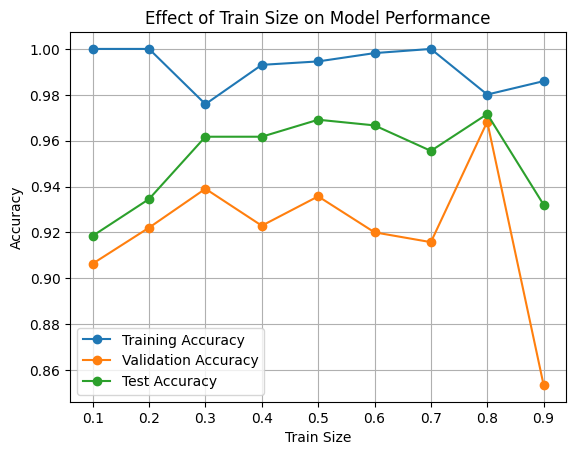

In [124]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [125]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,entropy,5,4,1.000000,1.000000,0.906401,0.918519
1,0.2,entropy,5,4,0.917989,1.000000,0.922087,0.934568
2,0.3,entropy,5,4,0.911111,0.975926,0.939043,0.961728
3,0.4,entropy,5,3,0.950549,0.993056,0.922939,0.961728
4,0.5,entropy,5,3,0.915033,0.994553,0.935730,0.969136
5,0.6,entropy,5,4,0.939947,0.998179,0.920054,0.966667
6,0.7,entropy,8,3,0.901369,1.000000,0.915771,0.955556
7,0.8,entropy,6,5,0.934156,0.980110,0.968254,0.971605
8,0.9,gini,5,5,0.929988,0.985958,0.853535,0.932099


### Train Size = 0.2,0.5,0.8

In [126]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,entropy,5,4,0.917989,1.000000,0.922087,0.934568
1,0.5,entropy,5,3,0.915033,0.994553,0.935730,0.969136
2,0.8,entropy,6,5,0.934156,0.980110,0.968254,0.971605


Train Size: 0.2
training set accuracy (n=20): 1.000
val set accuracy (n=82): 0.768
test set accuracy(n=45): 0.844
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        13
           1       1.00      1.00      1.00         7

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20

              precision    recall  f1-score   support

           0       0.76      0.95      0.85        55
           1       0.79      0.41      0.54        27

    accuracy                           0.77        82
   macro avg       0.78      0.68      0.69        82
weighted avg       0.77      0.77      0.74        82

              precision    recall  f1-score   support

           0       0.81      1.00      0.90        30
           1       1.00      0.53      0.70        15

    accuracy                           0.84        45
   macro avg  

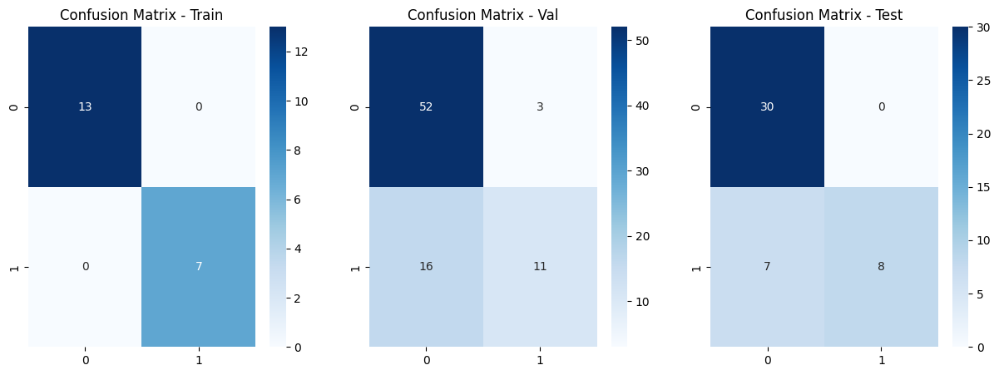

Train Size: 0.5
training set accuracy (n=51): 1.000
val set accuracy (n=51): 0.980
test set accuracy(n=45): 0.978
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00        17

    accuracy                           1.00        51
   macro avg       1.00      1.00      1.00        51
weighted avg       1.00      1.00      1.00        51

              precision    recall  f1-score   support

           0       1.00      0.97      0.99        34
           1       0.94      1.00      0.97        17

    accuracy                           0.98        51
   macro avg       0.97      0.99      0.98        51
weighted avg       0.98      0.98      0.98        51

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        30
           1       1.00      0.93      0.97        15

    accuracy                           0.98        45
   macro avg  

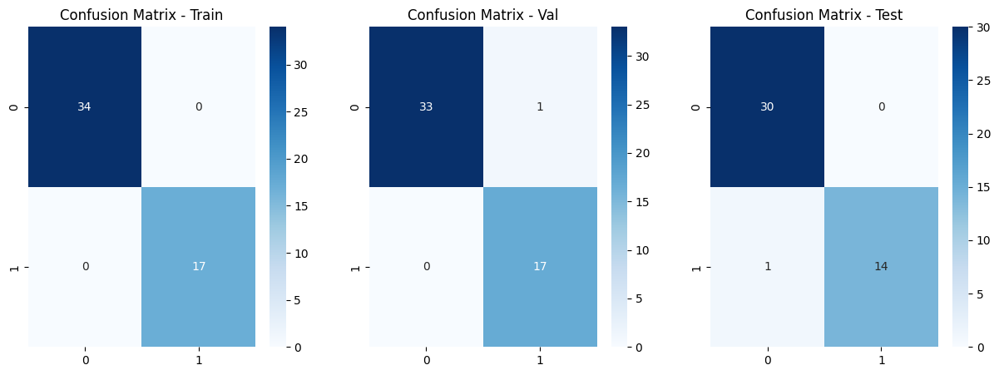

Train Size: 0.8
training set accuracy (n=81): 0.988
val set accuracy (n=21): 0.905
test set accuracy(n=45): 0.911
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        54
           1       1.00      0.96      0.98        27

    accuracy                           0.99        81
   macro avg       0.99      0.98      0.99        81
weighted avg       0.99      0.99      0.99        81

              precision    recall  f1-score   support

           0       0.88      1.00      0.93        14
           1       1.00      0.71      0.83         7

    accuracy                           0.90        21
   macro avg       0.94      0.86      0.88        21
weighted avg       0.92      0.90      0.90        21

              precision    recall  f1-score   support

           0       0.91      0.97      0.94        30
           1       0.92      0.80      0.86        15

    accuracy                           0.91        45
   macro avg  

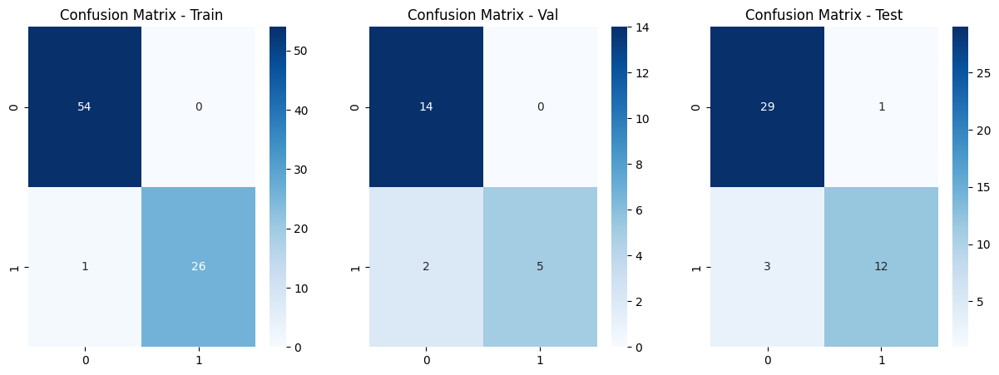

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,DecisionTree,0.2,1.000000,0.922087,0.934568
0,DecisionTree,0.5,0.994553,0.935730,0.969136
0,DecisionTree,0.8,0.980110,0.968254,0.971605


In [127]:
train_sets = [0.2,0.5,0.8]
dt_results_iris = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]
    best_model= Pipeline(
        steps=[
            ("classifier", DecisionTreeClassifier(
                class_weight="balanced",
                **{key.split("__")[1]: value for key, value in b[['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_iris)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_iris_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_iris_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_iris_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_iris_test, y_iris_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_iris_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['DecisionTree'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_iris = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    dt_results_iris= pd.concat([dt_results_iris, result], axis=0)

dt_results_iris

### Best Model + Train size

In [128]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.8


In [129]:
# Eyeballing
best_ratio = best_ratio

In [130]:
best_pipe= Pipeline(
        steps=[
            ("classifier", DecisionTreeClassifier(
                class_weight="balanced",
                **{key.split("__")[1]: value for key, value in best.iloc[best_ratio][['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_iris)
best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"DecisionTree_iris.joblib")
X_train.shape,X_val.shape

((81, 4), (21, 4))

In [131]:
best_model = joblib.load(f"DecisionTree_iris.joblib")

In [132]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_iris_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_iris_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_iris_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=81): 0.988
val set accuracy (n=21): 0.905
test set accuracy(n=45): 0.911


Best model train_size: 0.8
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        54
           1       1.00      0.96      0.98        27

    accuracy                           0.99        81
   macro avg       0.99      0.98      0.99        81
weighted avg       0.99      0.99      0.99        81

              precision    recall  f1-score   support

           0       0.88      1.00      0.93        14
           1       1.00      0.71      0.83         7

    accuracy                           0.90        21
   macro avg       0.94      0.86      0.88        21
weighted avg       0.92      0.90      0.90        21

              precision    recall  f1-score   support

           0       0.91      0.97      0.94        30
           1       0.92      0.80      0.86        15

    accuracy                           0.91        45
   macro avg       0.91      0.88      0.90        45
weighted avg       0.91      0.91      0.91    

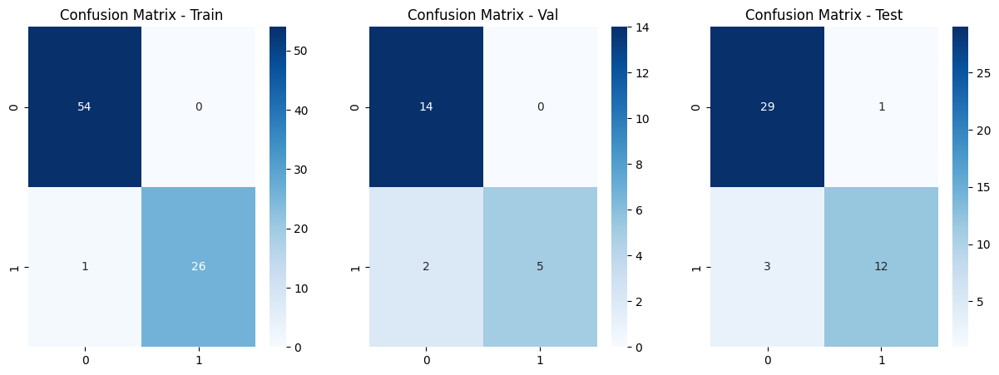

In [133]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_iris_test, y_iris_test)

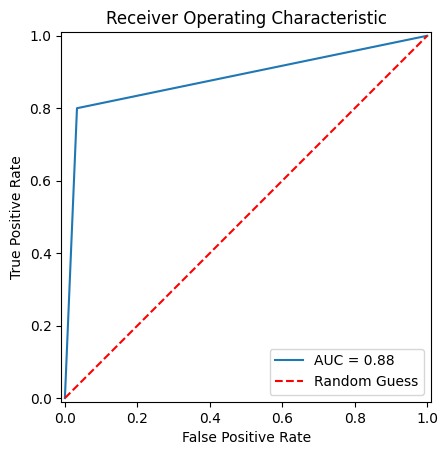

In [134]:
plot_roc_curve(y_iris_test, yhat_test)

## Wine

In [135]:
pipe = Pipeline(
    steps=[("classifier", DecisionTreeClassifier(class_weight = 'balanced'))]
)
search_space = {'classifier__max_depth': np.arange(5,15),
               'classifier__min_samples_split': np.arange(3,8),
               'classifier__criterion': ['gini','entropy']}
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [136]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [137]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_size[j], shuffle=True, stratify=y_wine)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_wine_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_wine_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__criterion','classifier__max_depth','classifier__min_samples_split'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)

results = pd.concat(results, ignore_index=True)

results

# result

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,entropy,5,3,0.718974,0.90000,0.665304,0.652233
1,0.1,entropy,5,4,0.722446,0.90000,0.665304,0.652233
2,0.1,entropy,5,5,0.708109,0.90000,0.665304,0.652233
3,0.1,entropy,5,6,0.718638,0.90000,0.665304,0.652233
4,0.1,entropy,5,7,0.697805,0.90000,0.665304,0.652233
...,...,...,...,...,...,...,...,...
895,0.9,gini,14,3,0.681092,0.80091,0.671296,0.688998
896,0.9,gini,14,4,0.674074,0.80091,0.671296,0.688998
897,0.9,gini,14,5,0.676023,0.80091,0.671296,0.688998
898,0.9,gini,14,6,0.676413,0.80091,0.671296,0.688998


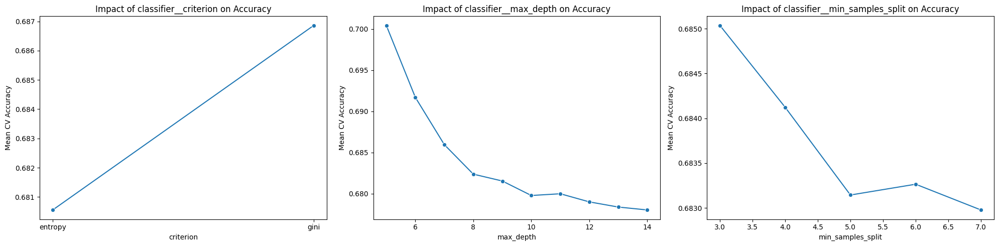

In [138]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

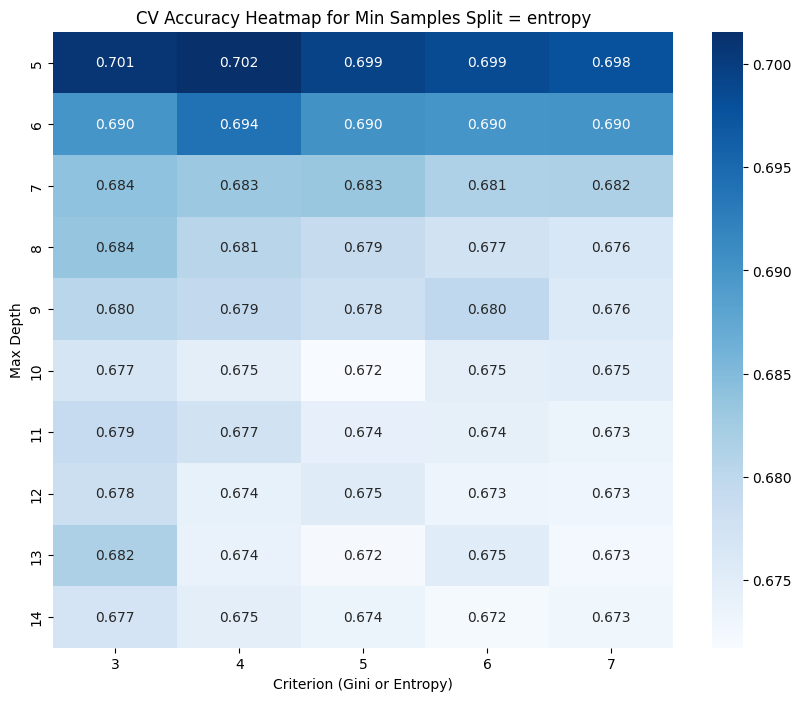

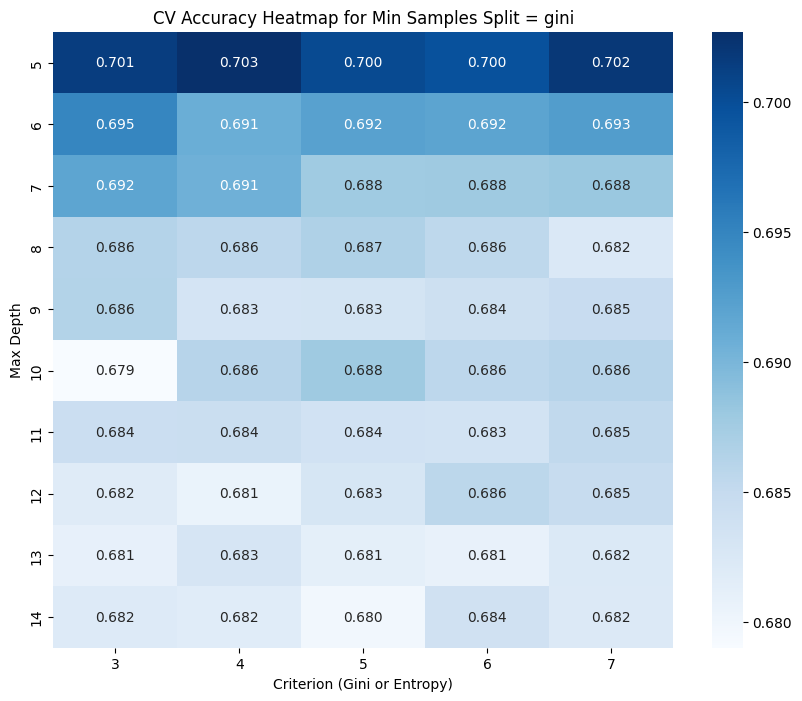

In [139]:
unique_splits = results['classifier__criterion'].unique()
for min_split in sorted(unique_splits):
    heatmap_data = results[results['classifier__criterion'] == min_split].pivot_table(
        values='CV_Acc',
        index='classifier__max_depth',
        columns='classifier__min_samples_split'
    )

    plt.figure(figsize=(10, 8))
    sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
    plt.title(f'CV Accuracy Heatmap for Min Samples Split = {min_split}')
    plt.xlabel('Criterion (Gini or Entropy)')
    plt.ylabel('Max Depth')
    plt.show()


### Learning Curve

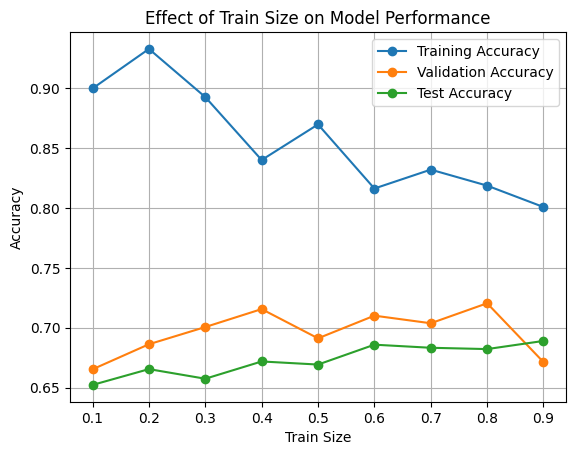

In [140]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [141]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,gini,10,7,0.747648,0.900000,0.665304,0.652233
1,0.2,gini,12,7,0.687610,0.933041,0.686232,0.665441
2,0.3,gini,6,3,0.677193,0.892788,0.700617,0.657407
3,0.4,entropy,5,3,0.709592,0.840205,0.715606,0.671841
4,0.5,gini,5,5,0.687711,0.869942,0.691176,0.669254
5,0.6,entropy,5,6,0.718129,0.816374,0.710120,0.685866
6,0.7,gini,6,5,0.710283,0.832164,0.703768,0.683279
7,0.8,entropy,5,5,0.721946,0.818787,0.720477,0.682190
8,0.9,entropy,5,3,0.729045,0.800910,0.671296,0.688998


### Train Size = 0.2,0.5,0.8

In [142]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,gini,12,7,0.687610,0.933041,0.686232,0.665441
1,0.5,gini,5,5,0.687711,0.869942,0.691176,0.669254
2,0.8,entropy,5,5,0.721946,0.818787,0.720477,0.682190


Train Size: 0.2
training set accuracy (n=190): 0.937
val set accuracy (n=761): 0.656
test set accuracy(n=408): 0.664
              precision    recall  f1-score   support

           0       0.92      0.94      0.93        90
           1       0.95      0.93      0.94       100

    accuracy                           0.94       190
   macro avg       0.94      0.94      0.94       190
weighted avg       0.94      0.94      0.94       190

              precision    recall  f1-score   support

           0       0.65      0.59      0.62       358
           1       0.66      0.72      0.69       403

    accuracy                           0.66       761
   macro avg       0.65      0.65      0.65       761
weighted avg       0.66      0.66      0.65       761

              precision    recall  f1-score   support

           0       0.66      0.59      0.62       192
           1       0.67      0.73      0.70       216

    accuracy                           0.66       408
   macro av

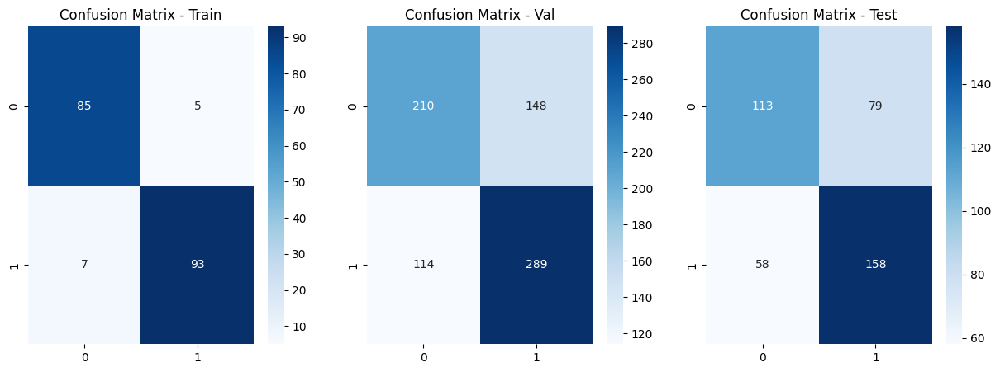

Train Size: 0.5
training set accuracy (n=475): 0.848
val set accuracy (n=476): 0.681
test set accuracy(n=408): 0.696
              precision    recall  f1-score   support

           0       0.89      0.78      0.83       224
           1       0.82      0.91      0.86       251

    accuracy                           0.85       475
   macro avg       0.85      0.84      0.85       475
weighted avg       0.85      0.85      0.85       475

              precision    recall  f1-score   support

           0       0.68      0.60      0.64       224
           1       0.68      0.75      0.71       252

    accuracy                           0.68       476
   macro avg       0.68      0.68      0.68       476
weighted avg       0.68      0.68      0.68       476

              precision    recall  f1-score   support

           0       0.71      0.60      0.65       192
           1       0.69      0.78      0.73       216

    accuracy                           0.70       408
   macro av

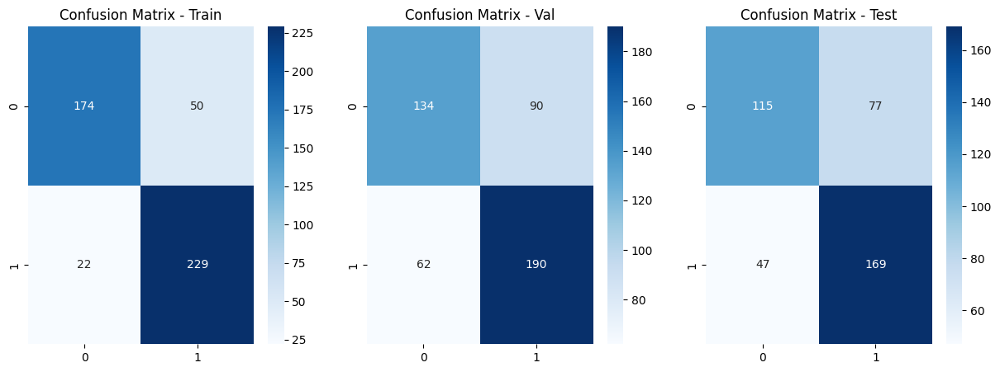

Train Size: 0.8
training set accuracy (n=760): 0.797
val set accuracy (n=191): 0.712
test set accuracy(n=408): 0.703
              precision    recall  f1-score   support

           0       0.79      0.77      0.78       358
           1       0.80      0.82      0.81       402

    accuracy                           0.80       760
   macro avg       0.80      0.80      0.80       760
weighted avg       0.80      0.80      0.80       760

              precision    recall  f1-score   support

           0       0.70      0.68      0.69        90
           1       0.72      0.74      0.73       101

    accuracy                           0.71       191
   macro avg       0.71      0.71      0.71       191
weighted avg       0.71      0.71      0.71       191

              precision    recall  f1-score   support

           0       0.69      0.68      0.68       192
           1       0.72      0.72      0.72       216

    accuracy                           0.70       408
   macro av

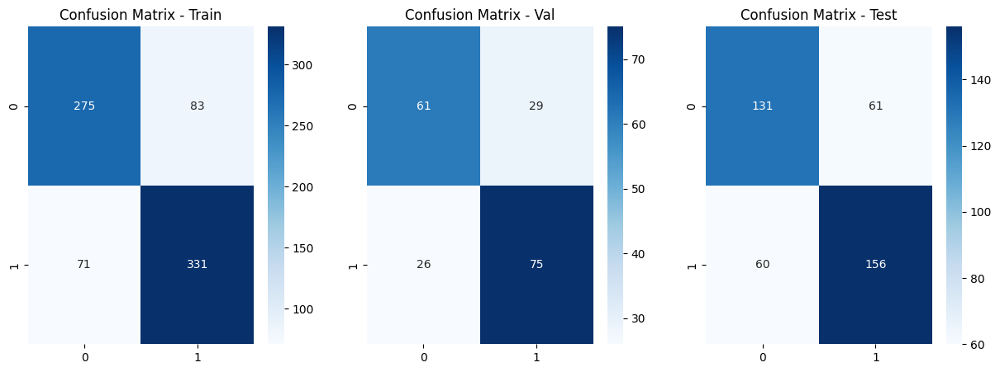

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,DecisionTree,0.2,0.933041,0.686232,0.665441
0,DecisionTree,0.5,0.869942,0.691176,0.669254
0,DecisionTree,0.8,0.818787,0.720477,0.682190


In [143]:
train_sets = [0.2,0.5,0.8]
dt_results_wine = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]
    best_model= Pipeline(
        steps=[
            ("classifier", DecisionTreeClassifier(
                class_weight="balanced",
                **{key.split("__")[1]: value for key, value in b[['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_wine)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_wine_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_wine_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_wine_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_wine_test, y_wine_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_wine_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['DecisionTree'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_wine = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    dt_results_wine= pd.concat([dt_results_wine, result], axis=0)

dt_results_wine

### Best Model + Train size

In [144]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.8


In [145]:
# Eyeballing
best_ratio = best_ratio

In [146]:
best_pipe= Pipeline(
        steps=[
            ("classifier", DecisionTreeClassifier(
                class_weight="balanced",
                **{key.split("__")[1]: value for key, value in best.iloc[best_ratio][['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_wine)
best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"DecisionTree_wine.joblib")
X_train.shape,X_val.shape

((760, 11), (191, 11))

In [147]:
best_model = joblib.load(f"DecisionTree_wine.joblib")

In [148]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_wine_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_wine_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_wine_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=760): 0.797
val set accuracy (n=191): 0.712
test set accuracy(n=408): 0.703


Best model train_size: 0.8
              precision    recall  f1-score   support

           0       0.79      0.77      0.78       358
           1       0.80      0.82      0.81       402

    accuracy                           0.80       760
   macro avg       0.80      0.80      0.80       760
weighted avg       0.80      0.80      0.80       760

              precision    recall  f1-score   support

           0       0.70      0.68      0.69        90
           1       0.72      0.74      0.73       101

    accuracy                           0.71       191
   macro avg       0.71      0.71      0.71       191
weighted avg       0.71      0.71      0.71       191

              precision    recall  f1-score   support

           0       0.69      0.68      0.68       192
           1       0.72      0.72      0.72       216

    accuracy                           0.70       408
   macro avg       0.70      0.70      0.70       408
weighted avg       0.70      0.70      0.70    

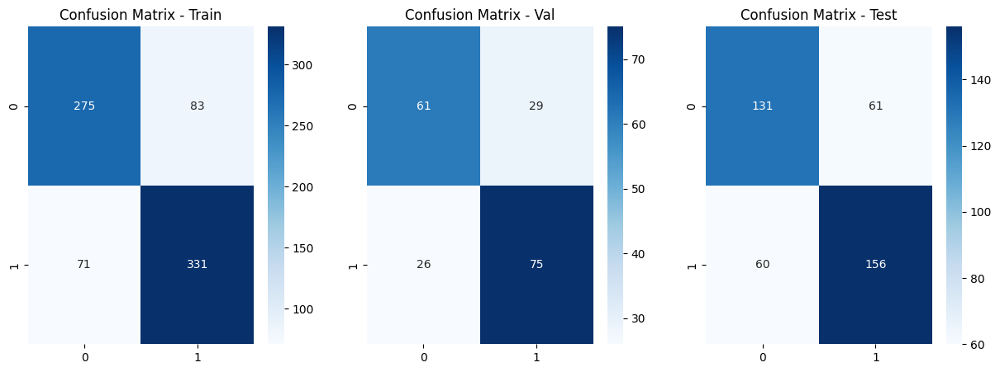

In [149]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_wine_test, y_wine_test)

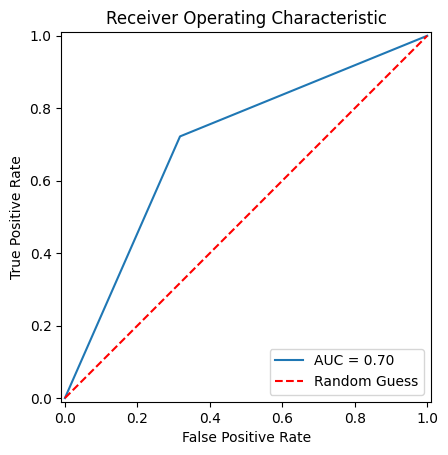

In [150]:
plot_roc_curve(y_wine_test, yhat_test)

## Cancer

In [151]:
pipe = Pipeline(
    steps=[("classifier", DecisionTreeClassifier(class_weight = 'balanced'))]
)
search_space = {'classifier__max_depth': np.arange(5,15),
               'classifier__min_samples_split': np.arange(3,8),
               'classifier__criterion': ['gini','entropy']}
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [152]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [153]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_size[j], shuffle=True, stratify=y_cancer)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_cancer_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_cancer_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__criterion','classifier__max_depth','classifier__min_samples_split'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)

results = pd.concat(results, ignore_index=True)

results

# result

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,entropy,5,3,0.837607,1.000000,0.843702,0.837557
1,0.1,entropy,5,4,0.888889,1.000000,0.843702,0.837557
2,0.1,entropy,5,5,0.794872,1.000000,0.843702,0.837557
3,0.1,entropy,5,6,0.811966,1.000000,0.843702,0.837557
4,0.1,entropy,5,7,0.854701,1.000000,0.843702,0.837557
...,...,...,...,...,...,...,...,...
895,0.9,gini,14,3,0.910629,0.998138,0.937500,0.936647
896,0.9,gini,14,4,0.912488,0.998138,0.937500,0.936647
897,0.9,gini,14,5,0.907820,0.998138,0.937500,0.936647
898,0.9,gini,14,6,0.912457,0.998138,0.937500,0.936647


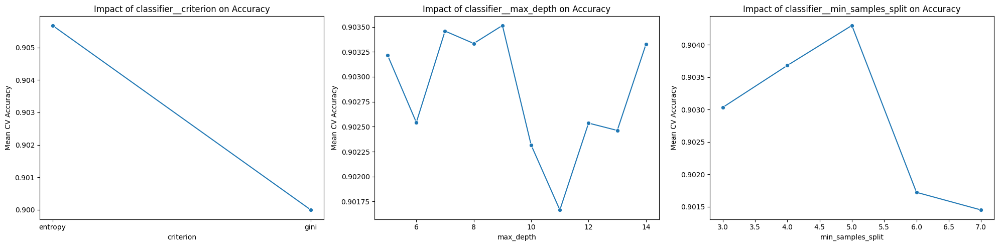

In [154]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

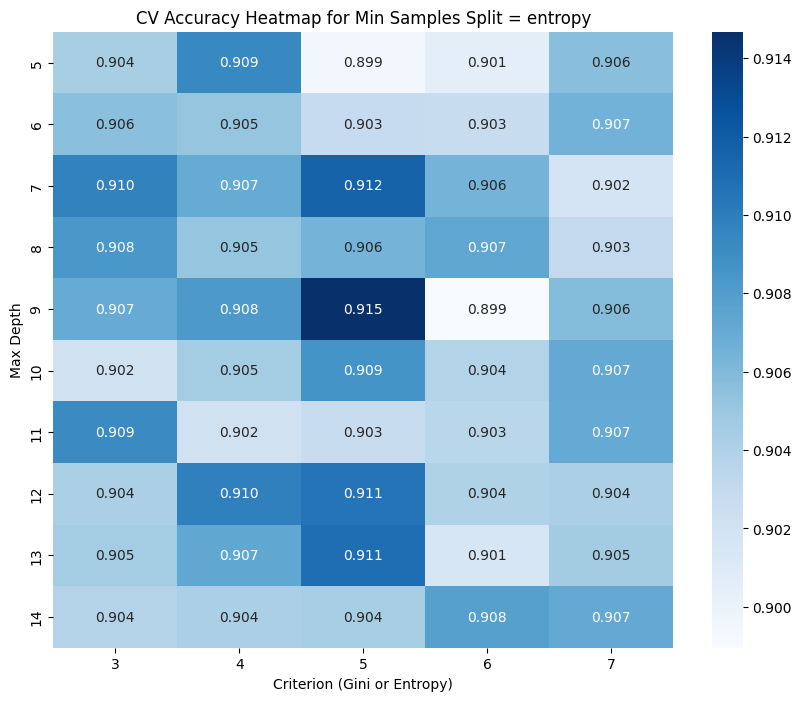

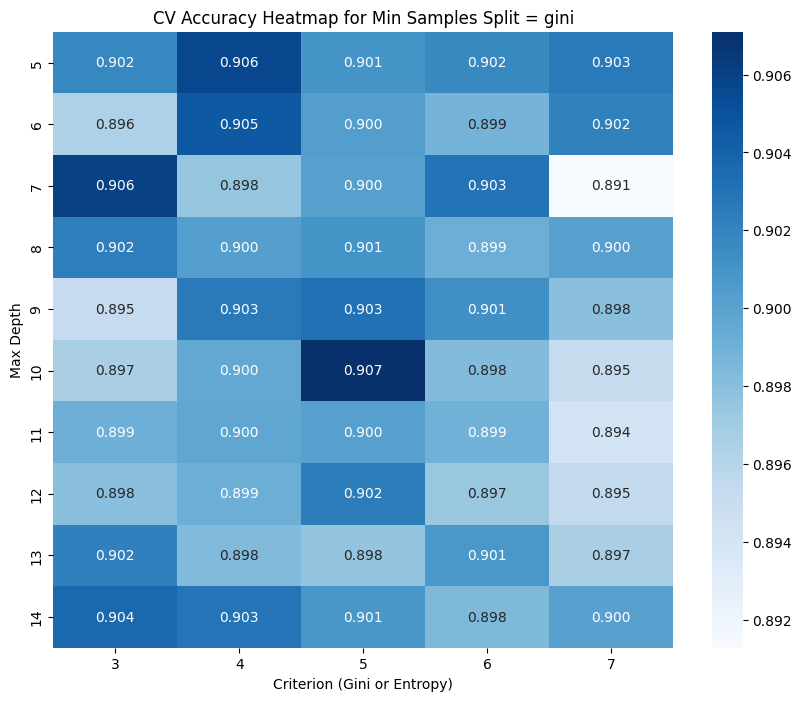

In [155]:
unique_splits = results['classifier__criterion'].unique()
for min_split in sorted(unique_splits):
    heatmap_data = results[results['classifier__criterion'] == min_split].pivot_table(
        values='CV_Acc',
        index='classifier__max_depth',
        columns='classifier__min_samples_split'
    )

    plt.figure(figsize=(10, 8))
    sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
    plt.title(f'CV Accuracy Heatmap for Min Samples Split = {min_split}')
    plt.xlabel('Criterion (Gini or Entropy)')
    plt.ylabel('Max Depth')
    plt.show()


### Learning Curve

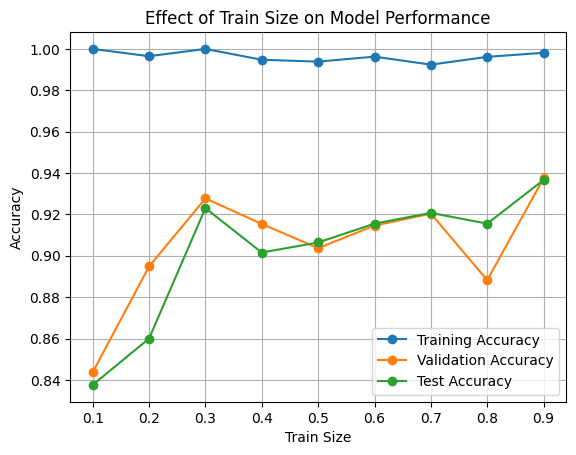

In [156]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [157]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,entropy,9,5,0.914530,1.000000,0.843702,0.837557
1,0.2,entropy,14,5,0.919911,0.996484,0.894810,0.859974
2,0.3,entropy,14,4,0.893732,1.000000,0.927718,0.923002
3,0.4,gini,5,4,0.918239,0.994759,0.915388,0.901559
4,0.5,entropy,11,3,0.929569,0.993858,0.903685,0.906433
5,0.6,gini,14,4,0.936955,0.996265,0.914583,0.915530
6,0.7,entropy,12,7,0.924432,0.992406,0.920370,0.920728
7,0.8,entropy,13,3,0.922432,0.996157,0.888194,0.915530
8,0.9,entropy,13,5,0.930159,0.998138,0.937500,0.936647


### Train Size = 0.2,0.5,0.8

In [158]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,entropy,14,5,0.919911,0.996484,0.894810,0.859974
1,0.5,entropy,11,3,0.929569,0.993858,0.903685,0.906433
2,0.8,entropy,13,3,0.922432,0.996157,0.888194,0.915530


Train Size: 0.2
training set accuracy (n=79): 1.000
val set accuracy (n=319): 0.915
test set accuracy(n=171): 0.912
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        50
           1       1.00      1.00      1.00        29

    accuracy                           1.00        79
   macro avg       1.00      1.00      1.00        79
weighted avg       1.00      1.00      1.00        79

              precision    recall  f1-score   support

           0       0.94      0.93      0.93       200
           1       0.88      0.90      0.89       119

    accuracy                           0.92       319
   macro avg       0.91      0.91      0.91       319
weighted avg       0.92      0.92      0.92       319

              precision    recall  f1-score   support

           0       0.96      0.90      0.93       107
           1       0.85      0.94      0.89        64

    accuracy                           0.91       171
   macro avg

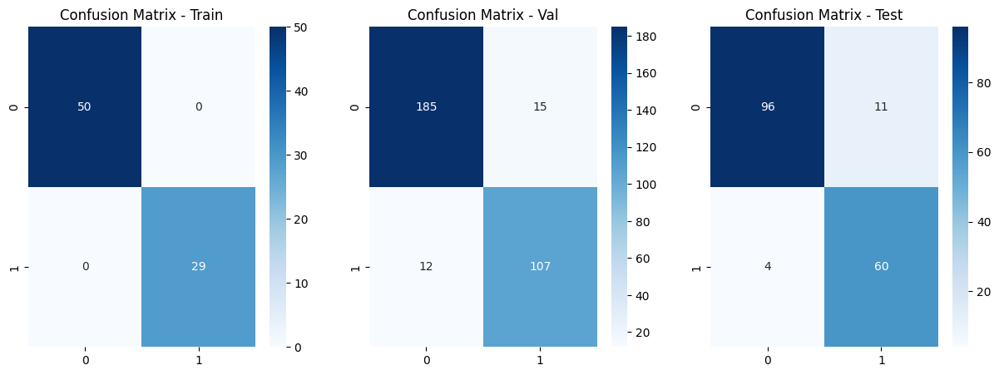

Train Size: 0.5
training set accuracy (n=199): 1.000
val set accuracy (n=199): 0.920
test set accuracy(n=171): 0.924
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       125
           1       1.00      1.00      1.00        74

    accuracy                           1.00       199
   macro avg       1.00      1.00      1.00       199
weighted avg       1.00      1.00      1.00       199

              precision    recall  f1-score   support

           0       0.92      0.95      0.94       125
           1       0.91      0.86      0.89        74

    accuracy                           0.92       199
   macro avg       0.92      0.91      0.91       199
weighted avg       0.92      0.92      0.92       199

              precision    recall  f1-score   support

           0       0.94      0.93      0.94       107
           1       0.89      0.91      0.90        64

    accuracy                           0.92       171
   macro av

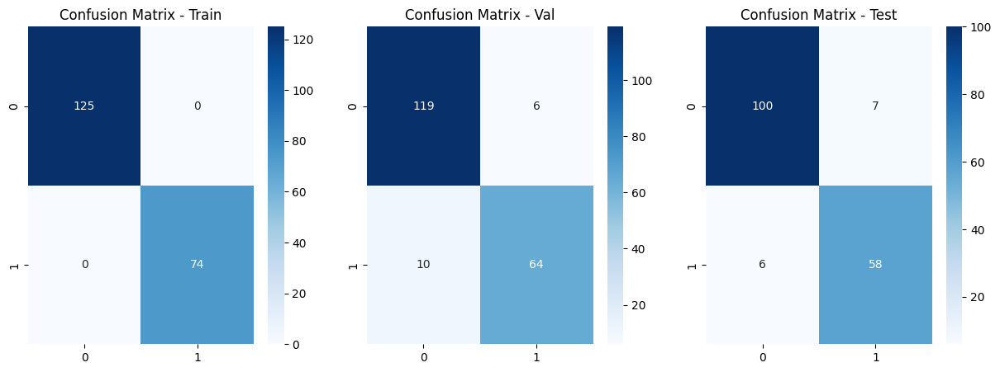

Train Size: 0.8
training set accuracy (n=318): 1.000
val set accuracy (n=80): 0.938
test set accuracy(n=171): 0.918
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       200
           1       1.00      1.00      1.00       118

    accuracy                           1.00       318
   macro avg       1.00      1.00      1.00       318
weighted avg       1.00      1.00      1.00       318

              precision    recall  f1-score   support

           0       0.96      0.94      0.95        50
           1       0.90      0.93      0.92        30

    accuracy                           0.94        80
   macro avg       0.93      0.94      0.93        80
weighted avg       0.94      0.94      0.94        80

              precision    recall  f1-score   support

           0       0.95      0.92      0.93       107
           1       0.87      0.92      0.89        64

    accuracy                           0.92       171
   macro avg

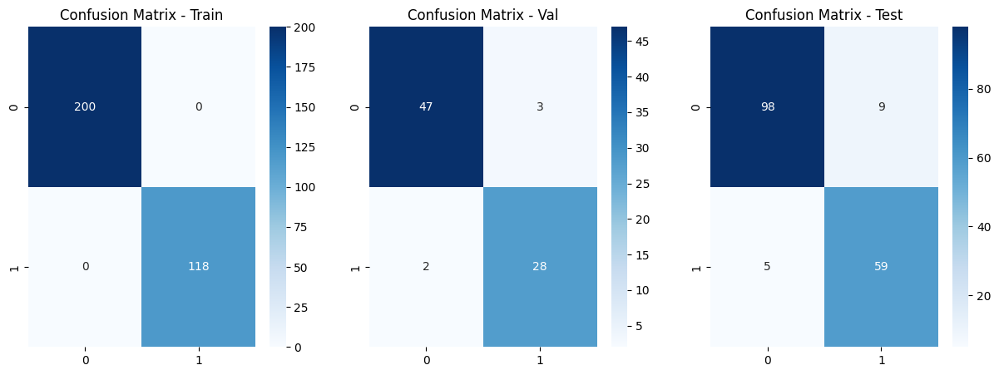

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,DecisionTree,0.2,0.996484,0.894810,0.859974
0,DecisionTree,0.5,0.993858,0.903685,0.906433
0,DecisionTree,0.8,0.996157,0.888194,0.915530


In [159]:
train_sets = [0.2,0.5,0.8]
dt_results_cancer = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]
    best_model= Pipeline(
        steps=[
            ("classifier", DecisionTreeClassifier(
                class_weight="balanced",
                **{key.split("__")[1]: value for key, value in b[['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_cancer)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_cancer_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_cancer_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_cancer_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_cancer_test, y_cancer_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_cancer_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['DecisionTree'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_cancer = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    dt_results_cancer= pd.concat([dt_results_cancer, result], axis=0)

dt_results_cancer

### Best Model + Train size

In [160]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.9


In [161]:
# Eyeballing
best_ratio = best_ratio

In [162]:
best_pipe= Pipeline(
        steps=[
            ("classifier", DecisionTreeClassifier(
                class_weight="balanced",
                **{key.split("__")[1]: value for key, value in best.iloc[best_ratio][['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_cancer)
best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"DecisionTree_cancer.joblib")
X_train.shape,X_val.shape

((358, 30), (40, 30))

In [163]:
best_model = joblib.load(f"DecisionTree_cancer.joblib")

In [164]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_cancer_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_cancer_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_cancer_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=358): 0.997
val set accuracy (n=40): 0.975
test set accuracy(n=171): 0.889


Best model train_size: 0.9
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       225
           1       0.99      1.00      1.00       133

    accuracy                           1.00       358
   macro avg       1.00      1.00      1.00       358
weighted avg       1.00      1.00      1.00       358

              precision    recall  f1-score   support

           0       1.00      0.96      0.98        25
           1       0.94      1.00      0.97        15

    accuracy                           0.97        40
   macro avg       0.97      0.98      0.97        40
weighted avg       0.98      0.97      0.98        40

              precision    recall  f1-score   support

           0       0.95      0.87      0.91       107
           1       0.81      0.92      0.86        64

    accuracy                           0.89       171
   macro avg       0.88      0.90      0.88       171
weighted avg       0.90      0.89      0.89    

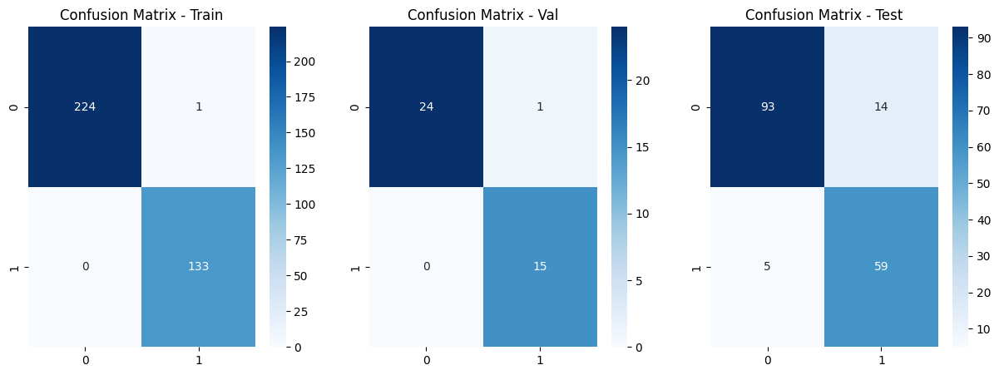

In [165]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_cancer_test, y_cancer_test)

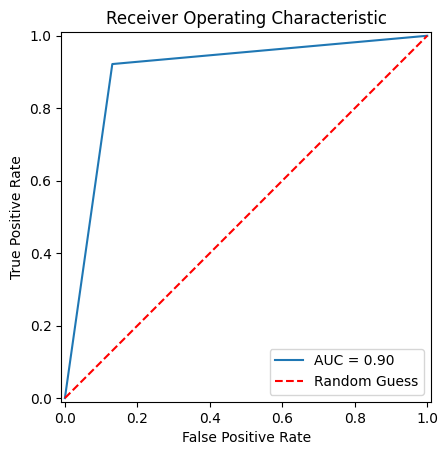

In [166]:
plot_roc_curve(y_cancer_test, yhat_test)

## Bank

In [167]:
pipe = Pipeline(
    steps=[("classifier", DecisionTreeClassifier(class_weight = 'balanced'))]
)
search_space = {'classifier__max_depth': np.arange(5,15),
               'classifier__min_samples_split': np.arange(3,8),
               'classifier__criterion': ['gini','entropy']}
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [168]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [169]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_size[j], shuffle=True, stratify=y_bank)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_bank_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_bank_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__criterion','classifier__max_depth','classifier__min_samples_split'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)

results = pd.concat(results, ignore_index=True)

results

# result

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,entropy,5,3,0.790032,0.958052,0.852766,0.850687
1,0.1,entropy,5,4,0.790348,0.958052,0.852766,0.850687
2,0.1,entropy,5,5,0.790032,0.958052,0.852766,0.850687
3,0.1,entropy,5,6,0.790348,0.958052,0.852766,0.850687
4,0.1,entropy,5,7,0.790559,0.958052,0.852766,0.850687
...,...,...,...,...,...,...,...,...
895,0.9,gini,14,3,0.851392,0.903144,0.851817,0.853837
896,0.9,gini,14,4,0.850736,0.903144,0.851817,0.853837
897,0.9,gini,14,5,0.849566,0.903144,0.851817,0.853837
898,0.9,gini,14,6,0.849554,0.903144,0.851817,0.853837


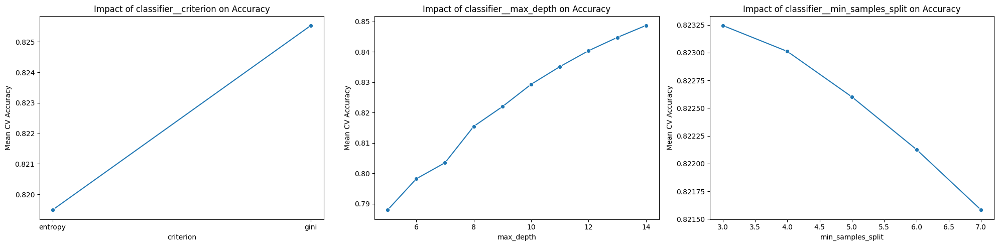

In [170]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

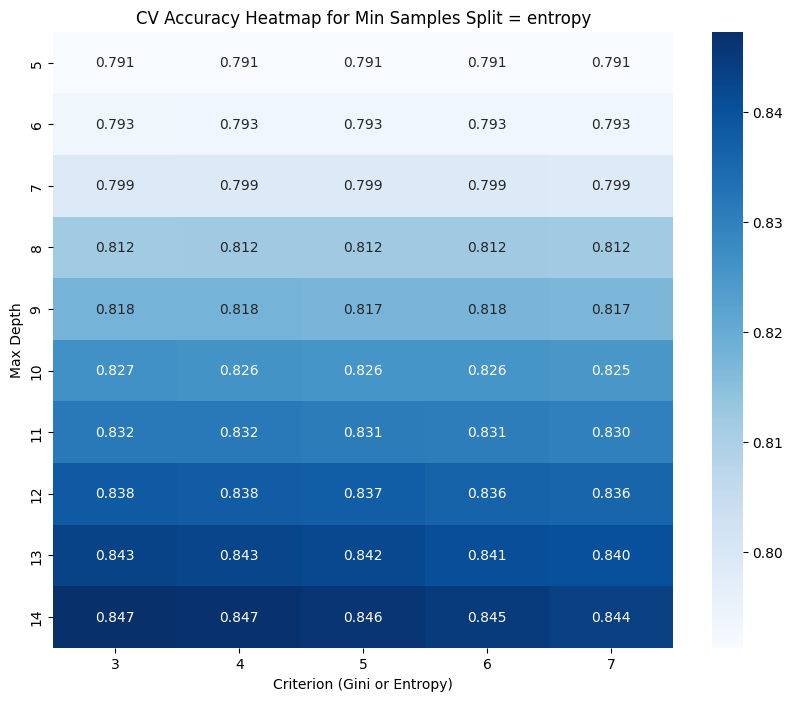

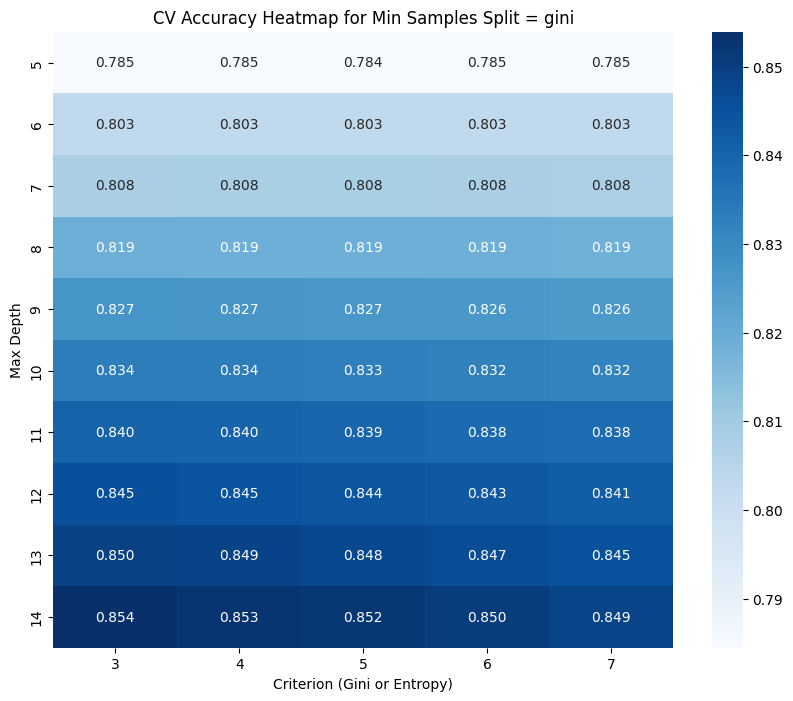

In [171]:
unique_splits = results['classifier__criterion'].unique()
for min_split in sorted(unique_splits):
    heatmap_data = results[results['classifier__criterion'] == min_split].pivot_table(
        values='CV_Acc',
        index='classifier__max_depth',
        columns='classifier__min_samples_split'
    )

    plt.figure(figsize=(10, 8))
    sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
    plt.title(f'CV Accuracy Heatmap for Min Samples Split = {min_split}')
    plt.xlabel('Criterion (Gini or Entropy)')
    plt.ylabel('Max Depth')
    plt.show()


### Learning Curve

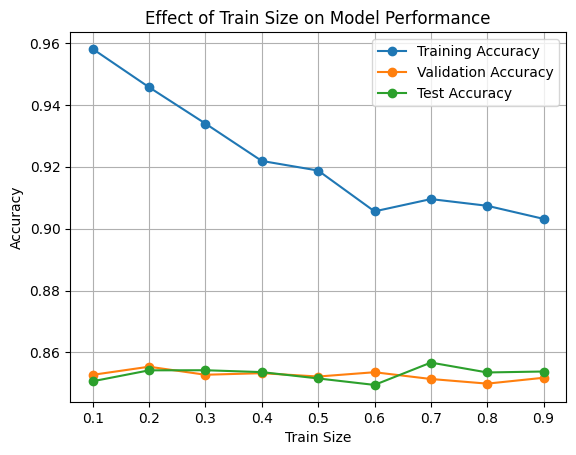

In [172]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [173]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,gini,14,3,0.857987,0.958052,0.852766,0.850687
1,0.2,gini,14,3,0.851425,0.945673,0.855384,0.854218
2,0.3,gini,14,3,0.857805,0.933929,0.852789,0.854247
3,0.4,gini,14,3,0.850898,0.921863,0.853298,0.853644
4,0.5,gini,14,3,0.855337,0.918758,0.852215,0.851597
5,0.6,gini,14,3,0.850748,0.905572,0.853604,0.849504
6,0.7,gini,14,3,0.855965,0.909539,0.851419,0.856720
7,0.8,gini,14,3,0.853774,0.907374,0.849921,0.853530
8,0.9,gini,14,3,0.851392,0.903144,0.851817,0.853837


### Train Size = 0.2,0.5,0.8

In [174]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,gini,14,3,0.851425,0.945673,0.855384,0.854218
1,0.5,gini,14,3,0.855337,0.918758,0.852215,0.851597
2,0.8,gini,14,3,0.853774,0.907374,0.849921,0.853530


Train Size: 0.2
training set accuracy (n=6329): 0.941
val set accuracy (n=25318): 0.860
test set accuracy(n=13564): 0.859
              precision    recall  f1-score   support

           0       1.00      0.94      0.97      5589
           1       0.67      0.98      0.80       740

    accuracy                           0.94      6329
   macro avg       0.83      0.96      0.88      6329
weighted avg       0.96      0.94      0.95      6329

              precision    recall  f1-score   support

           0       0.95      0.89      0.92     22356
           1       0.43      0.62      0.51      2962

    accuracy                           0.86     25318
   macro avg       0.69      0.76      0.71     25318
weighted avg       0.89      0.86      0.87     25318

              precision    recall  f1-score   support

           0       0.94      0.89      0.92     11977
           1       0.43      0.61      0.50      1587

    accuracy                           0.86     13564
   mac

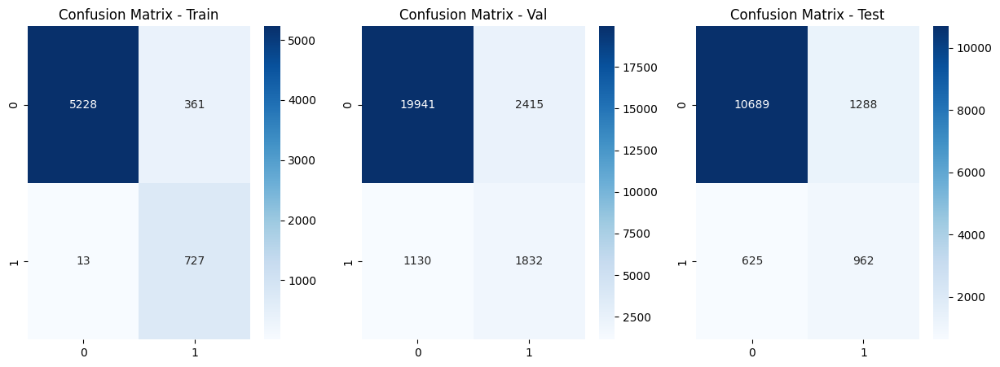

Train Size: 0.5
training set accuracy (n=15823): 0.916
val set accuracy (n=15824): 0.854
test set accuracy(n=13564): 0.848
              precision    recall  f1-score   support

           0       1.00      0.91      0.95     13972
           1       0.58      0.97      0.73      1851

    accuracy                           0.92     15823
   macro avg       0.79      0.94      0.84     15823
weighted avg       0.95      0.92      0.92     15823

              precision    recall  f1-score   support

           0       0.95      0.88      0.91     13973
           1       0.42      0.67      0.52      1851

    accuracy                           0.85     15824
   macro avg       0.69      0.78      0.72     15824
weighted avg       0.89      0.85      0.87     15824

              precision    recall  f1-score   support

           0       0.95      0.87      0.91     11977
           1       0.41      0.67      0.51      1587

    accuracy                           0.85     13564
   ma

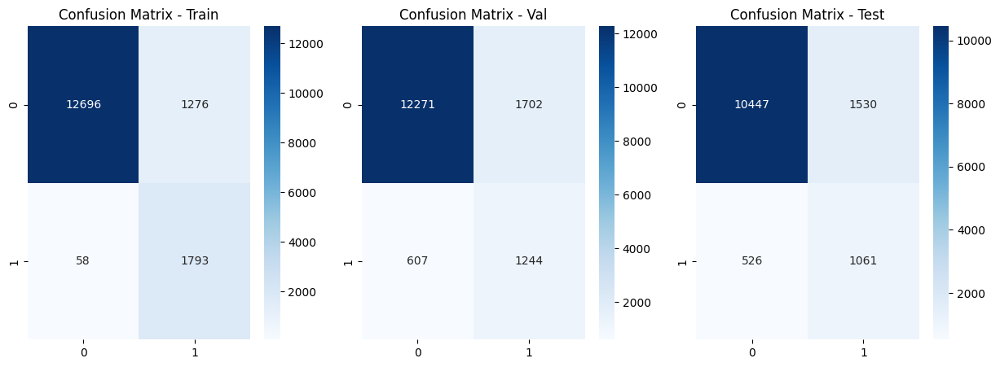

Train Size: 0.8
training set accuracy (n=25317): 0.902
val set accuracy (n=6330): 0.848
test set accuracy(n=13564): 0.857
              precision    recall  f1-score   support

           0       0.99      0.89      0.94     22355
           1       0.55      0.96      0.70      2962

    accuracy                           0.90     25317
   macro avg       0.77      0.93      0.82     25317
weighted avg       0.94      0.90      0.91     25317

              precision    recall  f1-score   support

           0       0.96      0.87      0.91      5590
           1       0.41      0.71      0.52       740

    accuracy                           0.85      6330
   macro avg       0.69      0.79      0.72      6330
weighted avg       0.89      0.85      0.86      6330

              precision    recall  f1-score   support

           0       0.96      0.87      0.91     11977
           1       0.43      0.73      0.55      1587

    accuracy                           0.86     13564
   mac

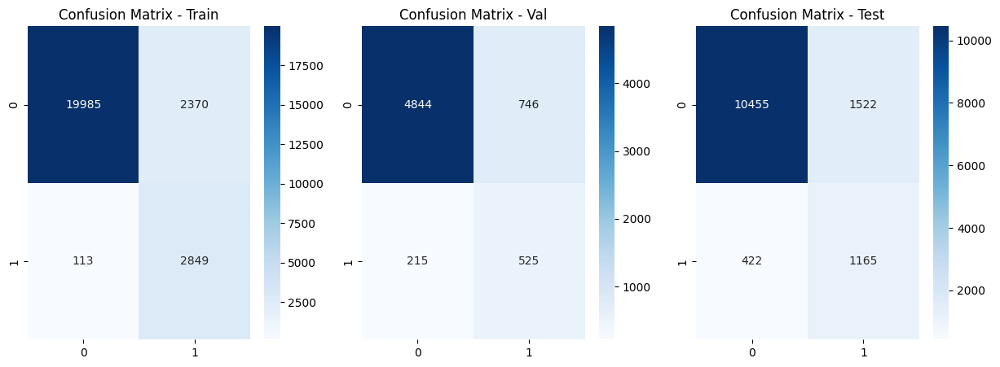

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,DecisionTree,0.2,0.945673,0.855384,0.854218
0,DecisionTree,0.5,0.918758,0.852215,0.851597
0,DecisionTree,0.8,0.907374,0.849921,0.853530


In [175]:
train_sets = [0.2,0.5,0.8]
dt_results_bank = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]
    best_model= Pipeline(
        steps=[
            ("classifier", DecisionTreeClassifier(
                class_weight="balanced",
                **{key.split("__")[1]: value for key, value in b[['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_bank)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_bank_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_bank_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_bank_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_bank_test, y_bank_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_bank_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['DecisionTree'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_bank = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    dt_results_bank= pd.concat([dt_results_bank, result], axis=0)

dt_results_bank

### Best Model + Train size

In [176]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.2


In [177]:
# Eyeballing
best_ratio = best_ratio

In [178]:
best_pipe= Pipeline(
        steps=[
            ("classifier", DecisionTreeClassifier(
                class_weight="balanced",
                **{key.split("__")[1]: value for key, value in best.iloc[best_ratio][['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_bank)
best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"DecisionTree_bank.joblib")
X_train.shape,X_val.shape

((6329, 51), (25318, 51))

In [179]:
best_model = joblib.load(f"DecisionTree_bank.joblib")

In [180]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_bank_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_bank_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_bank_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=6329): 0.941
val set accuracy (n=25318): 0.860
test set accuracy(n=13564): 0.858


Best model train_size: 0.2
              precision    recall  f1-score   support

           0       1.00      0.94      0.97      5589
           1       0.67      0.98      0.80       740

    accuracy                           0.94      6329
   macro avg       0.83      0.96      0.88      6329
weighted avg       0.96      0.94      0.95      6329

              precision    recall  f1-score   support

           0       0.95      0.89      0.92     22356
           1       0.43      0.62      0.51      2962

    accuracy                           0.86     25318
   macro avg       0.69      0.76      0.71     25318
weighted avg       0.89      0.86      0.87     25318

              precision    recall  f1-score   support

           0       0.94      0.89      0.92     11977
           1       0.43      0.61      0.50      1587

    accuracy                           0.86     13564
   macro avg       0.69      0.75      0.71     13564
weighted avg       0.88      0.86      0.87    

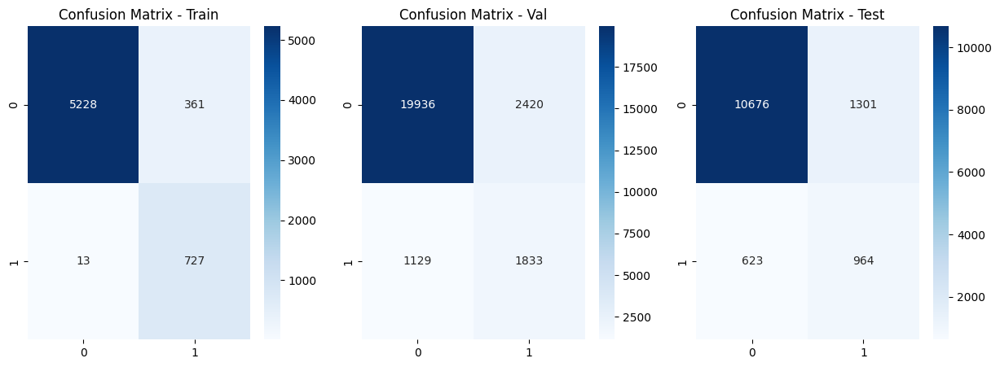

In [181]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_bank_test, y_bank_test)

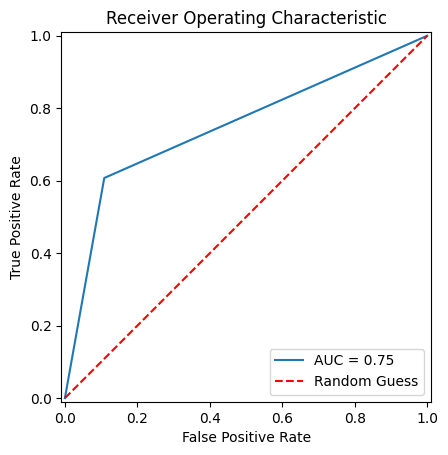

In [182]:
plot_roc_curve(y_bank_test, yhat_test)

# Random Forest

## Iris

In [183]:
pipe = Pipeline(
    steps=[("classifier", RandomForestClassifier(class_weight = 'balanced'))]
)
search_space = {'classifier__n_estimators': randint(100,500),
                'classifier__max_depth': randint(5,20),
               'classifier__min_samples_split': randint(2,20),
               'classifier__criterion': ['gini','entropy']}
search = RandomizedSearchCV(pipe, search_space, n_iter = 25,cv=3, verbose=0)

In [184]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [185]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_size[j], shuffle=True, stratify=y_iris)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_iris_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_iris_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__criterion','classifier__max_depth','classifier__min_samples_split'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)

results = pd.concat(results, ignore_index=True)

results

# result

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,entropy,5,4,1.000000,1.000000,0.902174,0.933333
1,0.1,entropy,5,16,0.694444,1.000000,0.902174,0.933333
2,0.1,entropy,6,8,0.694444,1.000000,0.923913,0.955556
3,0.1,entropy,6,11,0.694444,1.000000,0.931159,0.948148
4,0.1,entropy,6,14,0.694444,1.000000,0.931159,0.948148
...,...,...,...,...,...,...,...,...
628,0.9,gini,18,17,0.945161,0.978022,0.909091,0.977778
629,0.9,gini,19,7,0.923297,0.967033,0.954545,0.977778
630,0.9,gini,19,10,0.901434,0.967033,0.954545,0.977778
631,0.9,gini,19,13,0.912186,0.967033,0.954545,0.977778


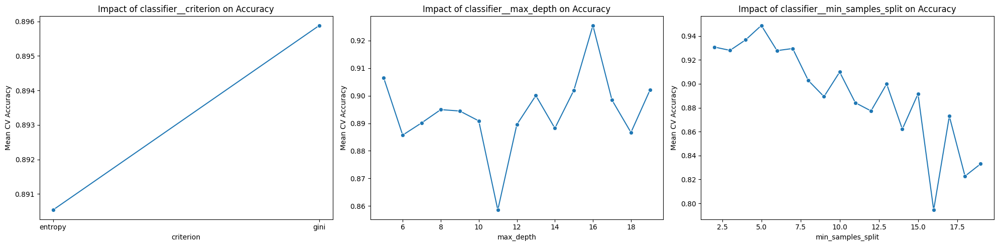

In [186]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

### Learning Curve

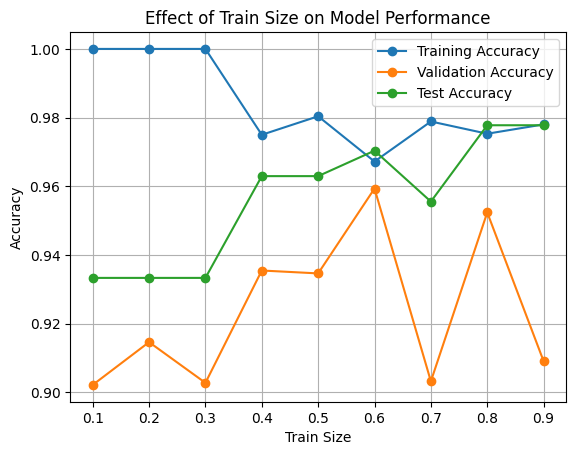

In [187]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [188]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,entropy,5,4,1.000000,1.000000,0.902174,0.933333
1,0.2,entropy,6,4,1.000000,1.000000,0.914634,0.933333
2,0.3,entropy,5,3,1.000000,1.000000,0.902778,0.933333
3,0.4,gini,6,19,0.974359,0.975000,0.935484,0.962963
4,0.5,entropy,11,13,0.980392,0.980392,0.934641,0.962963
5,0.6,entropy,10,13,0.950000,0.967213,0.959350,0.970370
6,0.7,entropy,6,7,0.972222,0.978873,0.903226,0.955556
7,0.8,gini,11,13,0.962963,0.975309,0.952381,0.977778
8,0.9,entropy,13,18,0.956272,0.978022,0.909091,0.977778


### Train Size = 0.2,0.5,0.8

In [189]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,entropy,6,4,1.000000,1.000000,0.914634,0.933333
1,0.5,entropy,11,13,0.980392,0.980392,0.934641,0.962963
2,0.8,gini,11,13,0.962963,0.975309,0.952381,0.977778


Train Size: 0.2
training set accuracy (n=20): 1.000
val set accuracy (n=82): 0.951
test set accuracy(n=45): 0.978
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        13
           1       1.00      1.00      1.00         7

    accuracy                           1.00        20
   macro avg       1.00      1.00      1.00        20
weighted avg       1.00      1.00      1.00        20

              precision    recall  f1-score   support

           0       0.98      0.95      0.96        55
           1       0.90      0.96      0.93        27

    accuracy                           0.95        82
   macro avg       0.94      0.95      0.95        82
weighted avg       0.95      0.95      0.95        82

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        30
           1       1.00      0.93      0.97        15

    accuracy                           0.98        45
   macro avg  

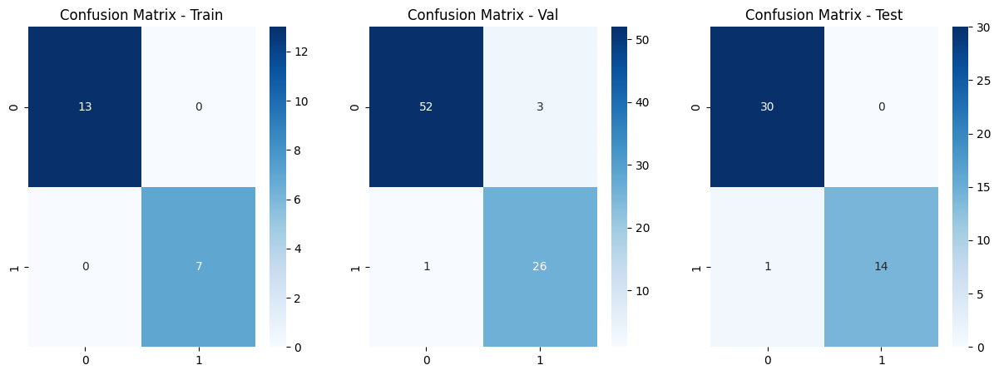

Train Size: 0.5
training set accuracy (n=51): 0.961
val set accuracy (n=51): 0.961
test set accuracy(n=45): 0.978
              precision    recall  f1-score   support

           0       1.00      0.94      0.97        34
           1       0.89      1.00      0.94        17

    accuracy                           0.96        51
   macro avg       0.95      0.97      0.96        51
weighted avg       0.96      0.96      0.96        51

              precision    recall  f1-score   support

           0       1.00      0.94      0.97        34
           1       0.89      1.00      0.94        17

    accuracy                           0.96        51
   macro avg       0.95      0.97      0.96        51
weighted avg       0.96      0.96      0.96        51

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        30
           1       1.00      0.93      0.97        15

    accuracy                           0.98        45
   macro avg  

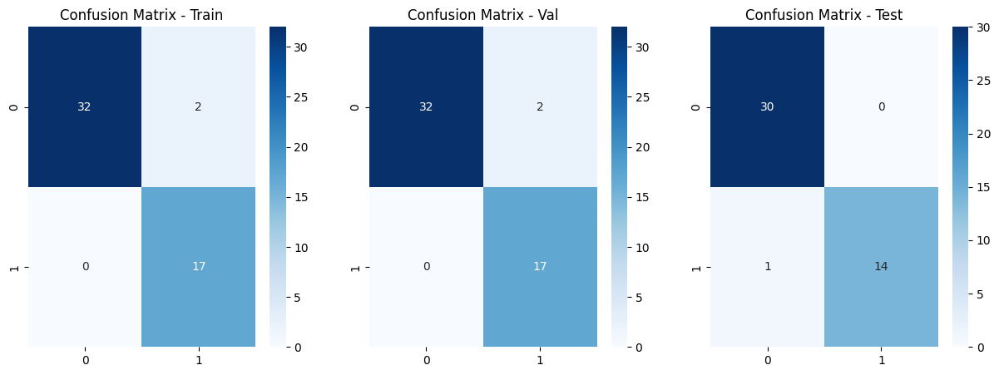

Train Size: 0.8
training set accuracy (n=81): 0.963
val set accuracy (n=21): 1.000
test set accuracy(n=45): 0.978
              precision    recall  f1-score   support

           0       1.00      0.94      0.97        54
           1       0.90      1.00      0.95        27

    accuracy                           0.96        81
   macro avg       0.95      0.97      0.96        81
weighted avg       0.97      0.96      0.96        81

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        14
           1       1.00      1.00      1.00         7

    accuracy                           1.00        21
   macro avg       1.00      1.00      1.00        21
weighted avg       1.00      1.00      1.00        21

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        30
           1       1.00      0.93      0.97        15

    accuracy                           0.98        45
   macro avg  

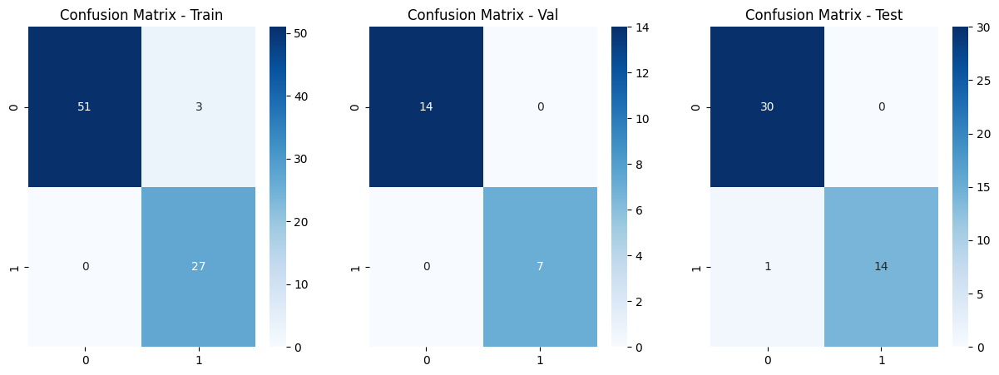

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,RandomForest,0.2,1.000000,0.914634,0.933333
0,RandomForest,0.5,0.980392,0.934641,0.962963
0,RandomForest,0.8,0.975309,0.952381,0.977778


In [190]:
train_sets = [0.2,0.5,0.8]
rf_results_iris = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]
    best_model= Pipeline(
        steps=[
            ("classifier", RandomForestClassifier(
                class_weight="balanced",
                **{key.split("__")[1]: value for key, value in b[['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_iris)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_iris_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_iris_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_iris_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_iris_test, y_iris_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_iris_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['RandomForest'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_iris = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    rf_results_iris= pd.concat([rf_results_iris, result], axis=0)

rf_results_iris

### Best Model + Train size

In [191]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.6


In [192]:
# Eyeballing
best_ratio = best_ratio

In [193]:
best_pipe= Pipeline(
        steps=[
            ("classifier", RandomForestClassifier(
                class_weight = 'balanced',
                **{key.split("__")[1]: value for key, value in best.iloc[best_ratio][['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_iris)
best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"RandomForest_iris.joblib")
X_train.shape,X_val.shape


((61, 4), (41, 4))

In [194]:
best_model = joblib.load(f"RandomForest_iris.joblib")

In [195]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_iris_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_iris_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_iris_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=61): 0.967
val set accuracy (n=41): 1.000
test set accuracy(n=45): 0.978


Best model train_size: 0.6
              precision    recall  f1-score   support

           0       1.00      0.95      0.97        41
           1       0.91      1.00      0.95        20

    accuracy                           0.97        61
   macro avg       0.95      0.98      0.96        61
weighted avg       0.97      0.97      0.97        61

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        27
           1       1.00      1.00      1.00        14

    accuracy                           1.00        41
   macro avg       1.00      1.00      1.00        41
weighted avg       1.00      1.00      1.00        41

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        30
           1       1.00      0.93      0.97        15

    accuracy                           0.98        45
   macro avg       0.98      0.97      0.97        45
weighted avg       0.98      0.98      0.98    

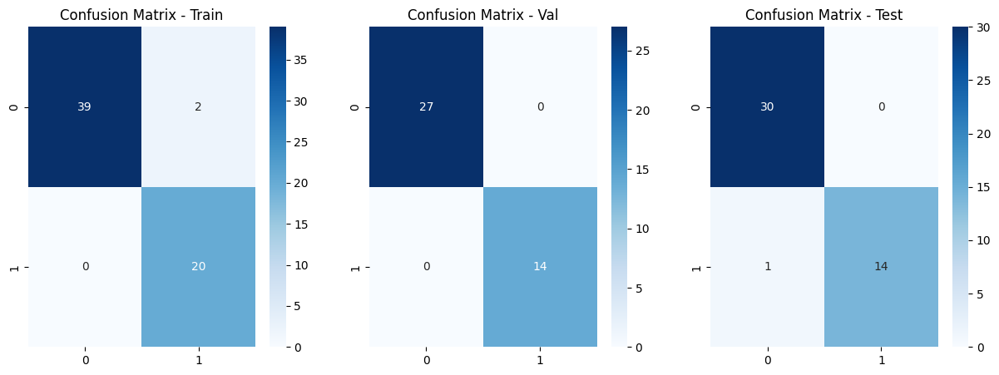

In [196]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_iris_test, y_iris_test)

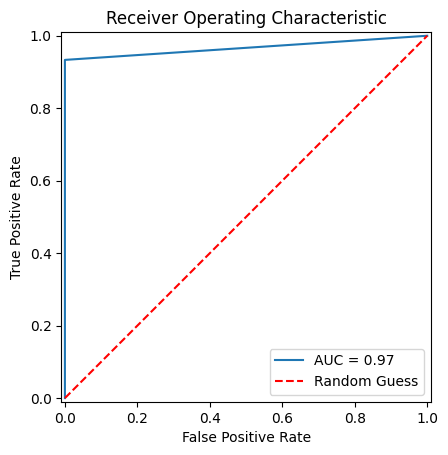

In [197]:
plot_roc_curve(y_iris_test, yhat_test)

## Wine

In [198]:
pipe = Pipeline(
    steps=[("classifier", RandomForestClassifier(class_weight = 'balanced'))]
)
search_space = {'classifier__n_estimators': randint(100,500),
                'classifier__max_depth': randint(5,20),
               'classifier__min_samples_split': randint(2,20),
               'classifier__criterion': ['gini','entropy']}
search = RandomizedSearchCV(pipe, search_space, n_iter = 25,cv=3, verbose=0)

In [199]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [200]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_size[j], shuffle=True, stratify=y_wine)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_wine_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_wine_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__criterion','classifier__max_depth','classifier__min_samples_split'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)

results = pd.concat(results, ignore_index=True)

results

# result

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,entropy,5,2,0.715390,0.931579,0.721963,0.693627
1,0.1,entropy,5,3,0.674059,0.922807,0.718847,0.696078
2,0.1,entropy,5,7,0.748656,0.863158,0.705607,0.691176
3,0.1,entropy,5,8,0.683132,0.931579,0.721963,0.693627
4,0.1,entropy,5,11,0.704301,0.931579,0.721963,0.693627
...,...,...,...,...,...,...,...,...
635,0.9,gini,16,17,0.755556,0.940741,0.802083,0.721405
636,0.9,gini,17,2,0.745029,0.940741,0.802083,0.721405
637,0.9,gini,17,9,0.750877,1.000000,0.802083,0.730392
638,0.9,gini,18,3,0.743470,0.957960,0.800347,0.723584


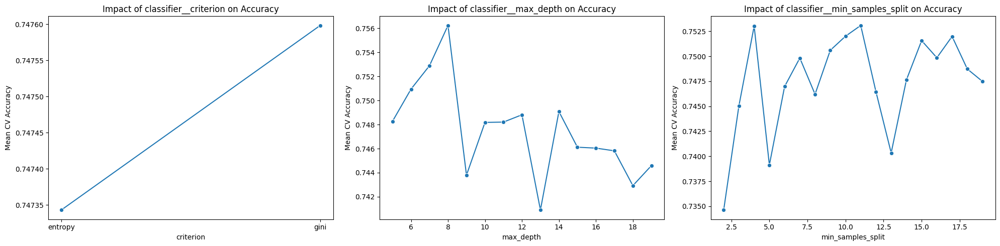

In [201]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

### Learning Curve

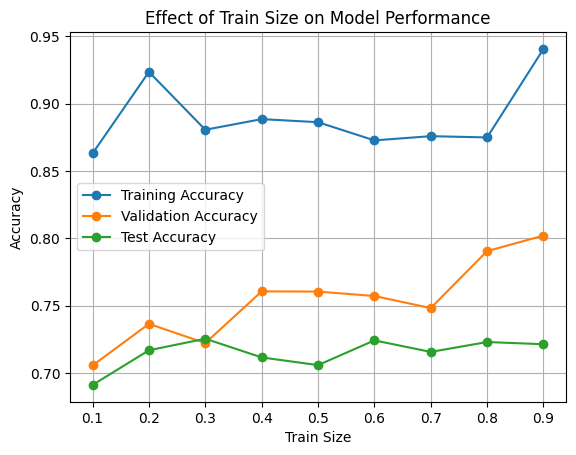

In [202]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [203]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,entropy,6,18,0.758737,0.863158,0.705607,0.691176
1,0.2,gini,12,10,0.831184,0.923684,0.736531,0.716912
2,0.3,entropy,5,16,0.789474,0.880702,0.722222,0.725490
3,0.4,entropy,5,14,0.775122,0.888596,0.760654,0.711601
4,0.5,entropy,8,15,0.751586,0.886316,0.760504,0.705882
5,0.6,entropy,13,17,0.784211,0.872807,0.757218,0.724265
6,0.7,entropy,7,8,0.778946,0.875940,0.748252,0.715686
7,0.8,entropy,7,11,0.771047,0.875000,0.790576,0.723039
8,0.9,entropy,6,6,0.766082,0.940741,0.802083,0.721405


### Train Size = 0.2,0.5,0.8

In [204]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,gini,12,10,0.831184,0.923684,0.736531,0.716912
1,0.5,entropy,8,15,0.751586,0.886316,0.760504,0.705882
2,0.8,entropy,7,11,0.771047,0.875000,0.790576,0.723039


Train Size: 0.2
training set accuracy (n=190): 0.947
val set accuracy (n=761): 0.753
test set accuracy(n=408): 0.730
              precision    recall  f1-score   support

           0       0.93      0.96      0.95        90
           1       0.96      0.94      0.95       100

    accuracy                           0.95       190
   macro avg       0.95      0.95      0.95       190
weighted avg       0.95      0.95      0.95       190

              precision    recall  f1-score   support

           0       0.76      0.69      0.73       358
           1       0.75      0.81      0.78       403

    accuracy                           0.75       761
   macro avg       0.75      0.75      0.75       761
weighted avg       0.75      0.75      0.75       761

              precision    recall  f1-score   support

           0       0.73      0.68      0.70       192
           1       0.73      0.78      0.75       216

    accuracy                           0.73       408
   macro av

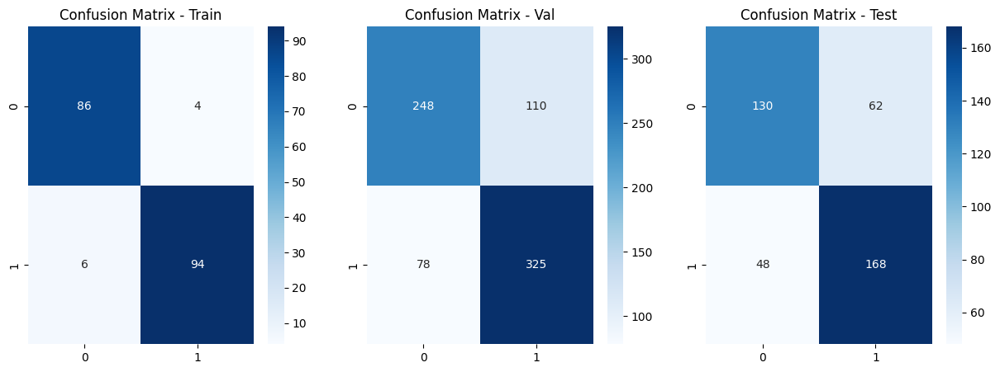

Train Size: 0.5
training set accuracy (n=475): 0.907
val set accuracy (n=476): 0.746
test set accuracy(n=408): 0.701
              precision    recall  f1-score   support

           0       0.88      0.93      0.90       224
           1       0.93      0.89      0.91       251

    accuracy                           0.91       475
   macro avg       0.91      0.91      0.91       475
weighted avg       0.91      0.91      0.91       475

              precision    recall  f1-score   support

           0       0.73      0.73      0.73       224
           1       0.76      0.76      0.76       252

    accuracy                           0.75       476
   macro avg       0.74      0.74      0.74       476
weighted avg       0.75      0.75      0.75       476

              precision    recall  f1-score   support

           0       0.68      0.69      0.69       192
           1       0.72      0.71      0.71       216

    accuracy                           0.70       408
   macro av

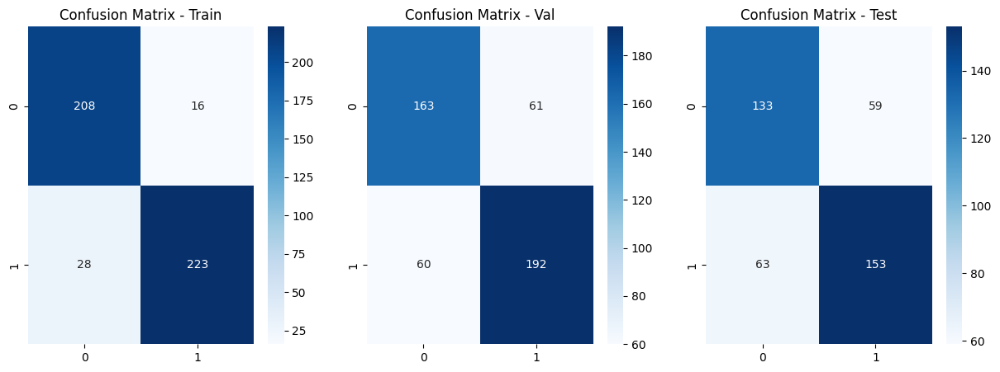

Train Size: 0.8
training set accuracy (n=760): 0.866
val set accuracy (n=191): 0.749
test set accuracy(n=408): 0.716
              precision    recall  f1-score   support

           0       0.83      0.90      0.86       358
           1       0.90      0.84      0.87       402

    accuracy                           0.87       760
   macro avg       0.87      0.87      0.87       760
weighted avg       0.87      0.87      0.87       760

              precision    recall  f1-score   support

           0       0.71      0.78      0.74        90
           1       0.78      0.72      0.75       101

    accuracy                           0.75       191
   macro avg       0.75      0.75      0.75       191
weighted avg       0.75      0.75      0.75       191

              precision    recall  f1-score   support

           0       0.69      0.72      0.71       192
           1       0.74      0.71      0.73       216

    accuracy                           0.72       408
   macro av

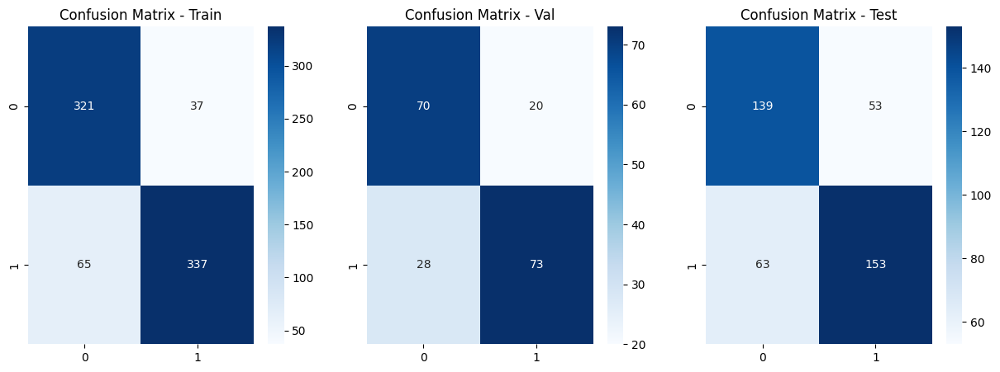

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,RandomForest,0.2,0.923684,0.736531,0.716912
0,RandomForest,0.5,0.886316,0.760504,0.705882
0,RandomForest,0.8,0.875000,0.790576,0.723039


In [205]:
train_sets = [0.2,0.5,0.8]
rf_results_wine = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]
    best_model= Pipeline(
        steps=[
            ("classifier", RandomForestClassifier(
                class_weight="balanced",
                **{key.split("__")[1]: value for key, value in b[['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_wine)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_wine_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_wine_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_wine_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_wine_test, y_wine_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_wine_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['RandomForest'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_wine = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    rf_results_wine= pd.concat([rf_results_wine, result], axis=0)

rf_results_wine

### Best Model + Train size

In [206]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.9


In [207]:
# Eyeballing
best_ratio = best_ratio

In [208]:
best_pipe= Pipeline(
        steps=[
            ("classifier", RandomForestClassifier(
                class_weight = 'balanced',
                **{key.split("__")[1]: value for key, value in best.iloc[best_ratio][['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_wine)
best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"RandomForest_wine.joblib")
X_train.shape,X_val.shape


((855, 11), (96, 11))

In [209]:
best_model = joblib.load(f"RandomForest_wine.joblib")

In [210]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_wine_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_wine_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_wine_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=855): 0.849
val set accuracy (n=96): 0.688
test set accuracy(n=408): 0.723


Best model train_size: 0.9
              precision    recall  f1-score   support

           0       0.82      0.88      0.85       403
           1       0.88      0.82      0.85       452

    accuracy                           0.85       855
   macro avg       0.85      0.85      0.85       855
weighted avg       0.85      0.85      0.85       855

              precision    recall  f1-score   support

           0       0.65      0.71      0.68        45
           1       0.72      0.67      0.69        51

    accuracy                           0.69        96
   macro avg       0.69      0.69      0.69        96
weighted avg       0.69      0.69      0.69        96

              precision    recall  f1-score   support

           0       0.69      0.74      0.72       192
           1       0.76      0.70      0.73       216

    accuracy                           0.72       408
   macro avg       0.72      0.72      0.72       408
weighted avg       0.73      0.72      0.72    

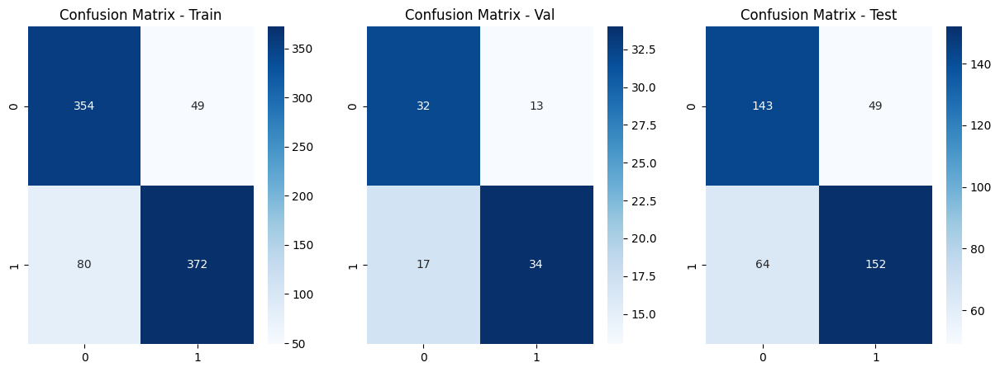

In [211]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_wine_test, y_wine_test)

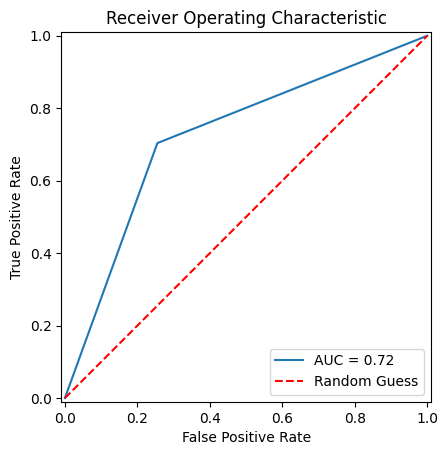

In [212]:
plot_roc_curve(y_wine_test, yhat_test)

## Cancer

In [213]:
pipe = Pipeline(
    steps=[("classifier", RandomForestClassifier(class_weight = 'balanced'))]
)
search_space = {'classifier__n_estimators': randint(100,500),
                'classifier__max_depth': randint(5,20),
               'classifier__min_samples_split': randint(2,20),
               'classifier__criterion': ['gini','entropy']}
search = RandomizedSearchCV(pipe, search_space, n_iter = 25,cv=3, verbose=0)

In [214]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [215]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_size[j], shuffle=True, stratify=y_cancer)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_cancer_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_cancer_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__criterion','classifier__max_depth','classifier__min_samples_split'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)

results = pd.concat(results, ignore_index=True)

results

# result

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,entropy,5,7,0.974359,0.982906,0.924791,0.933723
1,0.1,entropy,6,10,0.871795,0.974359,0.944290,0.935673
2,0.1,entropy,6,12,0.948718,0.982906,0.924791,0.933723
3,0.1,entropy,6,14,0.871795,0.974359,0.924791,0.929825
4,0.1,entropy,7,6,0.948718,0.982906,0.924791,0.933723
...,...,...,...,...,...,...,...,...
622,0.9,gini,19,9,0.949790,0.998138,0.950000,0.955166
623,0.9,gini,19,10,0.946919,0.994413,0.975000,0.959064
624,0.9,gini,19,11,0.946919,0.994413,0.975000,0.959064
625,0.9,gini,19,16,0.946942,0.997207,0.950000,0.959064


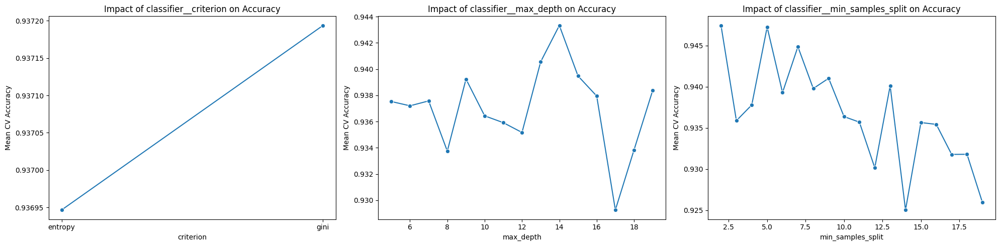

In [216]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

### Learning Curve

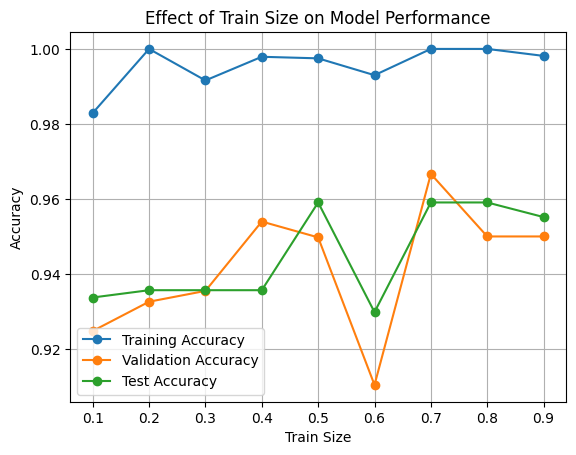

In [217]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [218]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,gini,13,7,1.000000,0.982906,0.924791,0.933723
1,0.2,entropy,10,4,0.962013,1.000000,0.932602,0.935673
2,0.3,entropy,6,19,0.949786,0.991597,0.935484,0.935673
3,0.4,entropy,11,6,0.949686,0.997904,0.953975,0.935673
4,0.5,entropy,13,16,0.964873,0.997487,0.949749,0.959064
5,0.6,gini,5,3,0.958017,0.992997,0.910417,0.929825
6,0.7,entropy,10,6,0.949704,1.000000,0.966667,0.959064
7,0.8,entropy,14,6,0.965409,1.000000,0.950000,0.959064
8,0.9,gini,18,2,0.958170,0.998138,0.950000,0.955166


### Train Size = 0.2,0.5,0.8

In [219]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,entropy,10,4,0.962013,1.000000,0.932602,0.935673
1,0.5,entropy,13,16,0.964873,0.997487,0.949749,0.959064
2,0.8,entropy,14,6,0.965409,1.000000,0.950000,0.959064


Train Size: 0.2
training set accuracy (n=79): 1.000
val set accuracy (n=319): 0.931
test set accuracy(n=171): 0.936
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        50
           1       1.00      1.00      1.00        29

    accuracy                           1.00        79
   macro avg       1.00      1.00      1.00        79
weighted avg       1.00      1.00      1.00        79

              precision    recall  f1-score   support

           0       0.93      0.96      0.95       200
           1       0.94      0.87      0.90       119

    accuracy                           0.93       319
   macro avg       0.93      0.92      0.93       319
weighted avg       0.93      0.93      0.93       319

              precision    recall  f1-score   support

           0       0.91      0.99      0.95       107
           1       0.98      0.84      0.91        64

    accuracy                           0.94       171
   macro avg

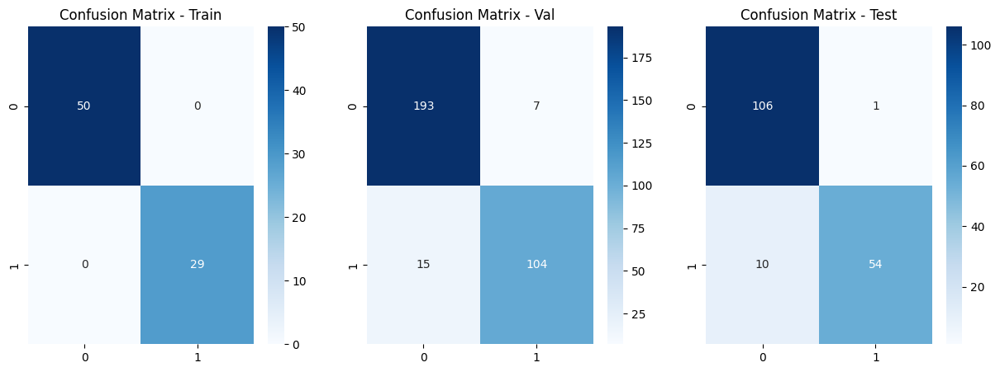

Train Size: 0.5
training set accuracy (n=199): 0.990
val set accuracy (n=199): 0.915
test set accuracy(n=171): 0.901
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       125
           1       0.99      0.99      0.99        74

    accuracy                           0.99       199
   macro avg       0.99      0.99      0.99       199
weighted avg       0.99      0.99      0.99       199

              precision    recall  f1-score   support

           0       0.92      0.95      0.93       125
           1       0.91      0.85      0.88        74

    accuracy                           0.91       199
   macro avg       0.91      0.90      0.91       199
weighted avg       0.91      0.91      0.91       199

              precision    recall  f1-score   support

           0       0.91      0.93      0.92       107
           1       0.89      0.84      0.86        64

    accuracy                           0.90       171
   macro av

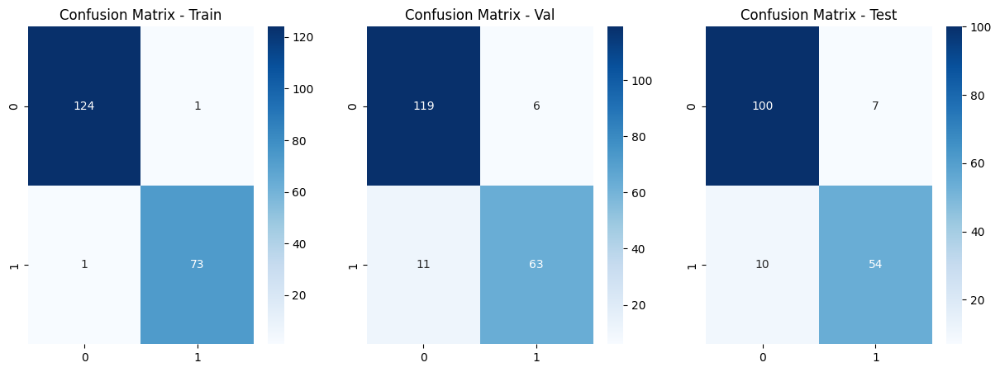

Train Size: 0.8
training set accuracy (n=318): 0.994
val set accuracy (n=80): 0.912
test set accuracy(n=171): 0.947
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       200
           1       1.00      0.98      0.99       118

    accuracy                           0.99       318
   macro avg       1.00      0.99      0.99       318
weighted avg       0.99      0.99      0.99       318

              precision    recall  f1-score   support

           0       0.96      0.90      0.93        50
           1       0.85      0.93      0.89        30

    accuracy                           0.91        80
   macro avg       0.90      0.92      0.91        80
weighted avg       0.92      0.91      0.91        80

              precision    recall  f1-score   support

           0       0.95      0.96      0.96       107
           1       0.94      0.92      0.93        64

    accuracy                           0.95       171
   macro avg

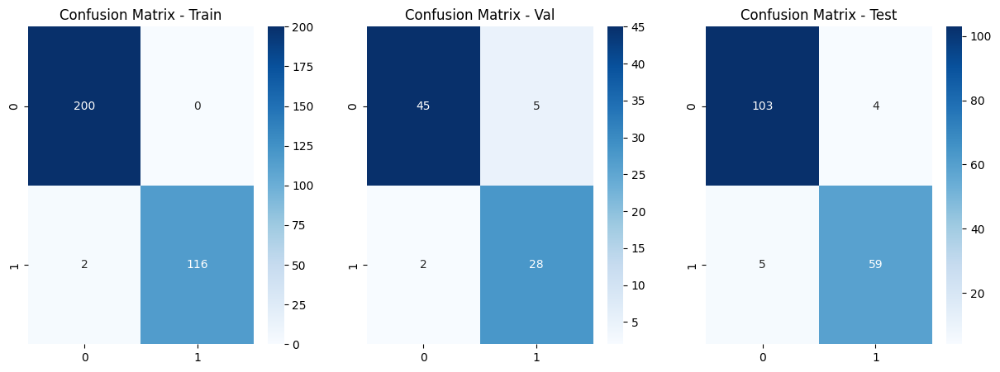

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,RandomForest,0.2,1.000000,0.932602,0.935673
0,RandomForest,0.5,0.997487,0.949749,0.959064
0,RandomForest,0.8,1.000000,0.950000,0.959064


In [220]:
train_sets = [0.2,0.5,0.8]
rf_results_cancer = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]
    best_model= Pipeline(
        steps=[
            ("classifier", RandomForestClassifier(
                class_weight="balanced",
                **{key.split("__")[1]: value for key, value in b[['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_cancer)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_cancer_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_cancer_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_cancer_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_cancer_test, y_cancer_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_cancer_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['RandomForest'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_cancer = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    rf_results_cancer= pd.concat([rf_results_cancer, result], axis=0)

rf_results_cancer

### Best Model + Train size

In [221]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.7


In [222]:
# Eyeballing
best_ratio = best_ratio

In [223]:
best_pipe= Pipeline(
        steps=[
            ("classifier", RandomForestClassifier(
                class_weight = 'balanced',
                **{key.split("__")[1]: value for key, value in best.iloc[best_ratio][['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_cancer)
best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"RandomForest_cancer.joblib")
X_train.shape,X_val.shape


((278, 30), (120, 30))

In [224]:
best_model = joblib.load(f"RandomForest_cancer.joblib")

In [225]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_cancer_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_cancer_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_cancer_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=278): 0.996
val set accuracy (n=120): 0.950
test set accuracy(n=171): 0.947


Best model train_size: 0.7
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       175
           1       1.00      0.99      1.00       103

    accuracy                           1.00       278
   macro avg       1.00      1.00      1.00       278
weighted avg       1.00      1.00      1.00       278

              precision    recall  f1-score   support

           0       0.96      0.96      0.96        75
           1       0.93      0.93      0.93        45

    accuracy                           0.95       120
   macro avg       0.95      0.95      0.95       120
weighted avg       0.95      0.95      0.95       120

              precision    recall  f1-score   support

           0       0.95      0.97      0.96       107
           1       0.95      0.91      0.93        64

    accuracy                           0.95       171
   macro avg       0.95      0.94      0.94       171
weighted avg       0.95      0.95      0.95    

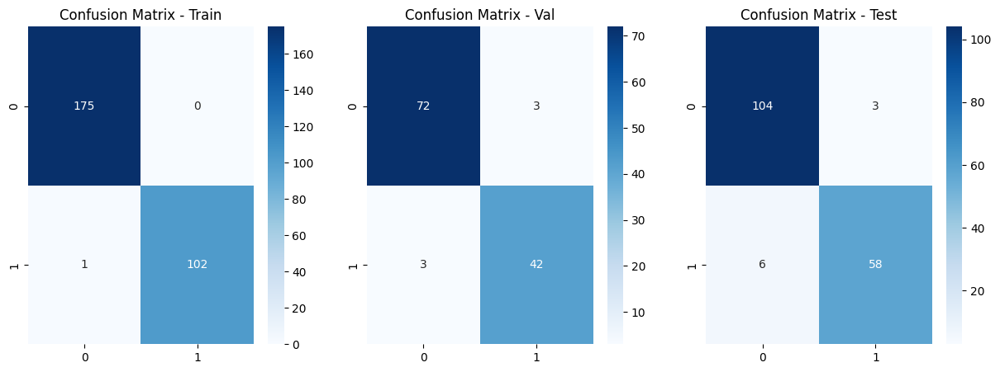

In [226]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_cancer_test, y_cancer_test)

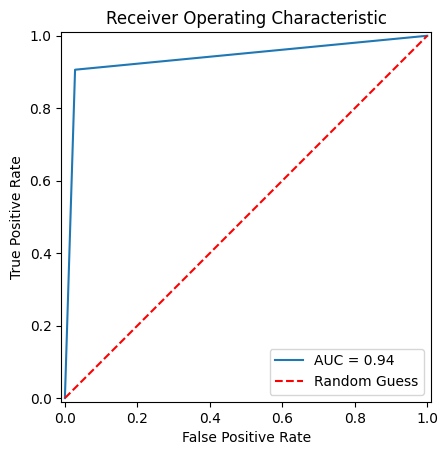

In [227]:
plot_roc_curve(y_cancer_test, yhat_test)

## Bank

In [228]:
pipe = Pipeline(
    steps=[("classifier", RandomForestClassifier(class_weight = 'balanced'))]
)
search_space = {'classifier__n_estimators': randint(100,500),
                'classifier__max_depth': randint(5,20),
               'classifier__min_samples_split': randint(2,20),
               'classifier__criterion': ['gini','entropy']}
search = RandomizedSearchCV(pipe, search_space, n_iter = 25,cv=3, verbose=0)

In [229]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [230]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_size[j], shuffle=True, stratify=y_bank)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_bank_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_bank_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__criterion','classifier__max_depth','classifier__min_samples_split'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)

results = pd.concat(results, ignore_index=True)

results

# result

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,entropy,5,8,0.846717,0.992415,0.899484,0.900005
1,0.1,entropy,5,19,0.842608,0.992415,0.899484,0.900005
2,0.1,entropy,6,3,0.847020,0.993205,0.900256,0.900693
3,0.1,entropy,6,4,0.844808,0.993205,0.900256,0.900693
4,0.1,entropy,6,10,0.856830,0.992415,0.899484,0.900005
...,...,...,...,...,...,...,...,...
626,0.9,gini,16,7,0.887859,0.972567,0.900263,0.899194
627,0.9,gini,16,17,0.879608,0.972567,0.900263,0.899194
628,0.9,gini,17,13,0.886525,0.982726,0.901738,0.900103
629,0.9,gini,17,17,0.879503,0.975283,0.901422,0.900140


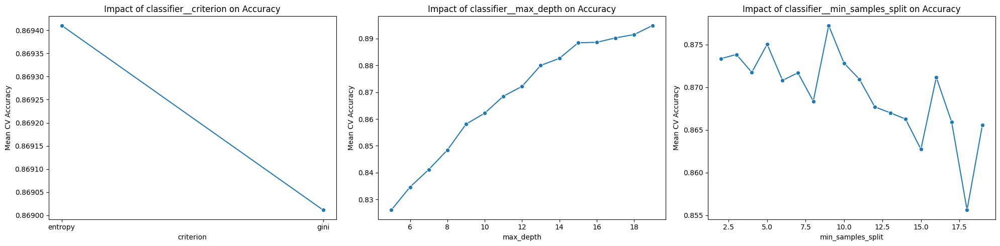

In [231]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

### Learning Curve

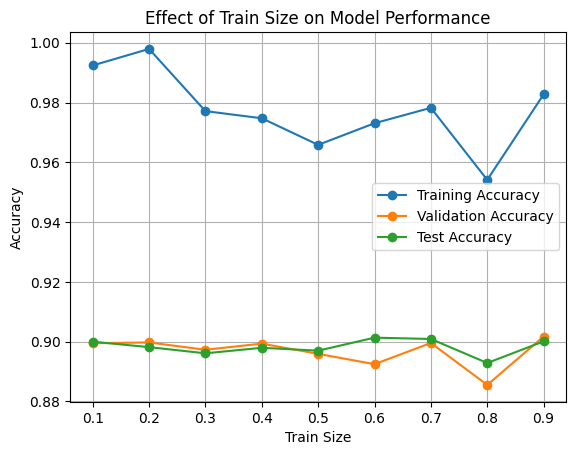

In [232]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [233]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,gini,15,5,0.905813,0.992415,0.899484,0.900005
1,0.2,entropy,19,10,0.898561,0.997946,0.899755,0.898186
2,0.3,gini,17,5,0.901516,0.977143,0.897305,0.896122
3,0.4,gini,19,7,0.898957,0.974746,0.899363,0.897965
4,0.5,entropy,18,4,0.899324,0.965851,0.895939,0.897007
5,0.6,entropy,19,6,0.901622,0.973088,0.892488,0.901357
6,0.7,entropy,19,4,0.902311,0.978241,0.899579,0.900914
7,0.8,gini,16,2,0.896078,0.954141,0.885545,0.892878
8,0.9,entropy,19,2,0.899831,0.982726,0.901738,0.900103


### Train Size = 0.2,0.5,0.8

In [234]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__criterion,classifier__max_depth,classifier__min_samples_split,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,entropy,19,10,0.898561,0.997946,0.899755,0.898186
1,0.5,entropy,18,4,0.899324,0.965851,0.895939,0.897007
2,0.8,gini,16,2,0.896078,0.954141,0.885545,0.892878


Train Size: 0.2
training set accuracy (n=6329): 0.973
val set accuracy (n=25318): 0.900
test set accuracy(n=13564): 0.899
              precision    recall  f1-score   support

           0       1.00      0.97      0.98      5589
           1       0.82      0.98      0.89       740

    accuracy                           0.97      6329
   macro avg       0.91      0.98      0.94      6329
weighted avg       0.98      0.97      0.97      6329

              precision    recall  f1-score   support

           0       0.94      0.95      0.94     22356
           1       0.58      0.55      0.56      2962

    accuracy                           0.90     25318
   macro avg       0.76      0.75      0.75     25318
weighted avg       0.90      0.90      0.90     25318

              precision    recall  f1-score   support

           0       0.94      0.95      0.94     11977
           1       0.57      0.54      0.55      1587

    accuracy                           0.90     13564
   mac

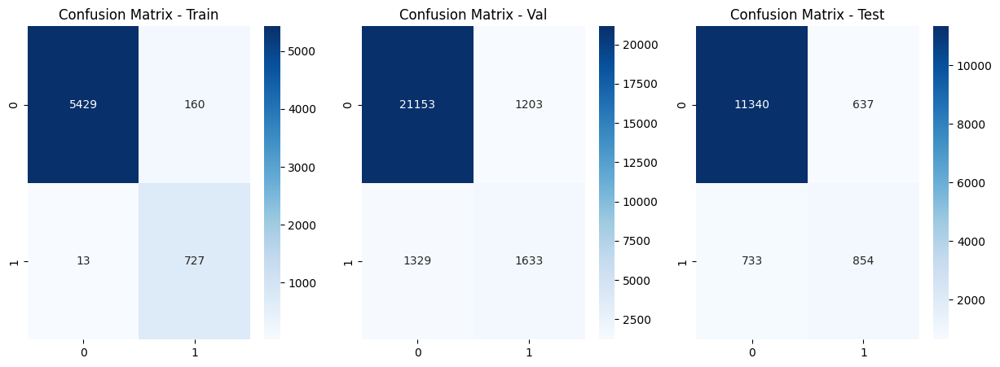

Train Size: 0.5
training set accuracy (n=15823): 0.979
val set accuracy (n=15824): 0.900
test set accuracy(n=13564): 0.898
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     13972
           1       0.86      0.98      0.92      1851

    accuracy                           0.98     15823
   macro avg       0.93      0.98      0.95     15823
weighted avg       0.98      0.98      0.98     15823

              precision    recall  f1-score   support

           0       0.94      0.94      0.94     13973
           1       0.57      0.56      0.57      1851

    accuracy                           0.90     15824
   macro avg       0.76      0.75      0.76     15824
weighted avg       0.90      0.90      0.90     15824

              precision    recall  f1-score   support

           0       0.94      0.94      0.94     11977
           1       0.57      0.56      0.56      1587

    accuracy                           0.90     13564
   ma

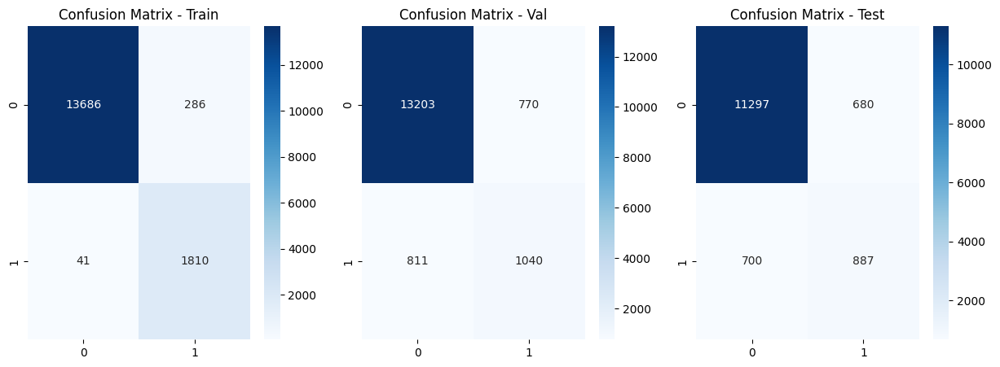

Train Size: 0.8
training set accuracy (n=25317): 0.957
val set accuracy (n=6330): 0.890
test set accuracy(n=13564): 0.893
              precision    recall  f1-score   support

           0       1.00      0.96      0.98     22355
           1       0.74      0.97      0.84      2962

    accuracy                           0.96     25317
   macro avg       0.87      0.96      0.91     25317
weighted avg       0.97      0.96      0.96     25317

              precision    recall  f1-score   support

           0       0.95      0.93      0.94      5590
           1       0.53      0.60      0.56       740

    accuracy                           0.89      6330
   macro avg       0.74      0.77      0.75      6330
weighted avg       0.90      0.89      0.89      6330

              precision    recall  f1-score   support

           0       0.95      0.93      0.94     11977
           1       0.54      0.63      0.58      1587

    accuracy                           0.89     13564
   mac

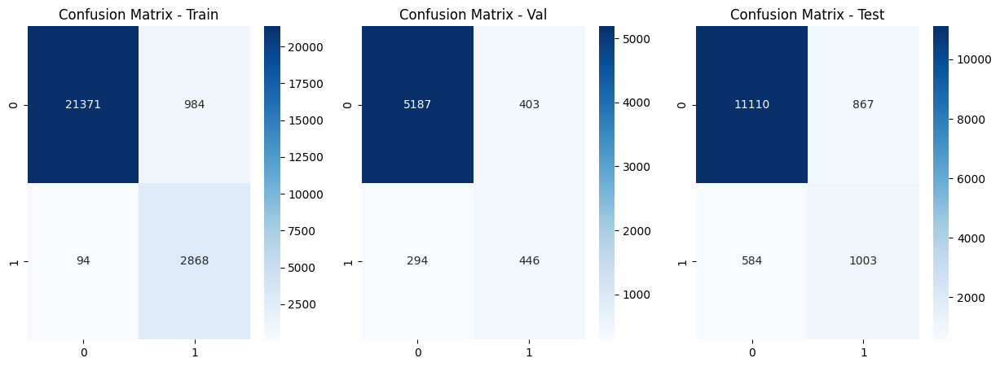

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,RandomForest,0.2,0.997946,0.899755,0.898186
0,RandomForest,0.5,0.965851,0.895939,0.897007
0,RandomForest,0.8,0.954141,0.885545,0.892878


In [235]:
train_sets = [0.2,0.5,0.8]
rf_results_bank = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]
    best_model= Pipeline(
        steps=[
            ("classifier", RandomForestClassifier(
                class_weight="balanced",
                **{key.split("__")[1]: value for key, value in b[['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_bank)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_bank_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_bank_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_bank_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_bank_test, y_bank_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_bank_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['RandomForest'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_bank = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    rf_results_bank= pd.concat([rf_results_bank, result], axis=0)

rf_results_bank

### Best Model + Train size

In [236]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.9


In [237]:
# Eyeballing
best_ratio = best_ratio

In [238]:
best_pipe= Pipeline(
        steps=[
            ("classifier", RandomForestClassifier(
                class_weight = 'balanced',
                **{key.split("__")[1]: value for key, value in best.iloc[best_ratio][['classifier__criterion', 'classifier__max_depth', 'classifier__min_samples_split']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_bank)
best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"RandomForest_bank.joblib")
X_train.shape,X_val.shape


((28482, 51), (3165, 51))

In [239]:
best_model = joblib.load(f"RandomForest_bank.joblib")

In [240]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_bank_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_bank_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_bank_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=28482): 0.985
val set accuracy (n=3165): 0.897
test set accuracy(n=13564): 0.901


Best model train_size: 0.9
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     25150
           1       0.89      0.99      0.94      3332

    accuracy                           0.98     28482
   macro avg       0.95      0.99      0.97     28482
weighted avg       0.99      0.98      0.99     28482

              precision    recall  f1-score   support

           0       0.94      0.94      0.94      2795
           1       0.56      0.54      0.55       370

    accuracy                           0.90      3165
   macro avg       0.75      0.74      0.74      3165
weighted avg       0.89      0.90      0.90      3165

              precision    recall  f1-score   support

           0       0.94      0.95      0.94     11977
           1       0.58      0.55      0.57      1587

    accuracy                           0.90     13564
   macro avg       0.76      0.75      0.76     13564
weighted avg       0.90      0.90      0.90    

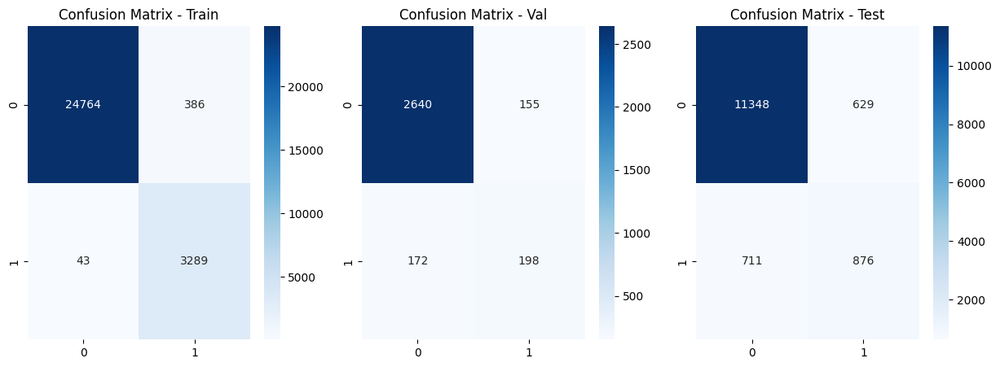

In [241]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_bank_test, y_bank_test)

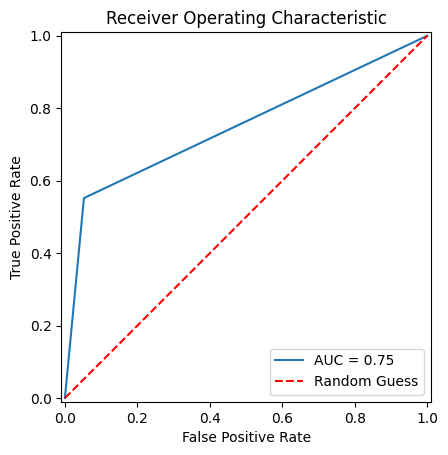

In [242]:
plot_roc_curve(y_bank_test, yhat_test)

# KNN

## Iris

In [243]:
pipe = Pipeline(
    steps=[("classifier", KNeighborsClassifier())]
)
search_space = {'classifier__n_neighbors' : np.arange(1,31,1)}
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [244]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

In [245]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_size[j], shuffle=True, stratify=y_iris)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_iris_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_iris_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__n_neighbors'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)
    
results = pd.concat(results, ignore_index=True)

results

# result

,Train Size,classifier__n_neighbors,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,1,0.935185,0.938889,0.722826,0.745679
1,0.1,2,0.870370,0.938889,0.722826,0.745679
2,0.1,3,0.870370,0.938889,0.722826,0.745679
3,0.1,4,0.694444,0.938889,0.722826,0.745679
4,0.1,5,0.694444,0.938889,0.722826,0.745679
...,...,...,...,...,...,...
265,0.9,26,0.864277,0.967033,0.944444,0.938272
266,0.9,27,0.860573,0.967033,0.944444,0.938272
267,0.9,28,0.868100,0.967033,0.944444,0.938272
268,0.9,29,0.853286,0.967033,0.944444,0.938272


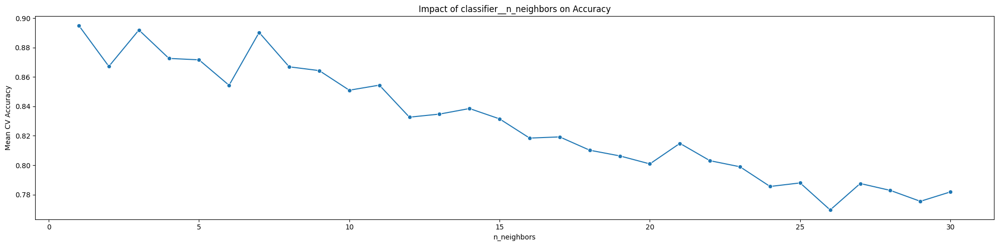

In [246]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

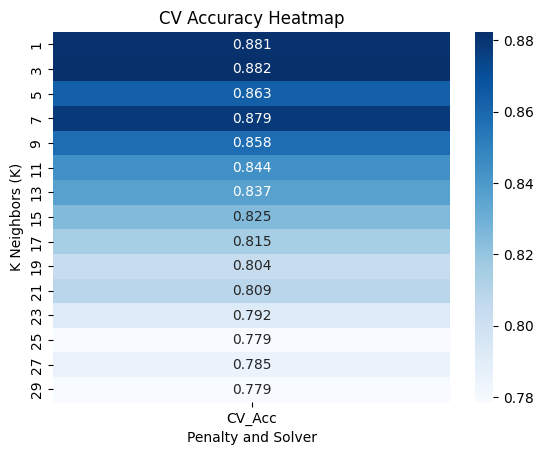

In [247]:
# Pivot table for heatmap
heatmap_data = results.pivot_table(
    values='CV_Acc', 
    index=pd.cut(results['classifier__n_neighbors'], bins=15),
    columns=None
)
heatmap_data.index = [f"{int(x.mid)}" for x in heatmap_data.index]
sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
plt.title('CV Accuracy Heatmap')
plt.xlabel('Penalty and Solver')
plt.ylabel('K Neighbors (K)')
plt.show()



### Learning Curve

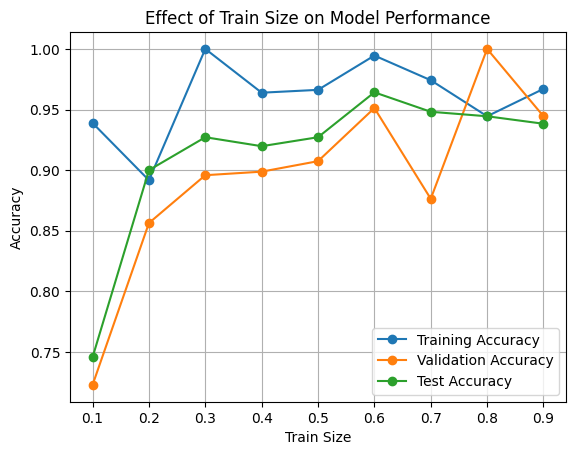

In [248]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [249]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__n_neighbors,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,1,0.935185,0.938889,0.722826,0.745679
1,0.2,4,0.783069,0.891667,0.856369,0.900000
2,0.3,1,0.911111,1.000000,0.895833,0.927160
3,0.4,5,0.916972,0.963889,0.898746,0.919753
4,0.5,4,0.901961,0.966231,0.907407,0.927160
5,0.6,1,0.923545,0.994536,0.951220,0.964198
6,0.7,5,0.958132,0.974178,0.876344,0.948148
7,0.8,3,0.934156,0.944444,1.000000,0.944444
8,0.9,7,0.944922,0.967033,0.944444,0.938272


### Train Size = 0.2,0.5,0.8

In [250]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__n_neighbors,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,4,0.783069,0.891667,0.856369,0.900000
1,0.5,4,0.901961,0.966231,0.907407,0.927160
2,0.8,3,0.934156,0.944444,1.000000,0.944444


Train Size: 0.2
training set accuracy (n=20): 0.900
val set accuracy (n=82): 0.963
test set accuracy(n=45): 0.978
              precision    recall  f1-score   support

           0       0.92      0.92      0.92        13
           1       0.86      0.86      0.86         7

    accuracy                           0.90        20
   macro avg       0.89      0.89      0.89        20
weighted avg       0.90      0.90      0.90        20

              precision    recall  f1-score   support

           0       1.00      0.95      0.97        55
           1       0.90      1.00      0.95        27

    accuracy                           0.96        82
   macro avg       0.95      0.97      0.96        82
weighted avg       0.97      0.96      0.96        82

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        30
           1       1.00      0.93      0.97        15

    accuracy                           0.98        45
   macro avg  

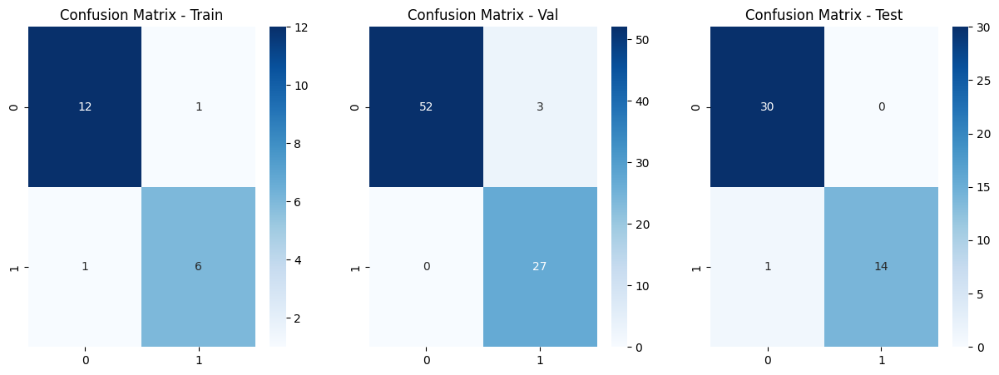

Train Size: 0.5
training set accuracy (n=51): 0.922
val set accuracy (n=51): 0.961
test set accuracy(n=45): 0.978
              precision    recall  f1-score   support

           0       0.92      0.97      0.94        34
           1       0.93      0.82      0.88        17

    accuracy                           0.92        51
   macro avg       0.93      0.90      0.91        51
weighted avg       0.92      0.92      0.92        51

              precision    recall  f1-score   support

           0       0.94      1.00      0.97        34
           1       1.00      0.88      0.94        17

    accuracy                           0.96        51
   macro avg       0.97      0.94      0.95        51
weighted avg       0.96      0.96      0.96        51

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        30
           1       1.00      0.93      0.97        15

    accuracy                           0.98        45
   macro avg  

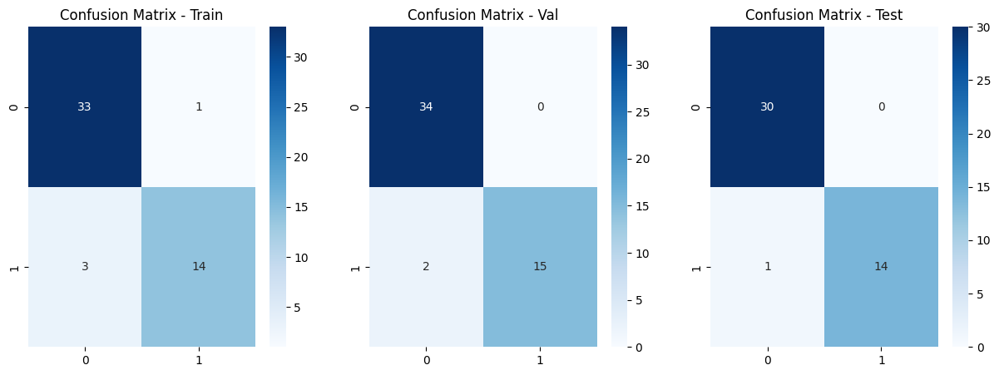

Train Size: 0.8
training set accuracy (n=81): 0.975
val set accuracy (n=21): 0.952
test set accuracy(n=45): 0.933
              precision    recall  f1-score   support

           0       0.98      0.98      0.98        54
           1       0.96      0.96      0.96        27

    accuracy                           0.98        81
   macro avg       0.97      0.97      0.97        81
weighted avg       0.98      0.98      0.98        81

              precision    recall  f1-score   support

           0       0.93      1.00      0.97        14
           1       1.00      0.86      0.92         7

    accuracy                           0.95        21
   macro avg       0.97      0.93      0.94        21
weighted avg       0.96      0.95      0.95        21

              precision    recall  f1-score   support

           0       0.91      1.00      0.95        30
           1       1.00      0.80      0.89        15

    accuracy                           0.93        45
   macro avg  

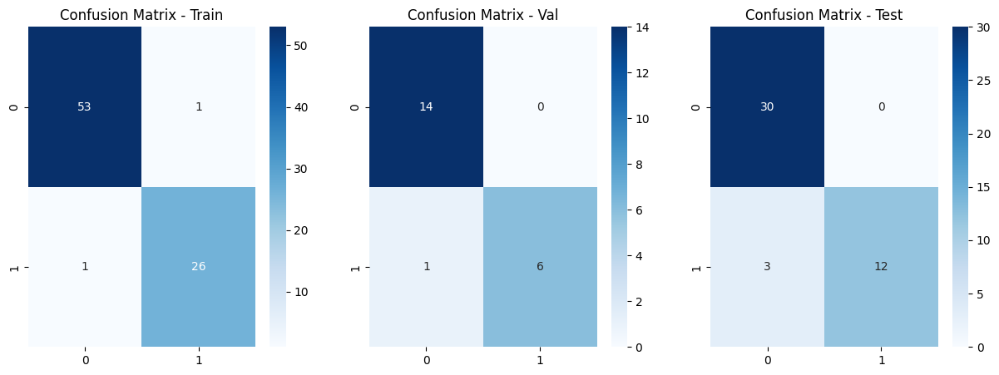

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,KNN,0.2,0.891667,0.856369,0.900000
0,KNN,0.5,0.966231,0.907407,0.927160
0,KNN,0.8,0.944444,1.000000,0.944444


In [251]:
train_sets = [0.2,0.5,0.8]
knn_results_iris = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]

    best_pipe= Pipeline(
        steps=[
            ("classifier", KNeighborsClassifier(
                **{key.split("__")[1]: value for key, value in b[['classifier__n_neighbors']].items()}
            ))
        ]
    )


    
    X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_iris)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_iris_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_iris_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_iris_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_iris_test, y_iris_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_iris_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['KNN'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # knn_results_iris = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    knn_results_iris= pd.concat([knn_results_iris, result], axis=0)

knn_results_iris

### Best Model + Train size

In [252]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.8


In [253]:
# Eyeballing
best_ratio = best_ratio

In [254]:
best_pipe= Pipeline(
    steps=[
            ("classifier", KNeighborsClassifier(
                **{key.split("__")[1]: int(value) for key, value in best.iloc[best_ratio][['classifier__n_neighbors']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_iris)

best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"KNN_iris.joblib")
X_train.shape,X_val.shape

((81, 4), (21, 4))

In [255]:
best_model = joblib.load(f"KNN_iris.joblib")

In [256]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_iris_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_iris_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_iris_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=81): 0.975
val set accuracy (n=21): 0.952
test set accuracy(n=45): 0.933


Best model train_size: 0.8
              precision    recall  f1-score   support

           0       0.98      0.98      0.98        54
           1       0.96      0.96      0.96        27

    accuracy                           0.98        81
   macro avg       0.97      0.97      0.97        81
weighted avg       0.98      0.98      0.98        81

              precision    recall  f1-score   support

           0       0.93      1.00      0.97        14
           1       1.00      0.86      0.92         7

    accuracy                           0.95        21
   macro avg       0.97      0.93      0.94        21
weighted avg       0.96      0.95      0.95        21

              precision    recall  f1-score   support

           0       0.91      1.00      0.95        30
           1       1.00      0.80      0.89        15

    accuracy                           0.93        45
   macro avg       0.95      0.90      0.92        45
weighted avg       0.94      0.93      0.93    

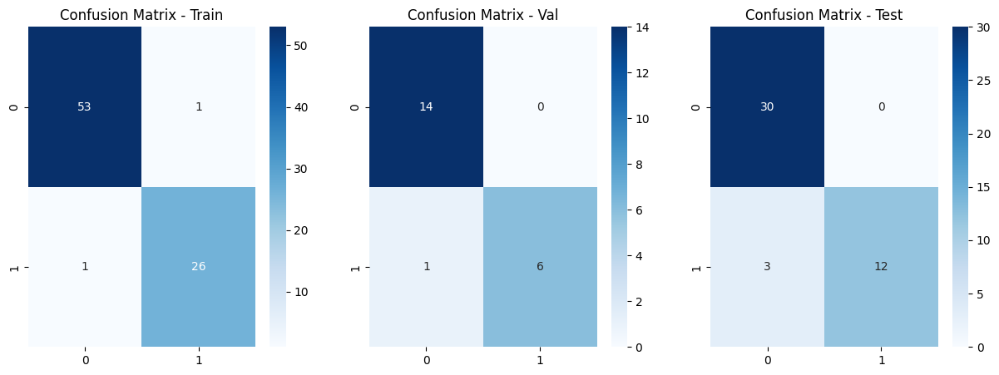

In [257]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_iris_test, y_iris_test)

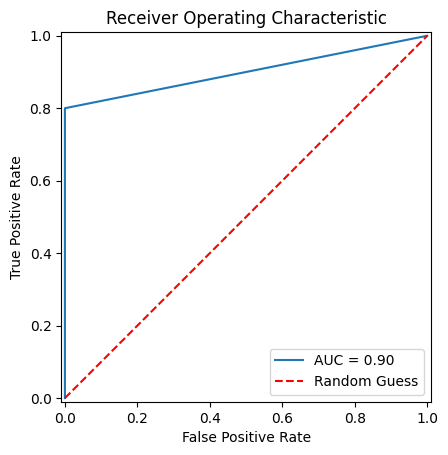

In [258]:
plot_roc_curve(y_iris_test, yhat_test)

## Wine

In [259]:
pipe = Pipeline(
    steps=[("classifier", KNeighborsClassifier())]
)
search_space = {'classifier__n_neighbors' : np.arange(1,31,1)}
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [260]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

In [261]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_size[j], shuffle=True, stratify=y_wine)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_wine_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_wine_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__n_neighbors'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)
    
results = pd.concat(results, ignore_index=True)

results

# result

,Train Size,classifier__n_neighbors,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,1,0.641801,0.783626,0.699117,0.662990
1,0.1,2,0.656138,0.783626,0.699117,0.662990
2,0.1,3,0.719198,0.783626,0.699117,0.662990
3,0.1,4,0.701725,0.783626,0.699117,0.662990
4,0.1,5,0.736559,0.783626,0.699117,0.662990
...,...,...,...,...,...,...
265,0.9,26,0.725536,0.763613,0.784722,0.698393
266,0.9,27,0.727096,0.763613,0.784722,0.698393
267,0.9,28,0.727096,0.763613,0.784722,0.698393
268,0.9,29,0.732554,0.763613,0.784722,0.698393


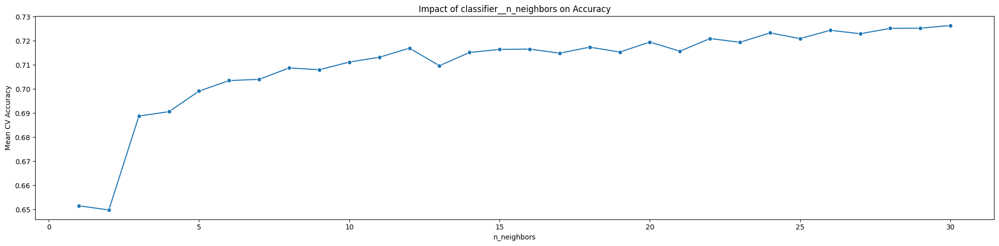

In [262]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

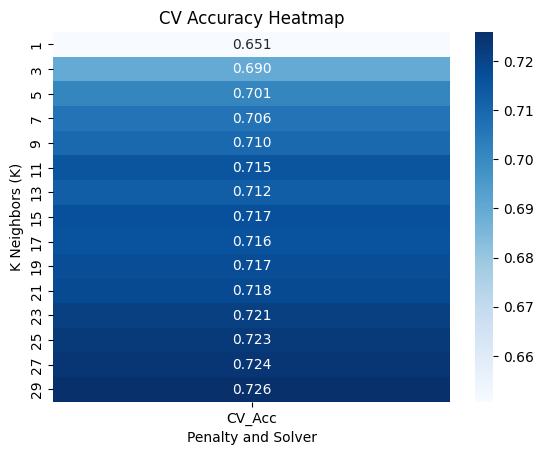

In [263]:
# Pivot table for heatmap
heatmap_data = results.pivot_table(
    values='CV_Acc', 
    index=pd.cut(results['classifier__n_neighbors'], bins=15),
    columns=None
)
heatmap_data.index = [f"{int(x.mid)}" for x in heatmap_data.index]
sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
plt.title('CV Accuracy Heatmap')
plt.xlabel('Penalty and Solver')
plt.ylabel('K Neighbors (K)')
plt.show()



### Learning Curve

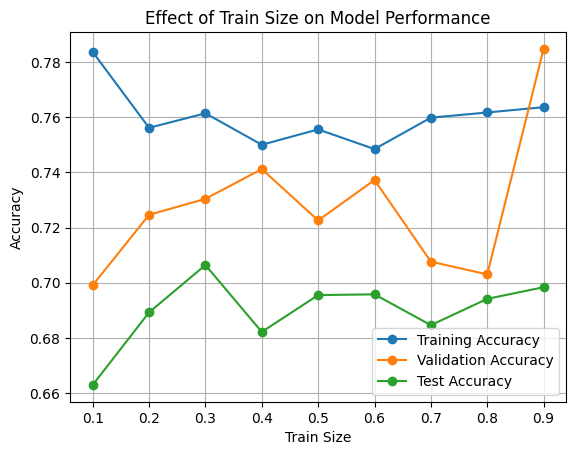

In [264]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [265]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__n_neighbors,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,12,0.746976,0.783626,0.699117,0.662990
1,0.2,25,0.722884,0.756140,0.724631,0.689270
2,0.3,30,0.726316,0.761404,0.730397,0.706427
3,0.4,23,0.722812,0.750000,0.741195,0.682190
4,0.5,28,0.743877,0.755556,0.722572,0.695534
5,0.6,30,0.732164,0.748441,0.737241,0.695806
6,0.7,29,0.744342,0.759816,0.707653,0.684641
7,0.8,30,0.736820,0.761696,0.703025,0.694172
8,0.9,29,0.732554,0.763613,0.784722,0.698393


### Train Size = 0.2,0.5,0.8

In [266]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__n_neighbors,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,25,0.722884,0.756140,0.724631,0.689270
1,0.5,28,0.743877,0.755556,0.722572,0.695534
2,0.8,30,0.736820,0.761696,0.703025,0.694172


Train Size: 0.2
training set accuracy (n=190): 0.700
val set accuracy (n=761): 0.729
test set accuracy(n=408): 0.696
              precision    recall  f1-score   support

           0       0.67      0.71      0.69        90
           1       0.73      0.69      0.71       100

    accuracy                           0.70       190
   macro avg       0.70      0.70      0.70       190
weighted avg       0.70      0.70      0.70       190

              precision    recall  f1-score   support

           0       0.72      0.69      0.71       358
           1       0.74      0.76      0.75       403

    accuracy                           0.73       761
   macro avg       0.73      0.73      0.73       761
weighted avg       0.73      0.73      0.73       761

              precision    recall  f1-score   support

           0       0.69      0.64      0.66       192
           1       0.70      0.75      0.72       216

    accuracy                           0.70       408
   macro av

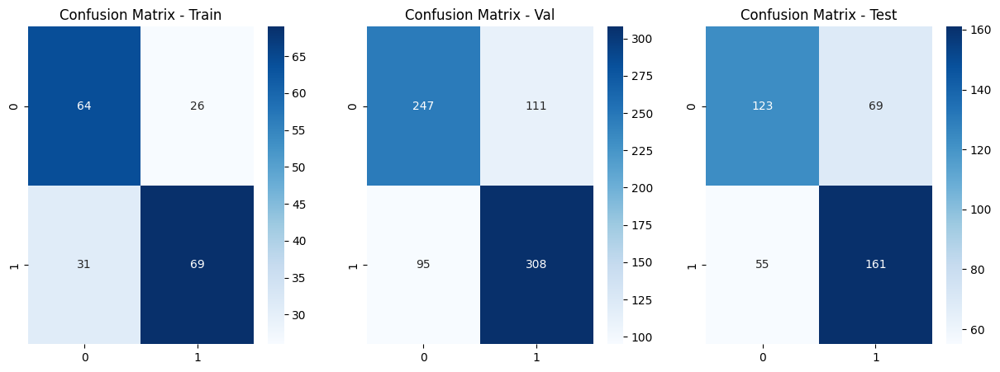

Train Size: 0.5
training set accuracy (n=475): 0.758
val set accuracy (n=476): 0.733
test set accuracy(n=408): 0.703
              precision    recall  f1-score   support

           0       0.76      0.71      0.74       224
           1       0.76      0.80      0.78       251

    accuracy                           0.76       475
   macro avg       0.76      0.76      0.76       475
weighted avg       0.76      0.76      0.76       475

              precision    recall  f1-score   support

           0       0.74      0.67      0.70       224
           1       0.73      0.79      0.76       252

    accuracy                           0.73       476
   macro avg       0.73      0.73      0.73       476
weighted avg       0.73      0.73      0.73       476

              precision    recall  f1-score   support

           0       0.70      0.65      0.67       192
           1       0.71      0.75      0.73       216

    accuracy                           0.70       408
   macro av

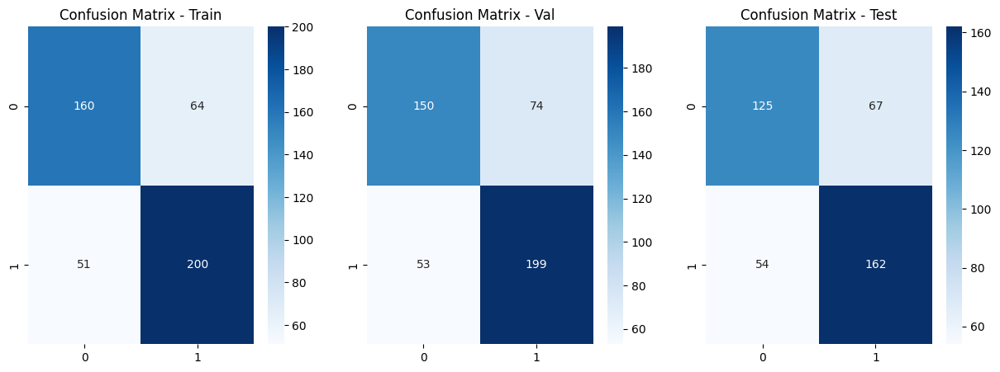

Train Size: 0.8
training set accuracy (n=760): 0.767
val set accuracy (n=191): 0.723
test set accuracy(n=408): 0.686
              precision    recall  f1-score   support

           0       0.76      0.75      0.75       358
           1       0.78      0.79      0.78       402

    accuracy                           0.77       760
   macro avg       0.77      0.77      0.77       760
weighted avg       0.77      0.77      0.77       760

              precision    recall  f1-score   support

           0       0.71      0.70      0.70        90
           1       0.74      0.74      0.74       101

    accuracy                           0.72       191
   macro avg       0.72      0.72      0.72       191
weighted avg       0.72      0.72      0.72       191

              precision    recall  f1-score   support

           0       0.68      0.62      0.65       192
           1       0.69      0.74      0.71       216

    accuracy                           0.69       408
   macro av

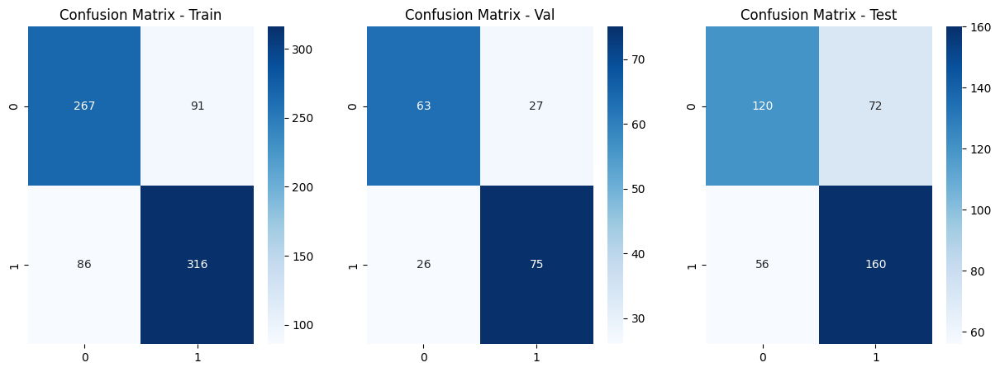

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,KNN,0.2,0.756140,0.724631,0.689270
0,KNN,0.5,0.755556,0.722572,0.695534
0,KNN,0.8,0.761696,0.703025,0.694172


In [267]:
train_sets = [0.2,0.5,0.8]
knn_results_wine = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]

    best_pipe= Pipeline(
        steps=[
            ("classifier", KNeighborsClassifier(
                **{key.split("__")[1]: value for key, value in b[['classifier__n_neighbors']].items()}
            ))
        ]
    )


    
    X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_wine)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_wine_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_wine_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_wine_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_wine_test, y_wine_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_wine_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['KNN'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # knn_results_wine = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    knn_results_wine= pd.concat([knn_results_wine, result], axis=0)

knn_results_wine

### Best Model + Train size

In [268]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.9


In [269]:
# Eyeballing
best_ratio = best_ratio

In [270]:
best_pipe= Pipeline(
    steps=[
            ("classifier", KNeighborsClassifier(
                **{key.split("__")[1]: int(value) for key, value in best.iloc[best_ratio][['classifier__n_neighbors']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_wine)

best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"KNN_wine.joblib")
X_train.shape,X_val.shape

((855, 11), (96, 11))

In [271]:
best_model = joblib.load(f"KNN_wine.joblib")

In [272]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_wine_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_wine_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_wine_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=855): 0.760
val set accuracy (n=96): 0.667
test set accuracy(n=408): 0.694


Best model train_size: 0.9
              precision    recall  f1-score   support

           0       0.75      0.74      0.74       403
           1       0.77      0.78      0.77       452

    accuracy                           0.76       855
   macro avg       0.76      0.76      0.76       855
weighted avg       0.76      0.76      0.76       855

              precision    recall  f1-score   support

           0       0.63      0.69      0.66        45
           1       0.70      0.65      0.67        51

    accuracy                           0.67        96
   macro avg       0.67      0.67      0.67        96
weighted avg       0.67      0.67      0.67        96

              precision    recall  f1-score   support

           0       0.68      0.66      0.67       192
           1       0.70      0.73      0.72       216

    accuracy                           0.69       408
   macro avg       0.69      0.69      0.69       408
weighted avg       0.69      0.69      0.69    

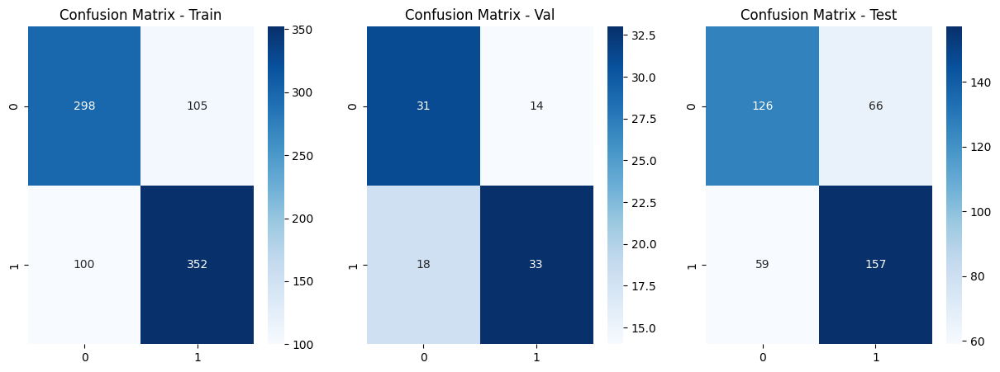

In [273]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_wine_test, y_wine_test)

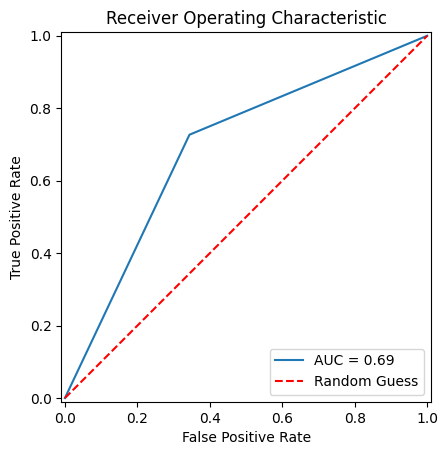

In [274]:
plot_roc_curve(y_wine_test, yhat_test)

## Cancer

In [275]:
pipe = Pipeline(
    steps=[("classifier", KNeighborsClassifier())]
)
search_space = {'classifier__n_neighbors' : np.arange(1,31,1)}
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [276]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

In [277]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_size[j], shuffle=True, stratify=y_cancer)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_cancer_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_cancer_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__n_neighbors'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)
    
results = pd.concat(results, ignore_index=True)

results

# result

,Train Size,classifier__n_neighbors,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,1,0.854701,0.891738,0.918911,0.895062
1,0.1,2,0.863248,0.891738,0.918911,0.895062
2,0.1,3,0.880342,0.891738,0.918911,0.895062
3,0.1,4,0.863248,0.891738,0.918911,0.895062
4,0.1,5,0.854701,0.891738,0.918911,0.895062
...,...,...,...,...,...,...
265,0.9,26,0.945059,0.988827,0.931944,0.962963
266,0.9,27,0.945993,0.988827,0.931944,0.962963
267,0.9,28,0.945993,0.988827,0.931944,0.962963
268,0.9,29,0.944125,0.988827,0.931944,0.962963


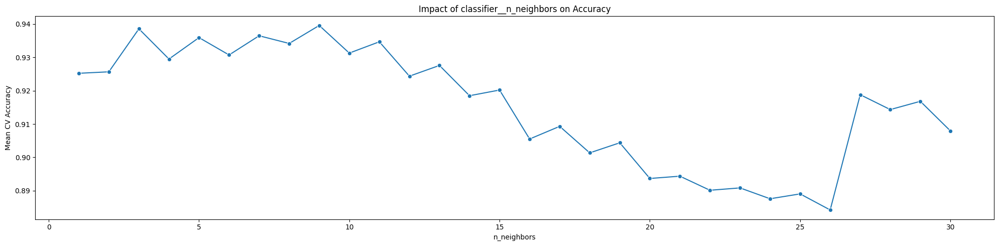

In [278]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

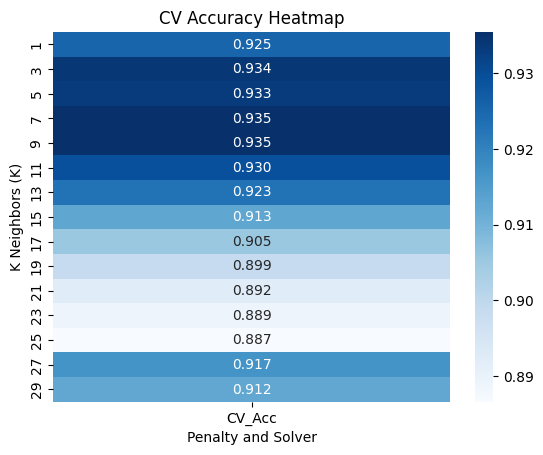

In [279]:
# Pivot table for heatmap
heatmap_data = results.pivot_table(
    values='CV_Acc', 
    index=pd.cut(results['classifier__n_neighbors'], bins=15),
    columns=None
)
heatmap_data.index = [f"{int(x.mid)}" for x in heatmap_data.index]
sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
plt.title('CV Accuracy Heatmap')
plt.xlabel('Penalty and Solver')
plt.ylabel('K Neighbors (K)')
plt.show()



### Learning Curve

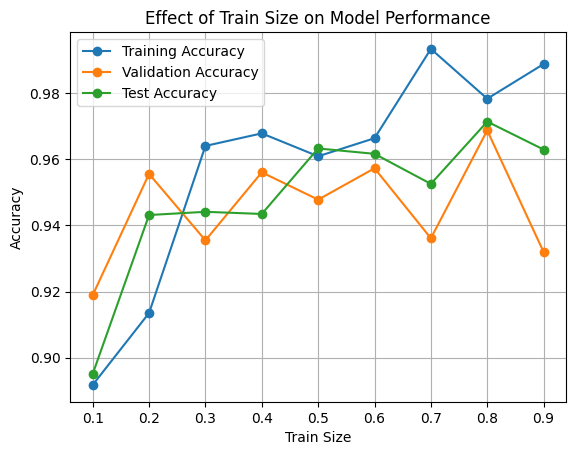

In [280]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [281]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__n_neighbors,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,9,0.888889,0.891738,0.918911,0.895062
1,0.2,9,0.911364,0.913502,0.955590,0.943145
2,0.3,3,0.946937,0.964052,0.935484,0.944120
3,0.4,5,0.953878,0.967855,0.956067,0.943470
4,0.5,18,0.943088,0.960916,0.947795,0.963288
5,0.6,5,0.953780,0.966387,0.957292,0.961663
6,0.7,1,0.968807,0.993405,0.936111,0.952567
7,0.8,9,0.960168,0.978337,0.968750,0.971410
8,0.9,9,0.963694,0.988827,0.931944,0.962963


### Train Size = 0.2,0.5,0.8

In [282]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__n_neighbors,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,9,0.911364,0.913502,0.955590,0.943145
1,0.5,18,0.943088,0.960916,0.947795,0.963288
2,0.8,9,0.960168,0.978337,0.968750,0.971410


Train Size: 0.2
training set accuracy (n=79): 0.975
val set accuracy (n=319): 0.962
test set accuracy(n=171): 0.977
              precision    recall  f1-score   support

           0       0.96      1.00      0.98        50
           1       1.00      0.93      0.96        29

    accuracy                           0.97        79
   macro avg       0.98      0.97      0.97        79
weighted avg       0.98      0.97      0.97        79

              precision    recall  f1-score   support

           0       0.96      0.98      0.97       200
           1       0.97      0.93      0.95       119

    accuracy                           0.96       319
   macro avg       0.96      0.96      0.96       319
weighted avg       0.96      0.96      0.96       319

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       107
           1       0.98      0.95      0.97        64

    accuracy                           0.98       171
   macro avg

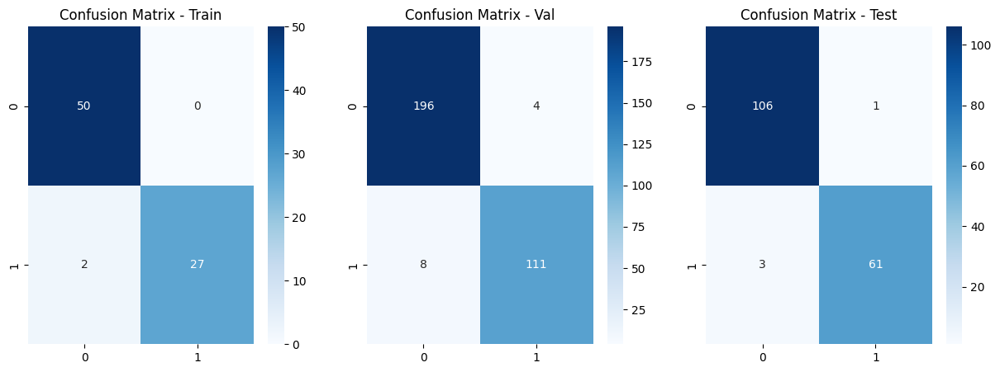

Train Size: 0.5
training set accuracy (n=199): 0.980
val set accuracy (n=199): 0.970
test set accuracy(n=171): 0.965
              precision    recall  f1-score   support

           0       0.98      0.99      0.98       125
           1       0.99      0.96      0.97        74

    accuracy                           0.98       199
   macro avg       0.98      0.98      0.98       199
weighted avg       0.98      0.98      0.98       199

              precision    recall  f1-score   support

           0       0.97      0.98      0.98       125
           1       0.97      0.95      0.96        74

    accuracy                           0.97       199
   macro avg       0.97      0.96      0.97       199
weighted avg       0.97      0.97      0.97       199

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       107
           1       0.95      0.95      0.95        64

    accuracy                           0.96       171
   macro av

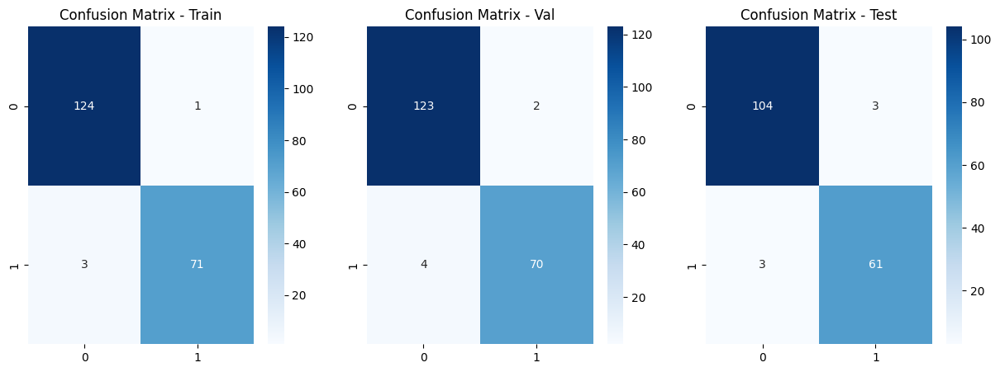

Train Size: 0.8
training set accuracy (n=318): 0.965
val set accuracy (n=80): 0.988
test set accuracy(n=171): 0.959
              precision    recall  f1-score   support

           0       0.96      0.99      0.97       200
           1       0.98      0.92      0.95       118

    accuracy                           0.97       318
   macro avg       0.97      0.96      0.96       318
weighted avg       0.97      0.97      0.97       318

              precision    recall  f1-score   support

           0       0.98      1.00      0.99        50
           1       1.00      0.97      0.98        30

    accuracy                           0.99        80
   macro avg       0.99      0.98      0.99        80
weighted avg       0.99      0.99      0.99        80

              precision    recall  f1-score   support

           0       0.96      0.97      0.97       107
           1       0.95      0.94      0.94        64

    accuracy                           0.96       171
   macro avg

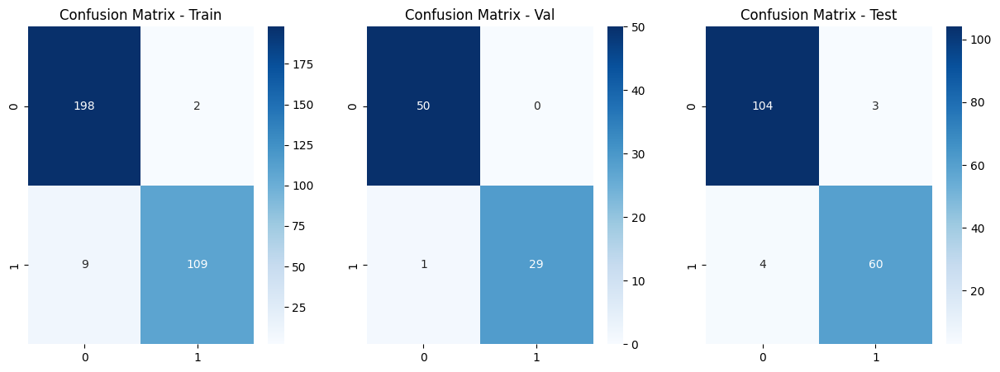

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,KNN,0.2,0.913502,0.955590,0.943145
0,KNN,0.5,0.960916,0.947795,0.963288
0,KNN,0.8,0.978337,0.968750,0.971410


In [283]:
train_sets = [0.2,0.5,0.8]
knn_results_cancer = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]

    best_pipe= Pipeline(
        steps=[
            ("classifier", KNeighborsClassifier(
                **{key.split("__")[1]: value for key, value in b[['classifier__n_neighbors']].items()}
            ))
        ]
    )


    
    X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_cancer)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_cancer_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_cancer_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_cancer_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_cancer_test, y_cancer_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_cancer_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['KNN'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # knn_results_cancer = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    knn_results_cancer= pd.concat([knn_results_cancer, result], axis=0)

knn_results_cancer

### Best Model + Train size

In [284]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.8


In [285]:
# Eyeballing
best_ratio = best_ratio

In [286]:
best_pipe= Pipeline(
    steps=[
            ("classifier", KNeighborsClassifier(
                **{key.split("__")[1]: int(value) for key, value in best.iloc[best_ratio][['classifier__n_neighbors']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_cancer)

best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"KNN_cancer.joblib")
X_train.shape,X_val.shape

((318, 30), (80, 30))

In [287]:
best_model = joblib.load(f"KNN_cancer.joblib")

In [288]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_cancer_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_cancer_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_cancer_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=318): 0.975
val set accuracy (n=80): 0.988
test set accuracy(n=171): 0.982


Best model train_size: 0.8
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       200
           1       0.99      0.94      0.97       118

    accuracy                           0.97       318
   macro avg       0.98      0.97      0.97       318
weighted avg       0.98      0.97      0.97       318

              precision    recall  f1-score   support

           0       0.98      1.00      0.99        50
           1       1.00      0.97      0.98        30

    accuracy                           0.99        80
   macro avg       0.99      0.98      0.99        80
weighted avg       0.99      0.99      0.99        80

              precision    recall  f1-score   support

           0       0.97      1.00      0.99       107
           1       1.00      0.95      0.98        64

    accuracy                           0.98       171
   macro avg       0.99      0.98      0.98       171
weighted avg       0.98      0.98      0.98    

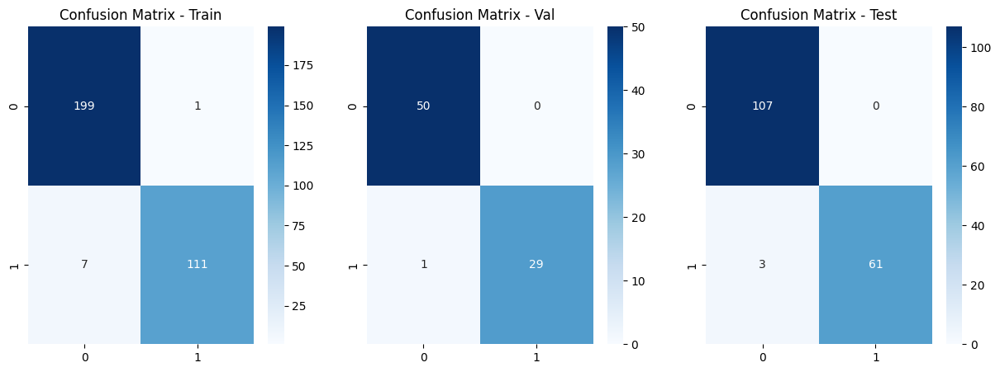

In [289]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_cancer_test, y_cancer_test)

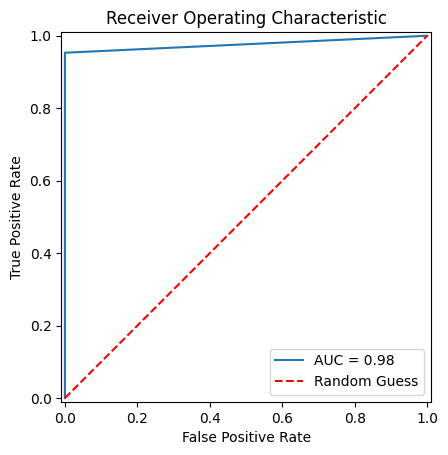

In [290]:
plot_roc_curve(y_cancer_test, yhat_test)

## Bank

In [291]:
pipe = Pipeline(
    steps=[("classifier", KNeighborsClassifier())]
)
search_space = {'classifier__n_neighbors' : np.arange(1,31,1)}
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [292]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

In [293]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_size[j], shuffle=True, stratify=y_bank)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_bank_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_bank_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__n_neighbors'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)
    
results = pd.concat(results, ignore_index=True)

results

# result

,Train Size,classifier__n_neighbors,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,1,0.871892,0.901636,0.891343,0.891654
1,0.1,2,0.885798,0.901636,0.891343,0.891654
2,0.1,3,0.890223,0.901636,0.891343,0.891654
3,0.1,4,0.889485,0.901636,0.891343,0.891654
4,0.1,5,0.892119,0.901636,0.891343,0.891654
...,...,...,...,...,...,...
265,0.9,26,0.896133,0.907776,0.898087,0.897834
266,0.9,27,0.897034,0.907776,0.898087,0.897834
267,0.9,28,0.896122,0.907776,0.898087,0.897834
268,0.9,29,0.896871,0.907776,0.898087,0.897834


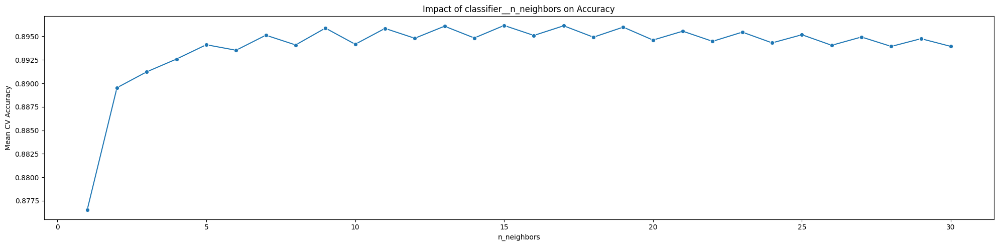

In [294]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

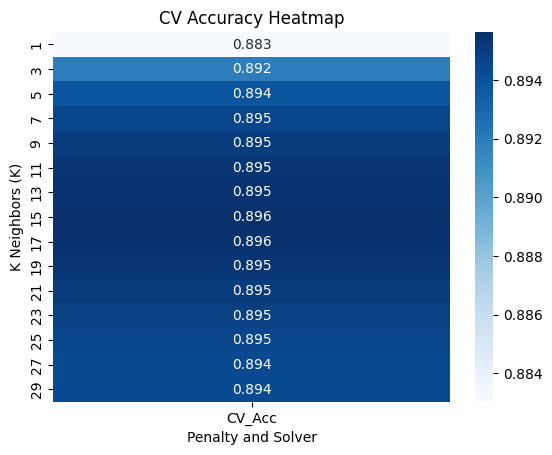

In [295]:
# Pivot table for heatmap
heatmap_data = results.pivot_table(
    values='CV_Acc', 
    index=pd.cut(results['classifier__n_neighbors'], bins=15),
    columns=None
)
heatmap_data.index = [f"{int(x.mid)}" for x in heatmap_data.index]
sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
plt.title('CV Accuracy Heatmap')
plt.xlabel('Penalty and Solver')
plt.ylabel('K Neighbors (K)')
plt.show()



### Learning Curve

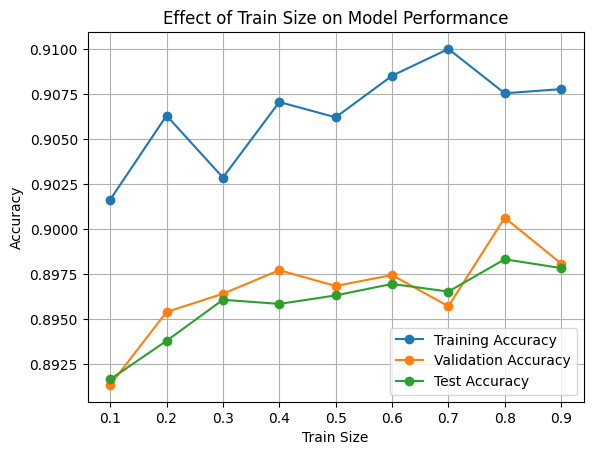

In [296]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [297]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__n_neighbors,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,17,0.892541,0.901636,0.891343,0.891654
1,0.2,9,0.895350,0.906304,0.895395,0.893792
2,0.3,23,0.896215,0.902863,0.896407,0.896073
3,0.4,15,0.896113,0.907059,0.897716,0.895844
4,0.5,9,0.896691,0.906209,0.896837,0.896315
5,0.6,11,0.898058,0.908515,0.897447,0.896954
6,0.7,13,0.898685,0.910008,0.895711,0.896528
7,0.8,15,0.897052,0.907543,0.900632,0.898322
8,0.9,17,0.898181,0.907776,0.898087,0.897834


### Train Size = 0.2,0.5,0.8

In [298]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__n_neighbors,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,9,0.895350,0.906304,0.895395,0.893792
1,0.5,9,0.896691,0.906209,0.896837,0.896315
2,0.8,15,0.897052,0.907543,0.900632,0.898322


Train Size: 0.2
training set accuracy (n=6329): 0.899
val set accuracy (n=25318): 0.894
test set accuracy(n=13564): 0.893
              precision    recall  f1-score   support

           0       0.91      0.99      0.95      5589
           1       0.70      0.24      0.35       740

    accuracy                           0.90      6329
   macro avg       0.80      0.61      0.65      6329
weighted avg       0.88      0.90      0.88      6329

              precision    recall  f1-score   support

           0       0.90      0.99      0.94     22356
           1       0.67      0.18      0.29      2962

    accuracy                           0.89     25318
   macro avg       0.78      0.59      0.61     25318
weighted avg       0.87      0.89      0.87     25318

              precision    recall  f1-score   support

           0       0.90      0.99      0.94     11977
           1       0.65      0.18      0.28      1587

    accuracy                           0.89     13564
   mac

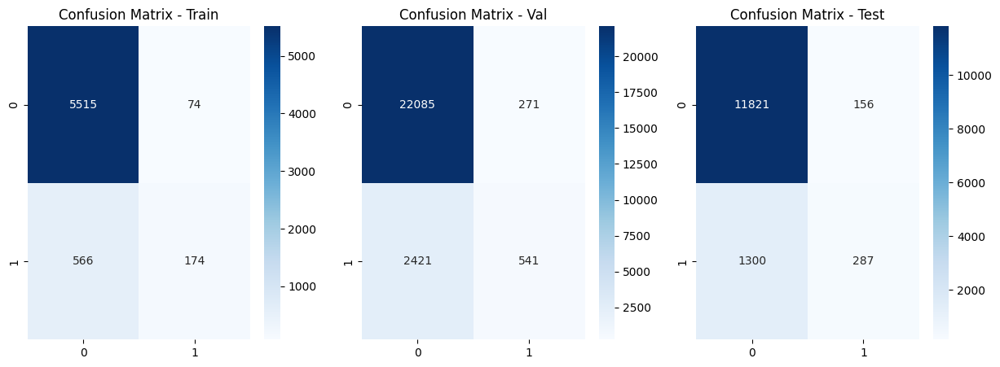

Train Size: 0.5
training set accuracy (n=15823): 0.905
val set accuracy (n=15824): 0.897
test set accuracy(n=13564): 0.896
              precision    recall  f1-score   support

           0       0.91      0.99      0.95     13972
           1       0.73      0.30      0.42      1851

    accuracy                           0.90     15823
   macro avg       0.82      0.64      0.68     15823
weighted avg       0.89      0.90      0.89     15823

              precision    recall  f1-score   support

           0       0.91      0.98      0.94     13973
           1       0.66      0.24      0.36      1851

    accuracy                           0.90     15824
   macro avg       0.78      0.61      0.65     15824
weighted avg       0.88      0.90      0.88     15824

              precision    recall  f1-score   support

           0       0.91      0.98      0.94     11977
           1       0.65      0.24      0.35      1587

    accuracy                           0.90     13564
   ma

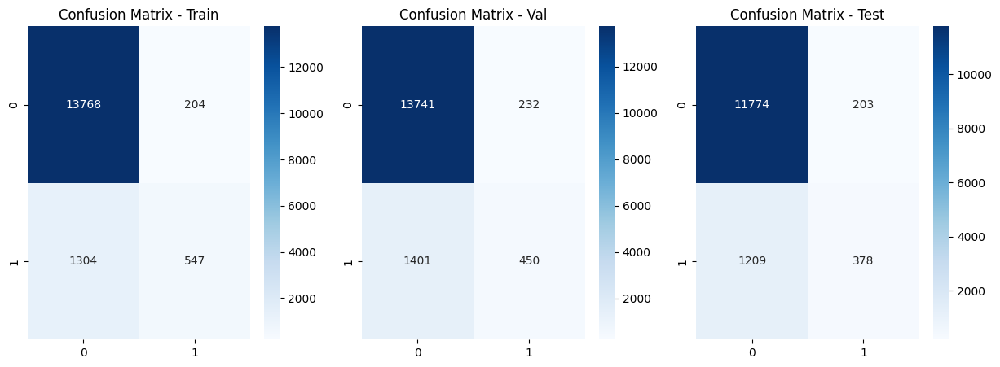

Train Size: 0.8
training set accuracy (n=25317): 0.906
val set accuracy (n=6330): 0.898
test set accuracy(n=13564): 0.897
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     22355
           1       0.72      0.31      0.44      2962

    accuracy                           0.91     25317
   macro avg       0.82      0.65      0.69     25317
weighted avg       0.89      0.91      0.89     25317

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      5590
           1       0.65      0.27      0.38       740

    accuracy                           0.90      6330
   macro avg       0.78      0.63      0.66      6330
weighted avg       0.88      0.90      0.88      6330

              precision    recall  f1-score   support

           0       0.91      0.98      0.94     11977
           1       0.66      0.26      0.37      1587

    accuracy                           0.90     13564
   mac

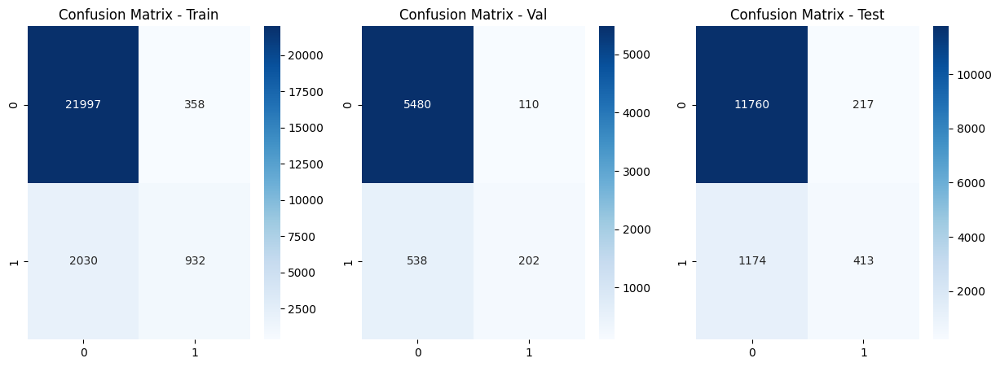

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,KNN,0.2,0.906304,0.895395,0.893792
0,KNN,0.5,0.906209,0.896837,0.896315
0,KNN,0.8,0.907543,0.900632,0.898322


In [299]:
train_sets = [0.2,0.5,0.8]
knn_results_bank = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]

    best_pipe= Pipeline(
        steps=[
            ("classifier", KNeighborsClassifier(
                **{key.split("__")[1]: value for key, value in b[['classifier__n_neighbors']].items()}
            ))
        ]
    )


    
    X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_bank)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_bank_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_bank_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_bank_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_bank_test, y_bank_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_bank_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['KNN'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # knn_results_bank = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    knn_results_bank= pd.concat([knn_results_bank, result], axis=0)

knn_results_bank

### Best Model + Train size

In [300]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.8


In [301]:
# Eyeballing
best_ratio = best_ratio

In [302]:
best_pipe= Pipeline(
    steps=[
            ("classifier", KNeighborsClassifier(
                **{key.split("__")[1]: int(value) for key, value in best.iloc[best_ratio][['classifier__n_neighbors']].items()}
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_bank)

best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"KNN_bank.joblib")
X_train.shape,X_val.shape

((25317, 51), (6330, 51))

In [303]:
best_model = joblib.load(f"KNN_bank.joblib")

In [304]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_bank_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_bank_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_bank_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=25317): 0.908
val set accuracy (n=6330): 0.898
test set accuracy(n=13564): 0.898


Best model train_size: 0.8
              precision    recall  f1-score   support

           0       0.92      0.98      0.95     22355
           1       0.73      0.33      0.46      2962

    accuracy                           0.91     25317
   macro avg       0.83      0.66      0.70     25317
weighted avg       0.90      0.91      0.89     25317

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      5590
           1       0.64      0.29      0.40       740

    accuracy                           0.90      6330
   macro avg       0.77      0.63      0.67      6330
weighted avg       0.88      0.90      0.88      6330

              precision    recall  f1-score   support

           0       0.91      0.98      0.94     11977
           1       0.65      0.28      0.39      1587

    accuracy                           0.90     13564
   macro avg       0.78      0.63      0.67     13564
weighted avg       0.88      0.90      0.88    

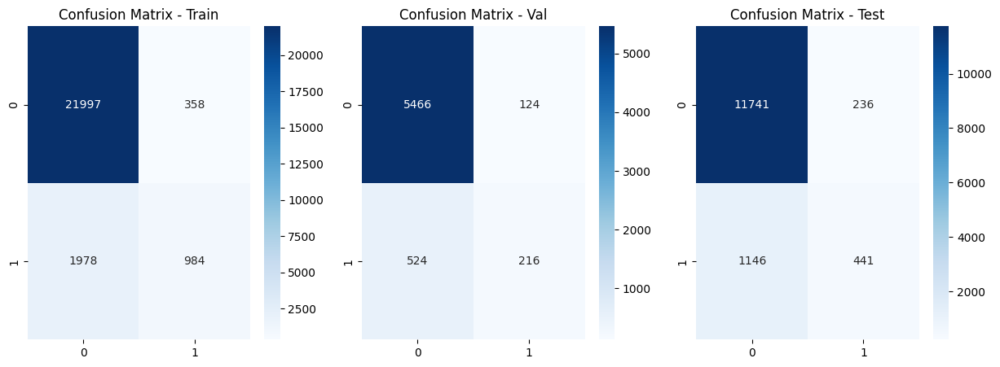

In [305]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_bank_test, y_bank_test)

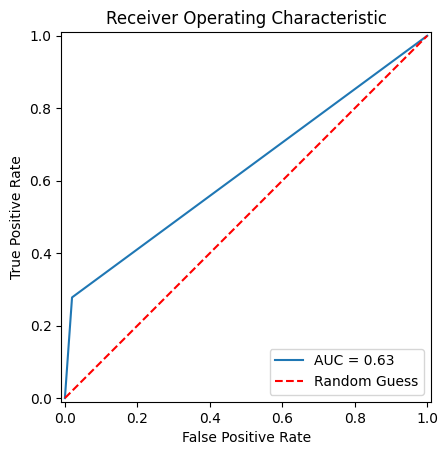

In [306]:
plot_roc_curve(y_bank_test, yhat_test)

# SVM

## Iris

In [307]:
pipe = Pipeline(steps=[
                 ("classifier", SVC(class_weight = 'balanced', max_iter=1000))]
)

search_space = [{'classifier__kernel': ['linear'],
                'classifier__C': np.logspace(-4, 1, 6)},
                {'classifier__kernel':['rbf'],
                'classifier__C': np.logspace(-4,1,6),
                'classifier__gamma': np.logspace(-4, 1, 6)},
                {'classifier__kernel': ['poly'],
                 'classifier__gamma': np.logspace(-4, 1, 6),
                 'classifier__degree': range(2,4),
                 'classifier__C': np.logspace(-4, 1, 6)}]
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [308]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [309]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_size[j], shuffle=True, stratify=y_iris)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_iris_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_iris_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__kernel','classifier__gamma','classifier__degree','classifier__C'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)
    
results = pd.concat(results, ignore_index=True)

results



,Train Size,classifier__kernel,classifier__gamma,classifier__degree,classifier__C,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,poly,0.0001,2.0,0.0001,0.638889,0.988889,0.954106,0.898765
1,0.1,poly,0.0001,2.0,0.0010,0.416667,0.988889,0.954106,0.898765
2,0.1,poly,0.0001,2.0,0.0100,0.416667,0.988889,0.954106,0.898765
3,0.1,poly,0.0001,2.0,0.1000,0.564815,0.988889,0.954106,0.898765
4,0.1,poly,0.0001,2.0,1.0000,0.416667,0.988889,0.954106,0.898765
...,...,...,...,...,...,...,...,...,...
643,0.9,poly,10.0000,3.0,0.0010,0.937993,0.971306,0.909091,0.969136
644,0.9,poly,10.0000,3.0,0.0100,0.926523,0.971306,0.909091,0.969136
645,0.9,poly,10.0000,3.0,0.1000,0.922820,0.971306,0.909091,0.969136
646,0.9,poly,10.0000,3.0,1.0000,0.922820,0.971306,0.909091,0.969136


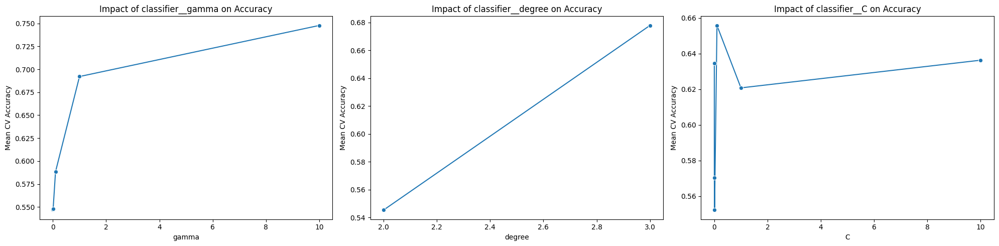

In [310]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
param_columns = param_columns[1:]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

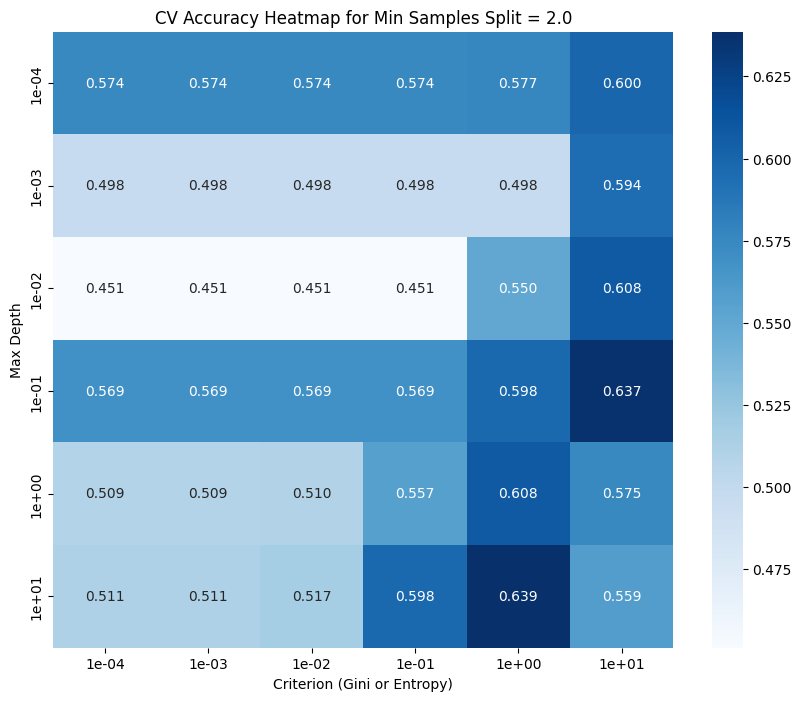

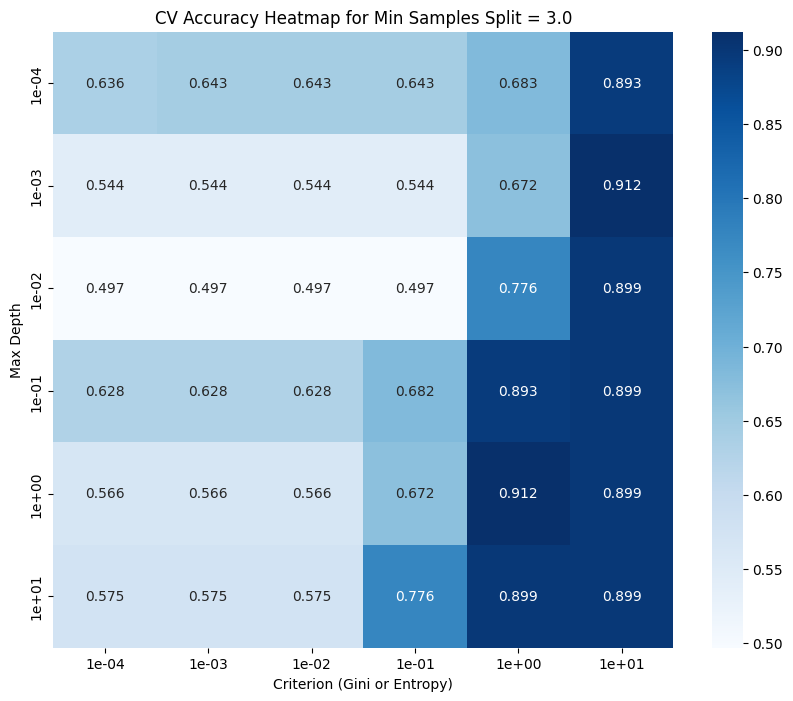

In [311]:
unique_splits = results['classifier__degree'].unique()
for min_split in sorted(unique_splits):
    heatmap_data = results[results['classifier__degree'] == min_split].pivot_table(
        values='CV_Acc',
        index='classifier__C',
        columns='classifier__gamma'
    )

    plt.figure(figsize=(10, 8))
    heatmap_data.index = [f"{x:.0e}" for x in heatmap_data.index]
    heatmap_data.columns = [f"{x:.0e}" for x in heatmap_data.columns]
    sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
    plt.title(f'CV Accuracy Heatmap for Min Samples Split = {min_split}')
    plt.xlabel('Criterion (Gini or Entropy)')
    plt.ylabel('Max Depth')
    plt.show()


### Learning Curve

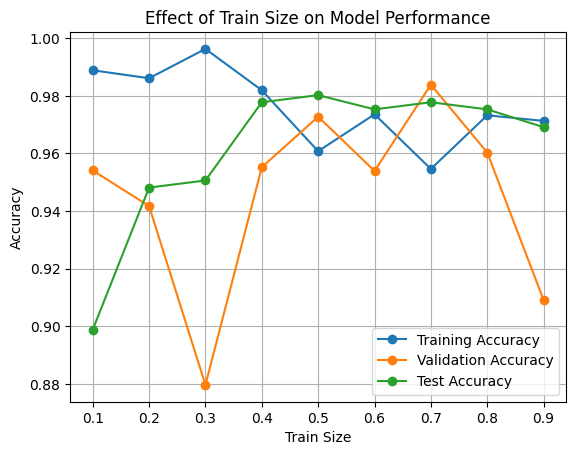

In [312]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [313]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__kernel,classifier__gamma,classifier__degree,classifier__C,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,poly,1.0,3.0,1.0,0.833333,0.988889,0.954106,0.898765
1,0.2,poly,1.0,3.0,1.0,0.933862,0.986111,0.941734,0.948148
2,0.3,poly,1.0,3.0,0.1,0.877778,0.996296,0.879630,0.950617
3,0.4,poly,1.0,3.0,1.0,0.951160,0.981944,0.955197,0.977778
4,0.5,poly,1.0,3.0,1.0,0.901961,0.960784,0.972767,0.980247
5,0.6,poly,1.0,3.0,0.1,0.939947,0.973588,0.953930,0.975309
6,0.7,poly,1.0,3.0,0.1,0.925322,0.954617,0.983871,0.977778
7,0.8,poly,1.0,3.0,0.1,0.938272,0.973251,0.960317,0.975309
8,0.9,poly,1.0,3.0,1.0,0.937993,0.971306,0.909091,0.969136


### Train Size = 0.2,0.5,0.8

In [314]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__kernel,classifier__gamma,classifier__degree,classifier__C,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,poly,1.0,3.0,1.0,0.933862,0.986111,0.941734,0.948148
1,0.5,poly,1.0,3.0,1.0,0.901961,0.960784,0.972767,0.980247
2,0.8,poly,1.0,3.0,0.1,0.938272,0.973251,0.960317,0.975309


Train Size: 0.2
training set accuracy (n=20): 0.950
val set accuracy (n=82): 0.951
test set accuracy(n=45): 0.889
              precision    recall  f1-score   support

           0       1.00      0.92      0.96        13
           1       0.88      1.00      0.93         7

    accuracy                           0.95        20
   macro avg       0.94      0.96      0.95        20
weighted avg       0.96      0.95      0.95        20

              precision    recall  f1-score   support

           0       1.00      0.93      0.96        55
           1       0.87      1.00      0.93        27

    accuracy                           0.95        82
   macro avg       0.94      0.96      0.95        82
weighted avg       0.96      0.95      0.95        82

              precision    recall  f1-score   support

           0       0.93      0.90      0.92        30
           1       0.81      0.87      0.84        15

    accuracy                           0.89        45
   macro avg  

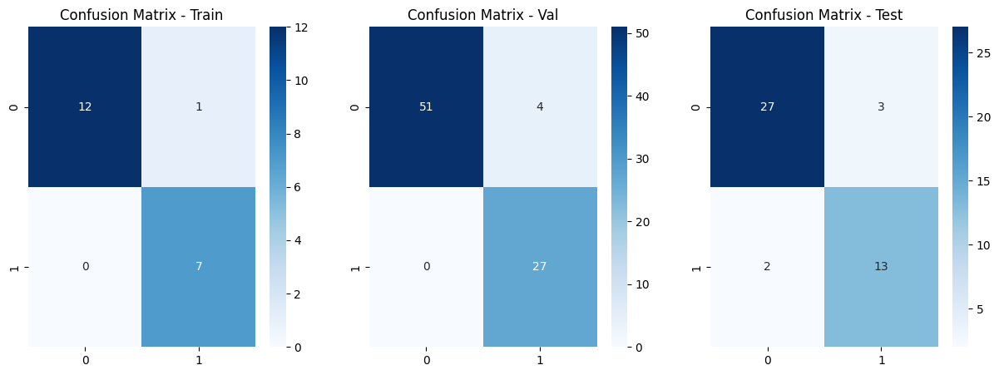

Train Size: 0.5
training set accuracy (n=51): 0.961
val set accuracy (n=51): 1.000
test set accuracy(n=45): 0.956
              precision    recall  f1-score   support

           0       0.97      0.97      0.97        34
           1       0.94      0.94      0.94        17

    accuracy                           0.96        51
   macro avg       0.96      0.96      0.96        51
weighted avg       0.96      0.96      0.96        51

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        34
           1       1.00      1.00      1.00        17

    accuracy                           1.00        51
   macro avg       1.00      1.00      1.00        51
weighted avg       1.00      1.00      1.00        51

              precision    recall  f1-score   support

           0       0.94      1.00      0.97        30
           1       1.00      0.87      0.93        15

    accuracy                           0.96        45
   macro avg  

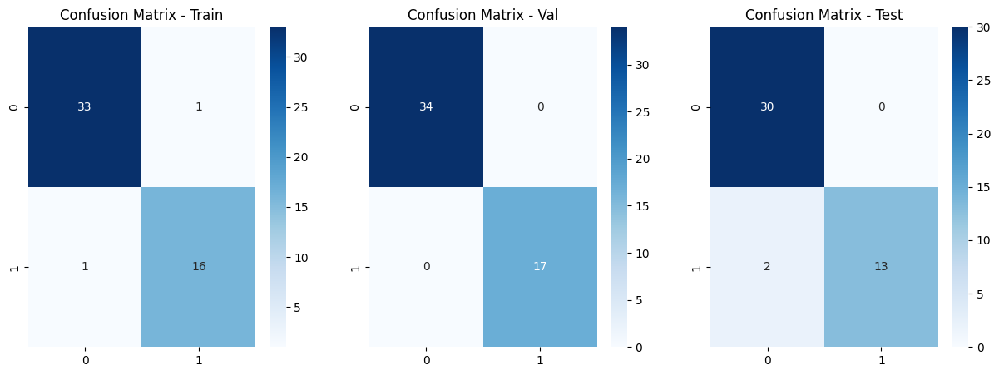

Train Size: 0.8
training set accuracy (n=81): 0.988
val set accuracy (n=21): 0.952
test set accuracy(n=45): 0.956
              precision    recall  f1-score   support

           0       0.98      1.00      0.99        54
           1       1.00      0.96      0.98        27

    accuracy                           0.99        81
   macro avg       0.99      0.98      0.99        81
weighted avg       0.99      0.99      0.99        81

              precision    recall  f1-score   support

           0       0.93      1.00      0.97        14
           1       1.00      0.86      0.92         7

    accuracy                           0.95        21
   macro avg       0.97      0.93      0.94        21
weighted avg       0.96      0.95      0.95        21

              precision    recall  f1-score   support

           0       0.94      1.00      0.97        30
           1       1.00      0.87      0.93        15

    accuracy                           0.96        45
   macro avg  

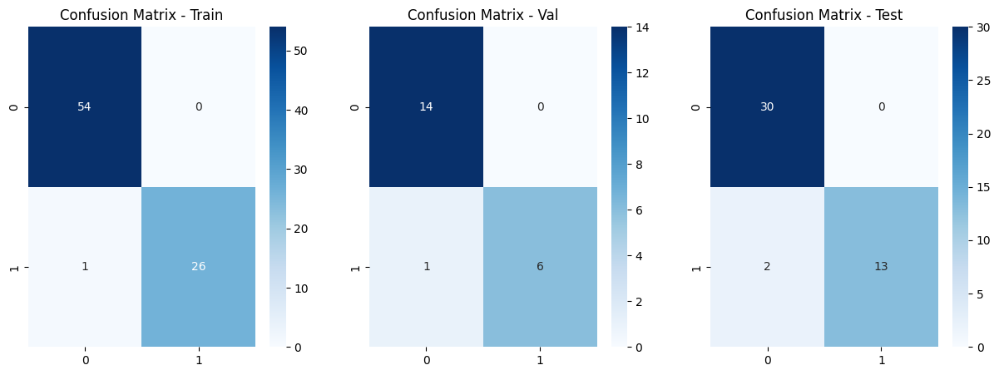

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,SVM,0.2,0.986111,0.941734,0.948148
0,SVM,0.5,0.960784,0.972767,0.980247
0,SVM,0.8,0.973251,0.960317,0.975309


In [315]:
train_sets = [0.2,0.5,0.8]
svm_results_iris = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]

    best_model = Pipeline(
        steps=[
                ("classifier", SVC(
                    class_weight='balanced', 
                    max_iter=1000,
                    **{
                        key.split("__")[1]: (int(value) if key.split("__")[1] == 'degree' else value)
                        for key, value in b[['classifier__kernel', 'classifier__gamma', 'classifier__degree', 'classifier__C']].items()
                    }
                    )
                )
            ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_iris)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_iris_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_iris_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_iris_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_iris_test, y_iris_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_iris_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['SVM'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_iris = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    svm_results_iris= pd.concat([svm_results_iris, result], axis=0)

svm_results_iris

### Best Model + Train size

In [316]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.7


In [317]:
# Eyeballing
best_ratio = best_ratio

In [318]:
best_pipe= Pipeline(
        steps=[
            ("classifier", SVC(
                class_weight='balanced', 
                max_iter=1000,
                **{
                        key.split("__")[1]: (int(value) if key.split("__")[1] == 'degree' else value)
                        for key, value in best.iloc[best_ratio][['classifier__kernel', 'classifier__gamma', 'classifier__degree','classifier__C']].items()
                    }
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_iris, y_iris, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_iris)

best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"SVM_iris.joblib")
X_train.shape,X_val.shape

((71, 4), (31, 4))

In [319]:
best_model = joblib.load(f"SVM_iris.joblib")

In [320]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_iris_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_iris_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_iris_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=71): 0.972
val set accuracy (n=31): 0.968
test set accuracy(n=45): 0.933


Best model train_size: 0.7
              precision    recall  f1-score   support

           0       0.98      0.98      0.98        47
           1       0.96      0.96      0.96        24

    accuracy                           0.97        71
   macro avg       0.97      0.97      0.97        71
weighted avg       0.97      0.97      0.97        71

              precision    recall  f1-score   support

           0       0.95      1.00      0.98        21
           1       1.00      0.90      0.95        10

    accuracy                           0.97        31
   macro avg       0.98      0.95      0.96        31
weighted avg       0.97      0.97      0.97        31

              precision    recall  f1-score   support

           0       0.94      0.97      0.95        30
           1       0.93      0.87      0.90        15

    accuracy                           0.93        45
   macro avg       0.93      0.92      0.92        45
weighted avg       0.93      0.93      0.93    

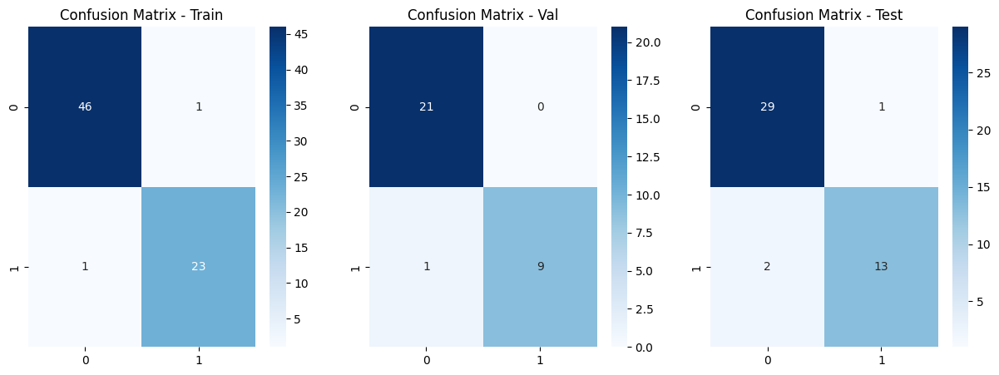

In [321]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_iris_test, y_iris_test)

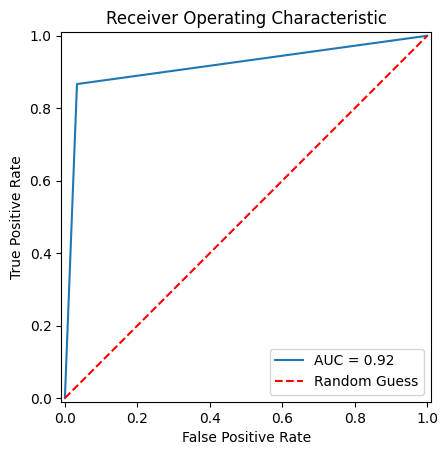

In [322]:
plot_roc_curve(y_iris_test, yhat_test)

## Wine

In [323]:
pipe = Pipeline(steps=[
                 ("classifier", SVC(class_weight = 'balanced', max_iter=1000))]
)

search_space = [{'classifier__kernel': ['linear'],
                'classifier__C': np.logspace(-4, 1, 6)},
                {'classifier__kernel':['rbf'],
                'classifier__C': np.logspace(-4,1,6),
                'classifier__gamma': np.logspace(-4, 1, 6)},
                {'classifier__kernel': ['poly'],
                 'classifier__gamma': np.logspace(-4, 1, 6),
                 'classifier__degree': range(2,4),
                 'classifier__C': np.logspace(-4, 1, 6)}]
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [324]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [325]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_size[j], shuffle=True, stratify=y_wine)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_wine_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_wine_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__kernel','classifier__gamma','classifier__degree','classifier__C'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)
    
results = pd.concat(results, ignore_index=True)

results



,Train Size,classifier__kernel,classifier__gamma,classifier__degree,classifier__C,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,poly,0.0001,2.0,0.0001,0.526210,0.864912,0.704374,0.665577
1,0.1,poly,0.0001,2.0,0.0010,0.473790,0.864912,0.704374,0.665577
2,0.1,poly,0.0001,2.0,0.0100,0.526210,0.864912,0.704374,0.665577
3,0.1,poly,0.0001,2.0,0.1000,0.473790,0.864912,0.704374,0.665577
4,0.1,poly,0.0001,2.0,1.0000,0.515793,0.864912,0.704374,0.665577
...,...,...,...,...,...,...,...,...,...
643,0.9,poly,10.0000,3.0,0.0010,0.606628,0.789604,0.740162,0.711465
644,0.9,poly,10.0000,3.0,0.0100,0.606628,0.789604,0.740162,0.711465
645,0.9,poly,10.0000,3.0,0.1000,0.606628,0.789604,0.740162,0.711465
646,0.9,poly,10.0000,3.0,1.0000,0.606628,0.789604,0.740162,0.711465


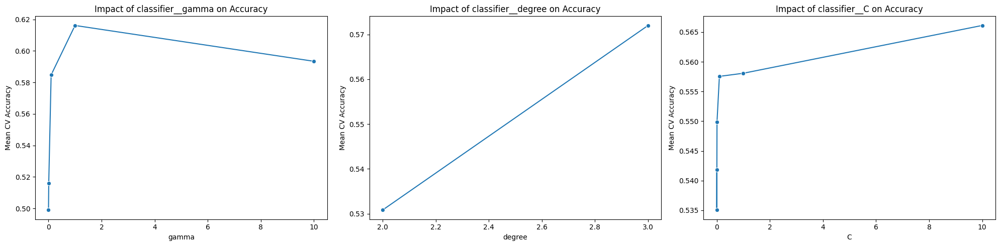

In [326]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
param_columns = param_columns[1:]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

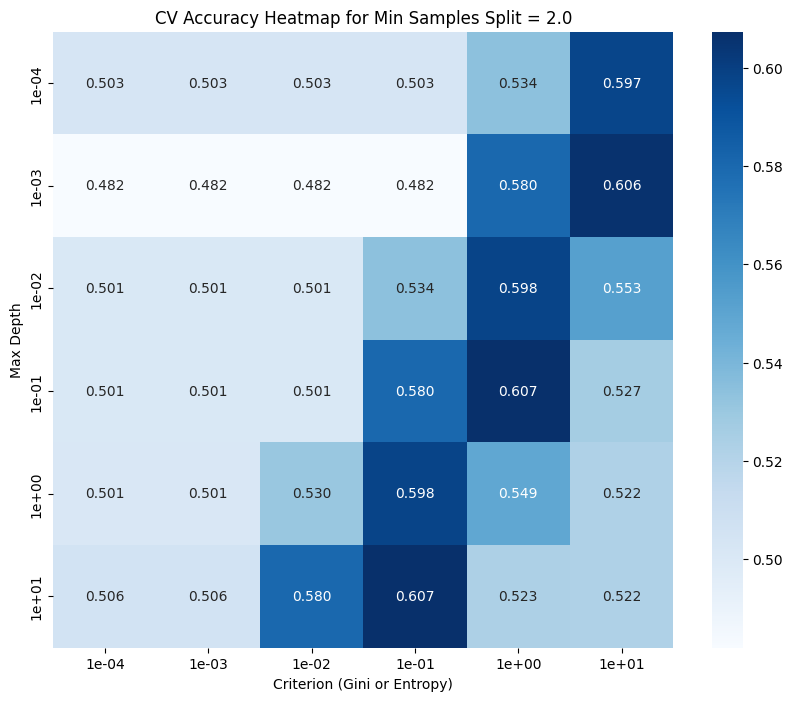

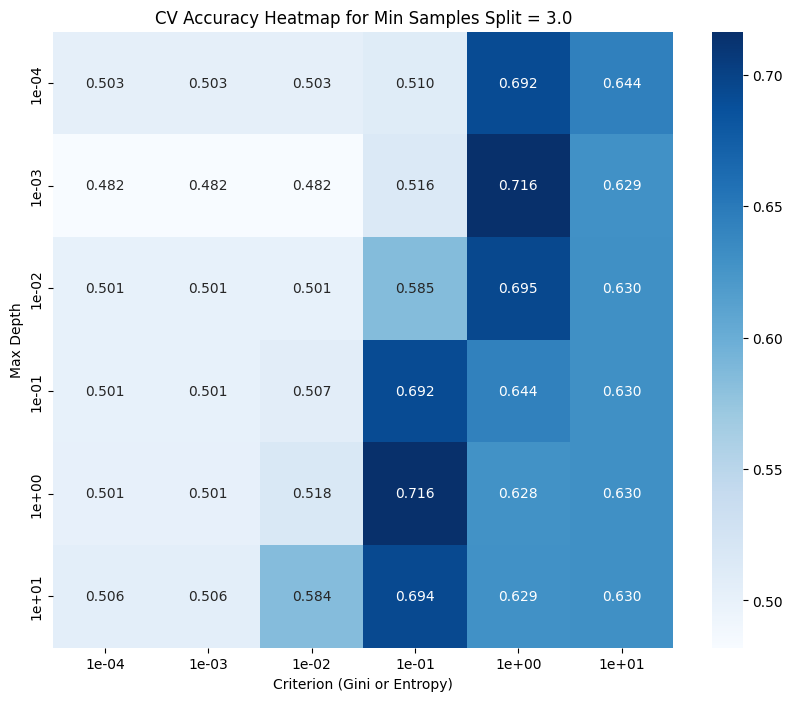

In [327]:
unique_splits = results['classifier__degree'].unique()
for min_split in sorted(unique_splits):
    heatmap_data = results[results['classifier__degree'] == min_split].pivot_table(
        values='CV_Acc',
        index='classifier__C',
        columns='classifier__gamma'
    )

    plt.figure(figsize=(10, 8))
    heatmap_data.index = [f"{x:.0e}" for x in heatmap_data.index]
    heatmap_data.columns = [f"{x:.0e}" for x in heatmap_data.columns]
    sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
    plt.title(f'CV Accuracy Heatmap for Min Samples Split = {min_split}')
    plt.xlabel('Criterion (Gini or Entropy)')
    plt.ylabel('Max Depth')
    plt.show()


### Learning Curve

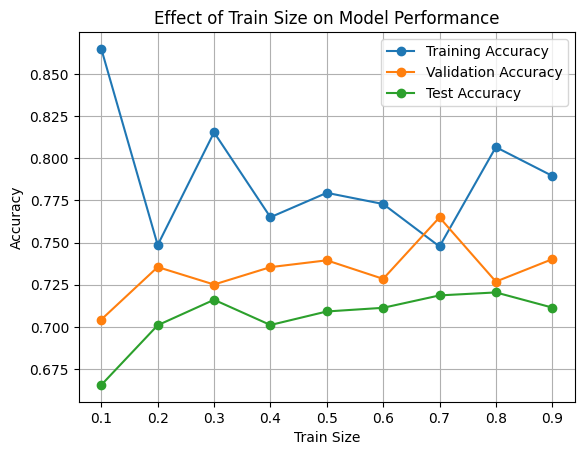

In [328]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [329]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__kernel,classifier__gamma,classifier__degree,classifier__C,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,poly,0.1,3.0,1.0,0.701165,0.864912,0.704374,0.665577
1,0.2,poly,0.1,3.0,1.0,0.682264,0.748538,0.735509,0.700980
2,0.3,poly,0.1,3.0,1.0,0.721637,0.815400,0.725142,0.716095
3,0.4,poly,0.1,3.0,1.0,0.719257,0.765058,0.735454,0.701117
4,0.5,poly,0.1,3.0,1.0,0.706649,0.779532,0.739496,0.709150
5,0.6,poly,0.1,3.0,1.0,0.728070,0.772904,0.728492,0.711329
6,0.7,poly,0.1,3.0,1.0,0.718295,0.747703,0.764957,0.718682
7,0.8,poly,0.1,3.0,1.0,0.737280,0.806652,0.726876,0.720452
8,0.9,poly,0.1,3.0,1.0,0.732943,0.789604,0.740162,0.711465


### Train Size = 0.2,0.5,0.8

In [330]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__kernel,classifier__gamma,classifier__degree,classifier__C,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,poly,0.1,3.0,1.0,0.682264,0.748538,0.735509,0.700980
1,0.5,poly,0.1,3.0,1.0,0.706649,0.779532,0.739496,0.709150
2,0.8,poly,0.1,3.0,1.0,0.737280,0.806652,0.726876,0.720452


Train Size: 0.2
training set accuracy (n=190): 0.784
val set accuracy (n=761): 0.728
test set accuracy(n=408): 0.674
              precision    recall  f1-score   support

           0       0.70      0.94      0.81        90
           1       0.93      0.64      0.76       100

    accuracy                           0.78       190
   macro avg       0.82      0.79      0.78       190
weighted avg       0.82      0.78      0.78       190

              precision    recall  f1-score   support

           0       0.66      0.86      0.75       358
           1       0.83      0.61      0.70       403

    accuracy                           0.73       761
   macro avg       0.75      0.74      0.73       761
weighted avg       0.75      0.73      0.72       761

              precision    recall  f1-score   support

           0       0.62      0.81      0.70       192
           1       0.76      0.56      0.64       216

    accuracy                           0.67       408
   macro av

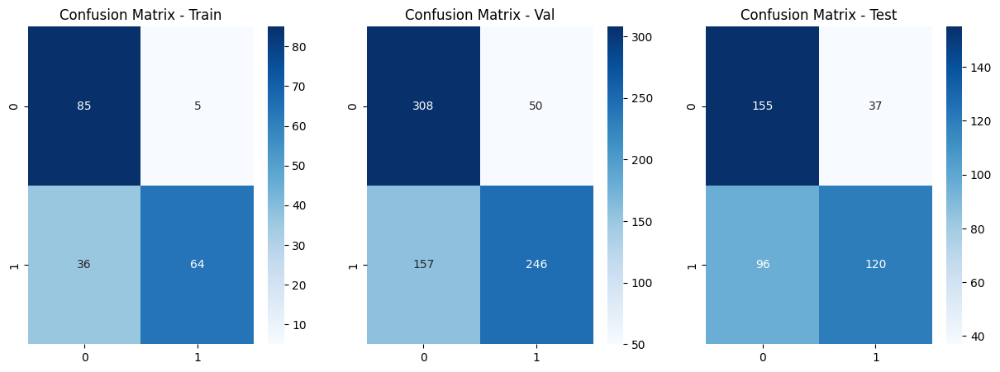

Train Size: 0.5
training set accuracy (n=475): 0.825
val set accuracy (n=476): 0.727
test set accuracy(n=408): 0.703
              precision    recall  f1-score   support

           0       0.78      0.88      0.83       224
           1       0.88      0.77      0.82       251

    accuracy                           0.83       475
   macro avg       0.83      0.83      0.83       475
weighted avg       0.83      0.83      0.83       475

              precision    recall  f1-score   support

           0       0.69      0.78      0.73       224
           1       0.77      0.68      0.73       252

    accuracy                           0.73       476
   macro avg       0.73      0.73      0.73       476
weighted avg       0.73      0.73      0.73       476

              precision    recall  f1-score   support

           0       0.67      0.74      0.70       192
           1       0.74      0.67      0.71       216

    accuracy                           0.70       408
   macro av

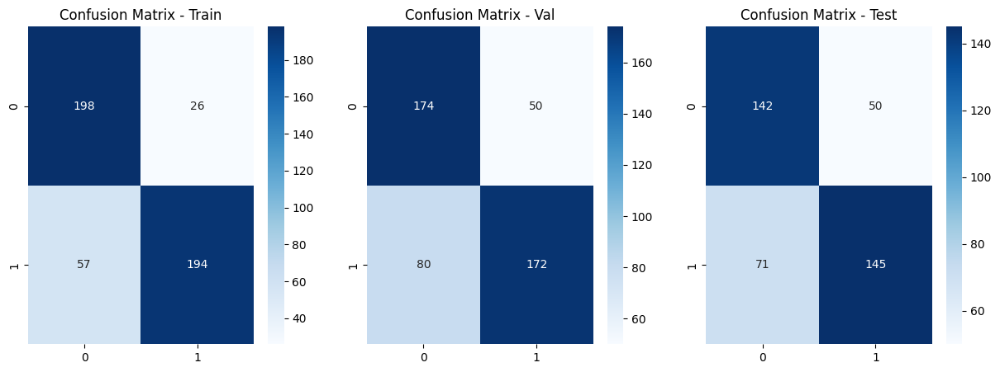

Train Size: 0.8
training set accuracy (n=760): 0.791
val set accuracy (n=191): 0.733
test set accuracy(n=408): 0.708
              precision    recall  f1-score   support

           0       0.74      0.86      0.79       358
           1       0.85      0.73      0.79       402

    accuracy                           0.79       760
   macro avg       0.80      0.79      0.79       760
weighted avg       0.80      0.79      0.79       760

              precision    recall  f1-score   support

           0       0.69      0.78      0.73        90
           1       0.78      0.69      0.73       101

    accuracy                           0.73       191
   macro avg       0.74      0.74      0.73       191
weighted avg       0.74      0.73      0.73       191

              precision    recall  f1-score   support

           0       0.67      0.77      0.71       192
           1       0.76      0.66      0.70       216

    accuracy                           0.71       408
   macro av

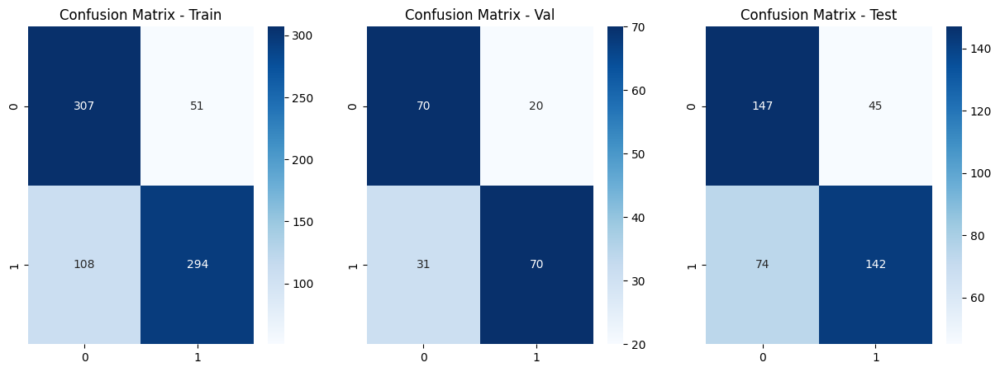

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,SVM,0.2,0.748538,0.735509,0.700980
0,SVM,0.5,0.779532,0.739496,0.709150
0,SVM,0.8,0.806652,0.726876,0.720452


In [331]:
train_sets = [0.2,0.5,0.8]
svm_results_wine = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]

    best_model = Pipeline(
        steps=[
                ("classifier", SVC(
                    class_weight='balanced', 
                    max_iter=1000,
                    **{
                        key.split("__")[1]: (int(value) if key.split("__")[1] == 'degree' else value)
                        for key, value in b[['classifier__kernel', 'classifier__gamma', 'classifier__degree', 'classifier__C']].items()
                    }
                    )
                )
            ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_wine)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_wine_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_wine_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_wine_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_wine_test, y_wine_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_wine_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['SVM'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_wine = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    svm_results_wine= pd.concat([svm_results_wine, result], axis=0)

svm_results_wine

### Best Model + Train size

In [332]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.7


In [333]:
# Eyeballing
best_ratio = best_ratio

In [334]:
best_pipe= Pipeline(
        steps=[
            ("classifier", SVC(
                class_weight='balanced', 
                max_iter=1000,
                **{
                        key.split("__")[1]: (int(value) if key.split("__")[1] == 'degree' else value)
                        for key, value in best.iloc[best_ratio][['classifier__kernel', 'classifier__gamma', 'classifier__degree','classifier__C']].items()
                    }
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_wine, y_wine, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_wine)

best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"SVM_wine.joblib")
X_train.shape,X_val.shape

((665, 11), (286, 11))

In [335]:
best_model = joblib.load(f"SVM_wine.joblib")

In [336]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_wine_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_wine_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_wine_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=665): 0.800
val set accuracy (n=286): 0.766
test set accuracy(n=408): 0.708


Best model train_size: 0.7
              precision    recall  f1-score   support

           0       0.77      0.81      0.79       313
           1       0.82      0.79      0.81       352

    accuracy                           0.80       665
   macro avg       0.80      0.80      0.80       665
weighted avg       0.80      0.80      0.80       665

              precision    recall  f1-score   support

           0       0.73      0.79      0.76       135
           1       0.80      0.74      0.77       151

    accuracy                           0.77       286
   macro avg       0.77      0.77      0.77       286
weighted avg       0.77      0.77      0.77       286

              precision    recall  f1-score   support

           0       0.68      0.72      0.70       192
           1       0.74      0.69      0.72       216

    accuracy                           0.71       408
   macro avg       0.71      0.71      0.71       408
weighted avg       0.71      0.71      0.71    

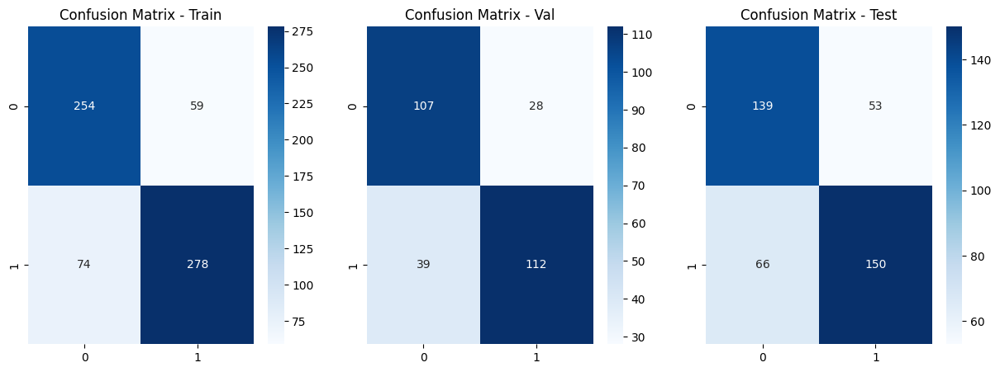

In [337]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_wine_test, y_wine_test)

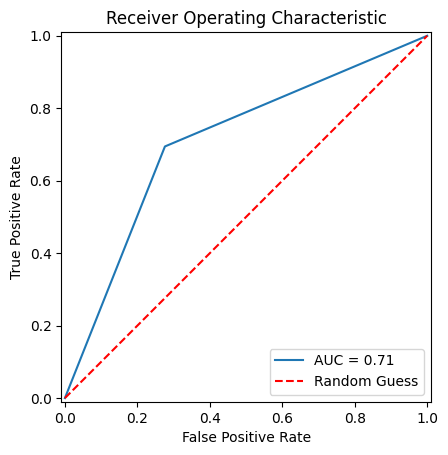

In [338]:
plot_roc_curve(y_wine_test, yhat_test)

## Cancer

In [339]:
pipe = Pipeline(steps=[
                 ("classifier", SVC(class_weight = 'balanced', max_iter=1000))]
)

search_space = [{'classifier__kernel': ['linear'],
                'classifier__C': np.logspace(-4, 1, 6)},
                {'classifier__kernel':['rbf'],
                'classifier__C': np.logspace(-4,1,6),
                'classifier__gamma': np.logspace(-4, 1, 6)},
                {'classifier__kernel': ['poly'],
                 'classifier__gamma': np.logspace(-4, 1, 6),
                 'classifier__degree': range(2,4),
                 'classifier__C': np.logspace(-4, 1, 6)}]
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [340]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [341]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_size[j], shuffle=True, stratify=y_cancer)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_cancer_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_cancer_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__kernel','classifier__gamma','classifier__degree','classifier__C'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)
    
results = pd.concat(results, ignore_index=True)

results



,Train Size,classifier__kernel,classifier__gamma,classifier__degree,classifier__C,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,poly,0.0001,2.0,0.0001,0.615385,0.934473,0.939957,0.928525
1,0.1,poly,0.0001,2.0,0.0010,0.384615,0.934473,0.939957,0.928525
2,0.1,poly,0.0001,2.0,0.0100,0.384615,0.934473,0.939957,0.928525
3,0.1,poly,0.0001,2.0,0.1000,0.384615,0.934473,0.939957,0.928525
4,0.1,poly,0.0001,2.0,1.0000,0.384615,0.934473,0.939957,0.928525
...,...,...,...,...,...,...,...,...,...
643,0.9,poly,10.0000,3.0,0.0010,0.938570,0.983706,0.993056,0.981806
644,0.9,poly,10.0000,3.0,0.0100,0.938570,0.983706,0.993056,0.981806
645,0.9,poly,10.0000,3.0,0.1000,0.938570,0.983706,0.993056,0.981806
646,0.9,poly,10.0000,3.0,1.0000,0.938570,0.983706,0.993056,0.981806


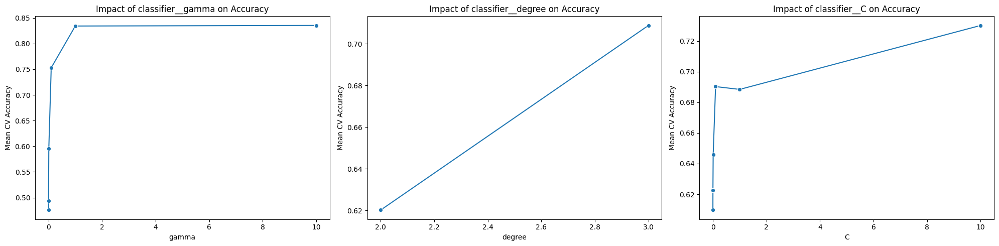

In [342]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
param_columns = param_columns[1:]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

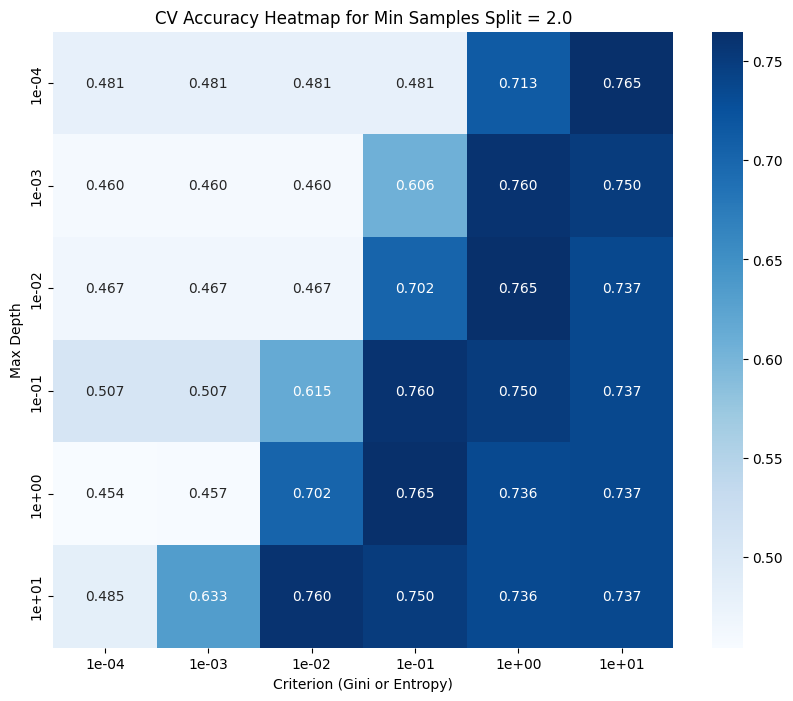

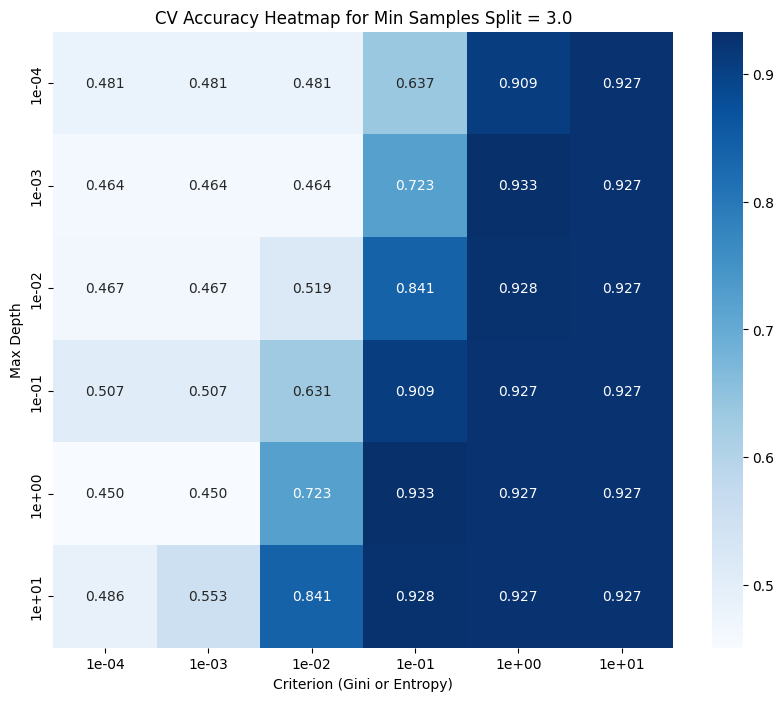

In [343]:
unique_splits = results['classifier__degree'].unique()
for min_split in sorted(unique_splits):
    heatmap_data = results[results['classifier__degree'] == min_split].pivot_table(
        values='CV_Acc',
        index='classifier__C',
        columns='classifier__gamma'
    )

    plt.figure(figsize=(10, 8))
    heatmap_data.index = [f"{x:.0e}" for x in heatmap_data.index]
    heatmap_data.columns = [f"{x:.0e}" for x in heatmap_data.columns]
    sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
    plt.title(f'CV Accuracy Heatmap for Min Samples Split = {min_split}')
    plt.xlabel('Criterion (Gini or Entropy)')
    plt.ylabel('Max Depth')
    plt.show()


### Learning Curve

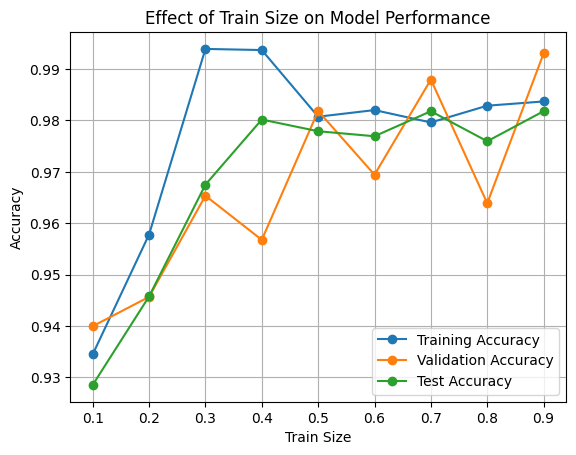

In [344]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [345]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__kernel,classifier__gamma,classifier__degree,classifier__C,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,poly,0.1,3.0,10.0,0.837607,0.934473,0.939957,0.928525
1,0.2,poly,0.1,3.0,10.0,0.940487,0.957806,0.945664,0.945744
2,0.3,poly,0.1,3.0,10.0,0.929986,0.993931,0.965352,0.967511
3,0.4,poly,0.1,3.0,1.0,0.955975,0.993711,0.956764,0.980182
4,0.5,poly,0.1,3.0,1.0,0.934595,0.980737,0.981854,0.977908
5,0.6,poly,0.1,3.0,1.0,0.956646,0.982026,0.969444,0.976933
6,0.7,poly,0.1,3.0,1.0,0.942432,0.979616,0.987963,0.981806
7,0.8,poly,0.1,3.0,1.0,0.954927,0.982879,0.963889,0.975958
8,0.9,poly,0.1,3.0,1.0,0.958092,0.983706,0.993056,0.981806


### Train Size = 0.2,0.5,0.8

In [346]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__kernel,classifier__gamma,classifier__degree,classifier__C,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,poly,0.1,3.0,10.0,0.940487,0.957806,0.945664,0.945744
1,0.5,poly,0.1,3.0,1.0,0.934595,0.980737,0.981854,0.977908
2,0.8,poly,0.1,3.0,1.0,0.954927,0.982879,0.963889,0.975958


Train Size: 0.2
training set accuracy (n=79): 1.000
val set accuracy (n=319): 0.931
test set accuracy(n=171): 0.930
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        50
           1       1.00      1.00      1.00        29

    accuracy                           1.00        79
   macro avg       1.00      1.00      1.00        79
weighted avg       1.00      1.00      1.00        79

              precision    recall  f1-score   support

           0       0.97      0.92      0.94       200
           1       0.87      0.96      0.91       119

    accuracy                           0.93       319
   macro avg       0.92      0.94      0.93       319
weighted avg       0.93      0.93      0.93       319

              precision    recall  f1-score   support

           0       0.99      0.90      0.94       107
           1       0.85      0.98      0.91        64

    accuracy                           0.93       171
   macro avg

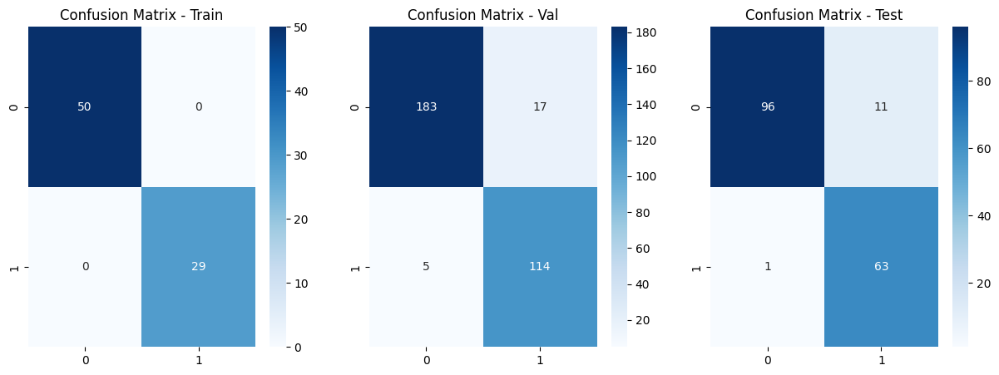

Train Size: 0.5
training set accuracy (n=199): 1.000
val set accuracy (n=199): 0.955
test set accuracy(n=171): 0.965
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       125
           1       1.00      1.00      1.00        74

    accuracy                           1.00       199
   macro avg       1.00      1.00      1.00       199
weighted avg       1.00      1.00      1.00       199

              precision    recall  f1-score   support

           0       0.96      0.97      0.96       125
           1       0.95      0.93      0.94        74

    accuracy                           0.95       199
   macro avg       0.95      0.95      0.95       199
weighted avg       0.95      0.95      0.95       199

              precision    recall  f1-score   support

           0       0.96      0.98      0.97       107
           1       0.97      0.94      0.95        64

    accuracy                           0.96       171
   macro av

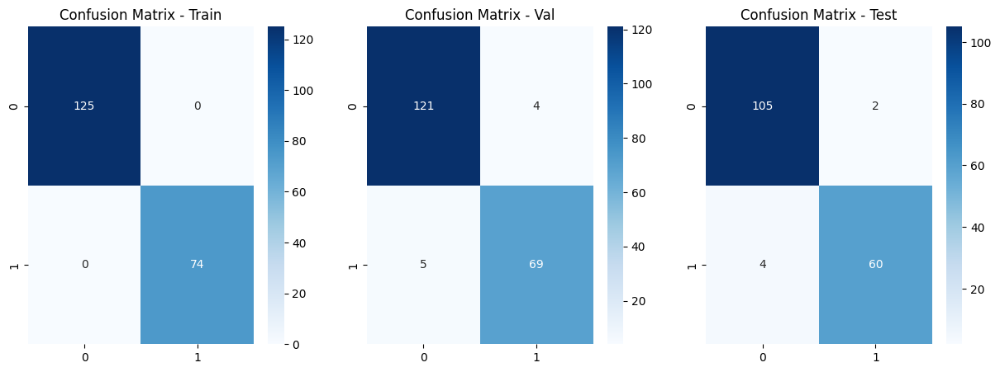

Train Size: 0.8
training set accuracy (n=318): 0.987
val set accuracy (n=80): 0.975
test set accuracy(n=171): 0.971
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       200
           1       1.00      0.97      0.98       118

    accuracy                           0.99       318
   macro avg       0.99      0.98      0.99       318
weighted avg       0.99      0.99      0.99       318

              precision    recall  f1-score   support

           0       1.00      0.96      0.98        50
           1       0.94      1.00      0.97        30

    accuracy                           0.97        80
   macro avg       0.97      0.98      0.97        80
weighted avg       0.98      0.97      0.98        80

              precision    recall  f1-score   support

           0       0.96      1.00      0.98       107
           1       1.00      0.92      0.96        64

    accuracy                           0.97       171
   macro avg

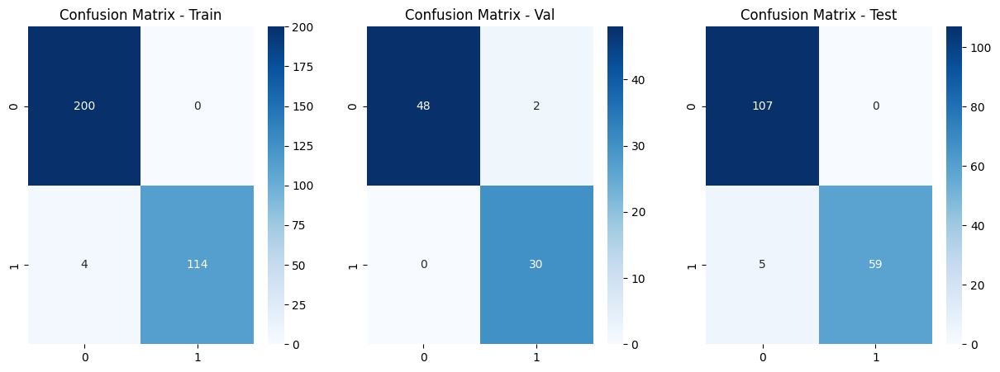

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,SVM,0.2,0.957806,0.945664,0.945744
0,SVM,0.5,0.980737,0.981854,0.977908
0,SVM,0.8,0.982879,0.963889,0.975958


In [347]:
train_sets = [0.2,0.5,0.8]
svm_results_cancer = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]

    best_model = Pipeline(
        steps=[
                ("classifier", SVC(
                    class_weight='balanced', 
                    max_iter=1000,
                    **{
                        key.split("__")[1]: (int(value) if key.split("__")[1] == 'degree' else value)
                        for key, value in b[['classifier__kernel', 'classifier__gamma', 'classifier__degree', 'classifier__C']].items()
                    }
                    )
                )
            ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_cancer)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_cancer_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_cancer_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_cancer_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_cancer_test, y_cancer_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_cancer_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['SVM'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_cancer = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    svm_results_cancer= pd.concat([svm_results_cancer, result], axis=0)

svm_results_cancer

### Best Model + Train size

In [348]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.9


In [349]:
# Eyeballing
best_ratio = best_ratio

In [350]:
best_pipe= Pipeline(
        steps=[
            ("classifier", SVC(
                class_weight='balanced', 
                max_iter=1000,
                **{
                        key.split("__")[1]: (int(value) if key.split("__")[1] == 'degree' else value)
                        for key, value in best.iloc[best_ratio][['classifier__kernel', 'classifier__gamma', 'classifier__degree','classifier__C']].items()
                    }
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_cancer, y_cancer, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_cancer)

best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"SVM_cancer.joblib")
X_train.shape,X_val.shape

((358, 30), (40, 30))

In [351]:
best_model = joblib.load(f"SVM_cancer.joblib")

In [352]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_cancer_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_cancer_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_cancer_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=358): 0.992
val set accuracy (n=40): 0.950
test set accuracy(n=171): 0.965


Best model train_size: 0.9
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       225
           1       1.00      0.98      0.99       133

    accuracy                           0.99       358
   macro avg       0.99      0.99      0.99       358
weighted avg       0.99      0.99      0.99       358

              precision    recall  f1-score   support

           0       1.00      0.92      0.96        25
           1       0.88      1.00      0.94        15

    accuracy                           0.95        40
   macro avg       0.94      0.96      0.95        40
weighted avg       0.96      0.95      0.95        40

              precision    recall  f1-score   support

           0       0.95      0.99      0.97       107
           1       0.98      0.92      0.95        64

    accuracy                           0.96       171
   macro avg       0.97      0.96      0.96       171
weighted avg       0.97      0.96      0.96    

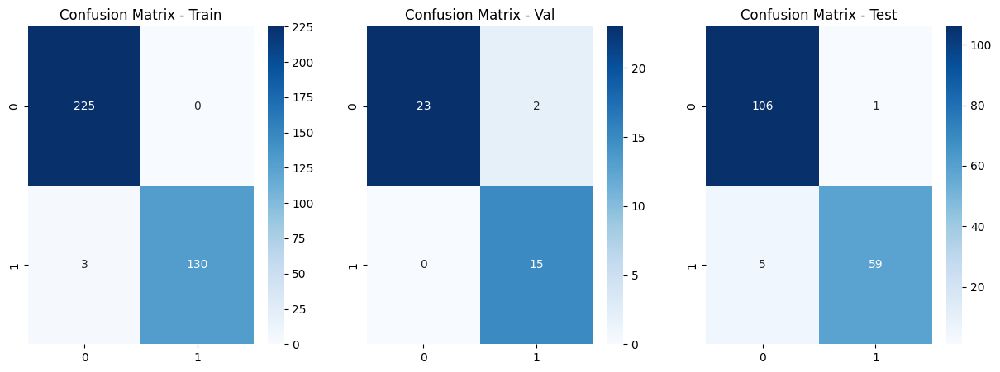

In [353]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_cancer_test, y_cancer_test)

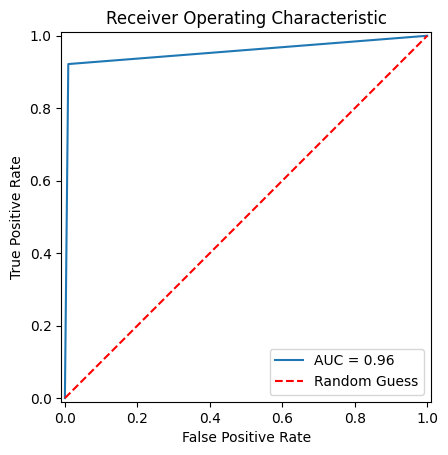

In [354]:
plot_roc_curve(y_cancer_test, yhat_test)

## Bank

In [355]:
pipe = Pipeline(steps=[
                 ("classifier", SVC(class_weight = 'balanced', max_iter=1000))]
)

search_space = [{'classifier__kernel': ['linear'],
                'classifier__C': np.logspace(-4, 1, 6)},
                {'classifier__kernel':['rbf'],
                'classifier__C': np.logspace(-4,1,6),
                'classifier__gamma': np.logspace(-4, 1, 6)},
                {'classifier__kernel': ['poly'],
                 'classifier__gamma': np.logspace(-4, 1, 6),
                 'classifier__degree': range(2,4),
                 'classifier__C': np.logspace(-4, 1, 6)}]
search = GridSearchCV(pipe, search_space, cv=3, verbose=0)

In [356]:
train_size=[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]

### Cross Validation

In [357]:
results = []
best_params = []
best_acc = []
best = []
for j in range(len(train_size)):
    train_acc = []
    val_acc = []
    test_acc = []
    result=[]
    for n in range(3):
        
        X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_size[j], shuffle=True, stratify=y_bank)
        search.fit(X_train, y_train)
    
        best_model = search.best_estimator_
        
        # best_model.fit(X_train,y_train)
        y_train_pred = best_model.predict(X_train)
        y_val_pred = best_model.predict(X_val)
        y_test_pred = best_model.predict(X_bank_test)
    
        train_acc.append(accuracy_score(y_train, y_train_pred))
        val_acc.append(accuracy_score(y_val, y_val_pred))
        test_acc.append(accuracy_score(y_bank_test, y_test_pred))
        
        r = pd.DataFrame(search.cv_results_)
    
        params = pd.DataFrame([x for x in r['params']])
        acc = pd.DataFrame(search.cv_results_['mean_test_score'],columns=['CV_Acc'])
        r = pd.concat([params,acc],axis=1)
        train_size_df = pd.DataFrame({'Train Size': [train_size[j]] * len(r)})
        r = pd.concat([train_size_df,r],axis=1)
        train_acc_df = pd.DataFrame({'Train Acc': [np.mean(train_acc)] * len(r)})
        val_acc_df = pd.DataFrame({'Val Acc': [np.mean(val_acc)] * len(r)})
        r = pd.concat([r,train_acc_df,val_acc_df],axis=1)
        test_acc_df = pd.DataFrame({'Test Acc': [np.mean(test_acc)]*len(r)})
        r = pd.concat([r,test_acc_df],axis=1)
        result.append(r)
    
    result = pd.concat(result, ignore_index=True)
    result = result.groupby(['Train Size', 'classifier__kernel','classifier__gamma','classifier__degree','classifier__C'], as_index=False).agg({'CV_Acc': 'mean','Train Acc': 'mean','Val Acc': 'mean','Test Acc': 'mean'})
    results.append(result)
    best_result = result.loc[result.groupby('Train Size')['CV_Acc'].idxmax()]
    best.append(best_result)
    
results = pd.concat(results, ignore_index=True)

results



,Train Size,classifier__kernel,classifier__gamma,classifier__degree,classifier__C,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,poly,0.0001,2.0,0.0001,0.116941,1.00000,0.882975,0.882835
1,0.1,poly,0.0001,2.0,0.0010,0.116941,1.00000,0.882975,0.882835
2,0.1,poly,0.0001,2.0,0.0100,0.116941,1.00000,0.882975,0.882835
3,0.1,poly,0.0001,2.0,0.1000,0.116941,1.00000,0.882975,0.882835
4,0.1,poly,0.0001,2.0,1.0000,0.116941,1.00000,0.882975,0.882835
...,...,...,...,...,...,...,...,...,...
643,0.9,poly,10.0000,3.0,0.0010,0.276935,0.91804,0.876654,0.877662
644,0.9,poly,10.0000,3.0,0.0100,0.271645,0.91804,0.876654,0.877662
645,0.9,poly,10.0000,3.0,0.1000,0.271645,0.91804,0.876654,0.877662
646,0.9,poly,10.0000,3.0,1.0000,0.271645,0.91804,0.876654,0.877662


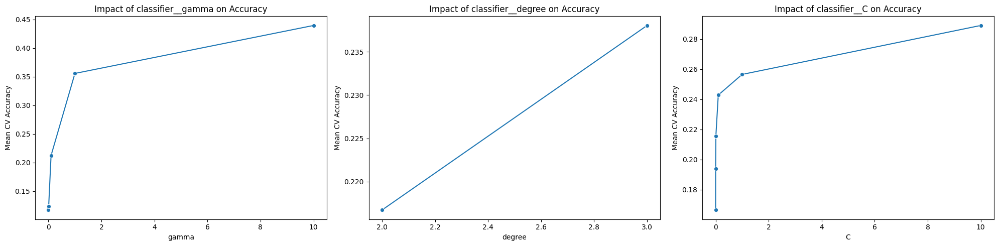

In [358]:
param_columns = [col for col in results.columns if col.startswith('classifier__')]
param_columns = param_columns[1:]
columns_to_show = param_columns + ['CV_Acc']
plot_data = results[columns_to_show]
fig, axes = plt.subplots(nrows=1, ncols=len(param_columns), figsize=(20, 5))
if len(param_columns) == 1:
    axes = [axes]
for i, param in enumerate(param_columns):
    avg_scores = plot_data.groupby(param)['CV_Acc'].mean().reset_index()
    sns.lineplot(data=avg_scores, x=param, y='CV_Acc', marker='o', ax=axes[i])
    axes[i].set_title(f'Impact of {param} on Accuracy')
    axes[i].set_xlabel(param.split('__')[-1])
    axes[i].set_ylabel('Mean CV Accuracy')

plt.tight_layout()
plt.show()

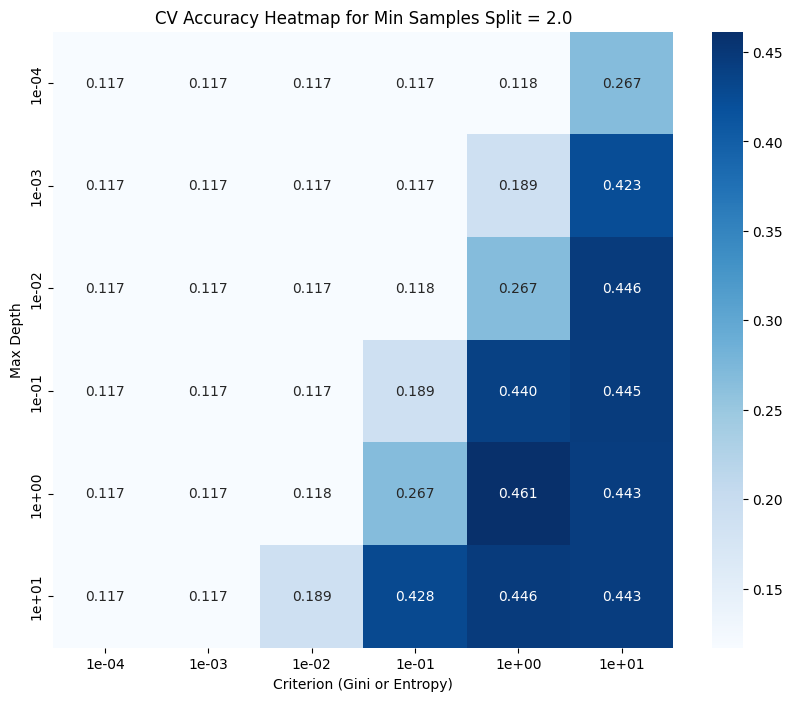

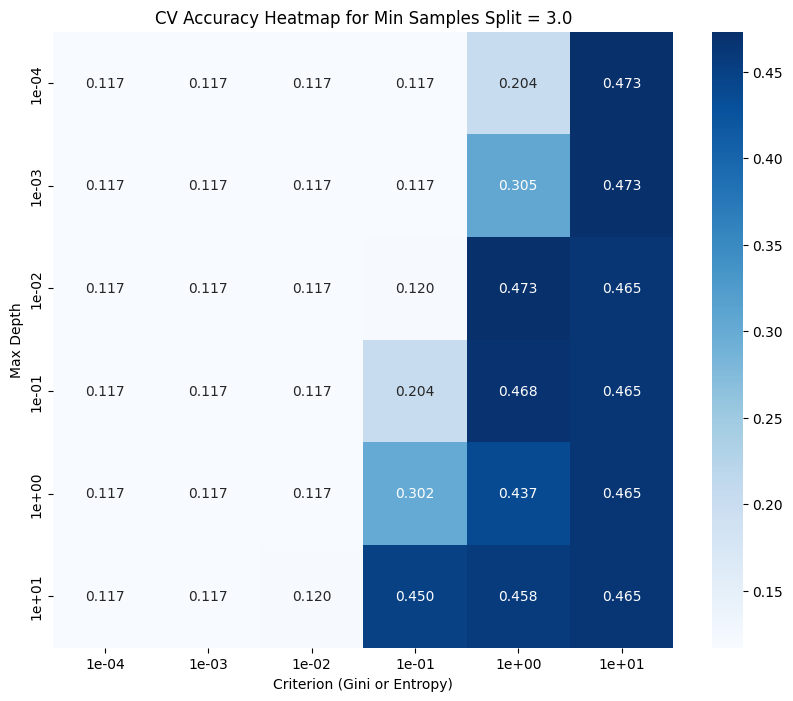

In [359]:
unique_splits = results['classifier__degree'].unique()
for min_split in sorted(unique_splits):
    heatmap_data = results[results['classifier__degree'] == min_split].pivot_table(
        values='CV_Acc',
        index='classifier__C',
        columns='classifier__gamma'
    )

    plt.figure(figsize=(10, 8))
    heatmap_data.index = [f"{x:.0e}" for x in heatmap_data.index]
    heatmap_data.columns = [f"{x:.0e}" for x in heatmap_data.columns]
    sns.heatmap(heatmap_data, annot=True, cmap='Blues', fmt='.3f')
    plt.title(f'CV Accuracy Heatmap for Min Samples Split = {min_split}')
    plt.xlabel('Criterion (Gini or Entropy)')
    plt.ylabel('Max Depth')
    plt.show()


### Learning Curve

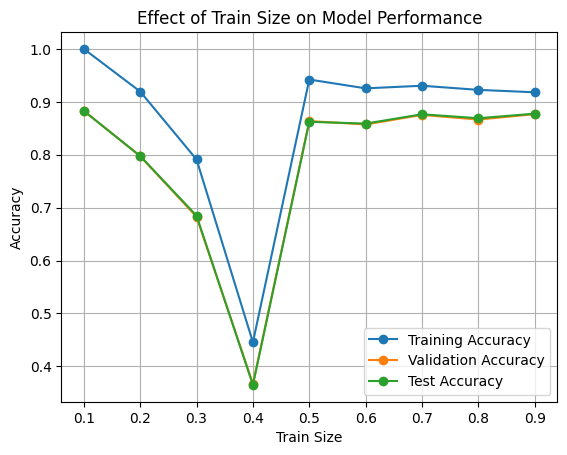

In [360]:

train_sizes_plot = [r['Train Size'] for r in best]
train_acc = [r['Train Acc'] for r in best]
val_acc = [r['Val Acc'] for r in best]
test_acc = [r['Test Acc'] for r in best]
plt.plot(train_sizes_plot, train_acc, marker='o',label='Training Accuracy')

plt.plot(train_sizes_plot, val_acc, marker='o',label='Validation Accuracy')

plt.plot(train_sizes_plot, test_acc, marker='o',label='Test Accuracy')
plt.title("Effect of Train Size on Model Performance")
plt.xlabel("Train Size")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()
plt.show()

In [361]:
best = pd.concat(best, ignore_index=True)
best

,Train Size,classifier__kernel,classifier__gamma,classifier__degree,classifier__C,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.1,poly,1.0,3.0,0.0010,0.863990,1.000000,0.882975,0.882835
1,0.2,poly,0.1,3.0,10.0000,0.768947,0.919454,0.797338,0.797597
2,0.3,poly,10.0,3.0,0.0010,0.581954,0.791090,0.682616,0.684795
3,0.4,poly,10.0,3.0,0.0001,0.578046,0.445629,0.366979,0.365019
4,0.5,poly,1.0,2.0,1.0000,0.485679,0.942152,0.863720,0.862250
5,0.6,poly,1.0,2.0,10.0000,0.430380,0.925497,0.857216,0.858887
6,0.7,poly,10.0,3.0,0.0001,0.348531,0.930418,0.875309,0.876491
7,0.8,poly,1.0,2.0,1.0000,0.338047,0.922623,0.866535,0.868987
8,0.9,poly,10.0,2.0,0.0100,0.426386,0.918040,0.876654,0.877662


### Train Size = 0.2,0.5,0.8

In [362]:
choose = best[best['Train Size'].isin([0.2,0.5,0.8])].reset_index(drop=True)
choose

,Train Size,classifier__kernel,classifier__gamma,classifier__degree,classifier__C,CV_Acc,Train Acc,Val Acc,Test Acc
0,0.2,poly,0.1,3.0,10.0,0.768947,0.919454,0.797338,0.797597
1,0.5,poly,1.0,2.0,1.0,0.485679,0.942152,0.863720,0.862250
2,0.8,poly,1.0,2.0,1.0,0.338047,0.922623,0.866535,0.868987


Train Size: 0.2
training set accuracy (n=6329): 0.130
val set accuracy (n=25318): 0.128
test set accuracy(n=13564): 0.129
              precision    recall  f1-score   support

           0       0.93      0.02      0.03      5589
           1       0.12      0.99      0.21       740

    accuracy                           0.13      6329
   macro avg       0.53      0.50      0.12      6329
weighted avg       0.84      0.13      0.05      6329

              precision    recall  f1-score   support

           0       0.88      0.01      0.03     22356
           1       0.12      0.99      0.21      2962

    accuracy                           0.13     25318
   macro avg       0.50      0.50      0.12     25318
weighted avg       0.79      0.13      0.05     25318

              precision    recall  f1-score   support

           0       0.90      0.02      0.03     11977
           1       0.12      0.99      0.21      1587

    accuracy                           0.13     13564
   mac

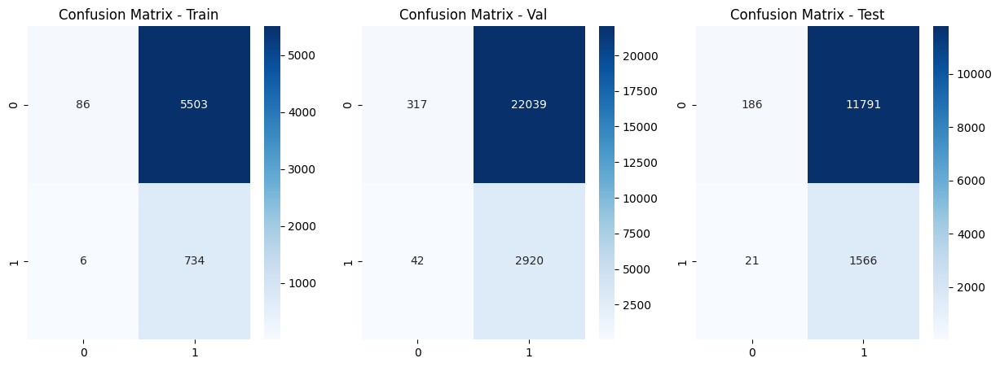

Train Size: 0.5
training set accuracy (n=15823): 0.437
val set accuracy (n=15824): 0.432
test set accuracy(n=13564): 0.440
              precision    recall  f1-score   support

           0       0.93      0.39      0.55     13972
           1       0.15      0.78      0.25      1851

    accuracy                           0.44     15823
   macro avg       0.54      0.59      0.40     15823
weighted avg       0.84      0.44      0.52     15823

              precision    recall  f1-score   support

           0       0.93      0.39      0.55     13973
           1       0.14      0.76      0.24      1851

    accuracy                           0.43     15824
   macro avg       0.53      0.58      0.39     15824
weighted avg       0.83      0.43      0.51     15824

              precision    recall  f1-score   support

           0       0.93      0.39      0.55     11977
           1       0.15      0.79      0.25      1587

    accuracy                           0.44     13564
   ma

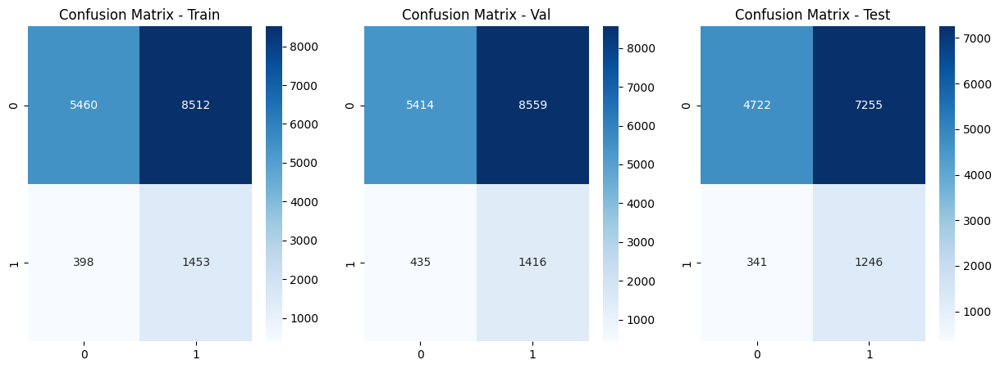

Train Size: 0.8
training set accuracy (n=25317): 0.161
val set accuracy (n=6330): 0.160
test set accuracy(n=13564): 0.163
              precision    recall  f1-score   support

           0       0.80      0.07      0.12     22355
           1       0.11      0.87      0.20      2962

    accuracy                           0.16     25317
   macro avg       0.45      0.47      0.16     25317
weighted avg       0.72      0.16      0.13     25317

              precision    recall  f1-score   support

           0       0.79      0.07      0.12      5590
           1       0.11      0.86      0.19       740

    accuracy                           0.16      6330
   macro avg       0.45      0.47      0.16      6330
weighted avg       0.71      0.16      0.13      6330

              precision    recall  f1-score   support

           0       0.82      0.07      0.12     11977
           1       0.11      0.89      0.20      1587

    accuracy                           0.16     13564
   mac

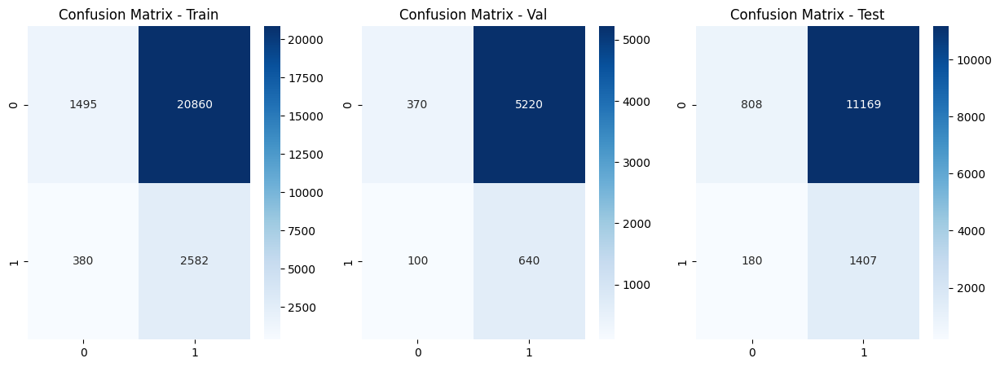

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,SVM,0.2,0.919454,0.797338,0.797597
0,SVM,0.5,0.942152,0.863720,0.862250
0,SVM,0.8,0.922623,0.866535,0.868987


In [363]:
train_sets = [0.2,0.5,0.8]
svm_results_bank = pd.DataFrame()
for i in range(len(train_sets)):
    print(f'Train Size: {train_sets[i]}')
    b = best[best['Train Size']==train_sets[i]].iloc[0]

    best_model = Pipeline(
        steps=[
                ("classifier", SVC(
                    class_weight='balanced', 
                    max_iter=1000,
                    **{
                        key.split("__")[1]: (int(value) if key.split("__")[1] == 'degree' else value)
                        for key, value in b[['classifier__kernel', 'classifier__gamma', 'classifier__degree', 'classifier__C']].items()
                    }
                    )
                )
            ]
    )
    X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_sets[i],random_state=2024,shuffle=True, stratify=y_bank)
    
    best_model.fit(X_train, y_train)
    yhat_train = best_model.predict(X_train)
    yhat_val = best_model.predict(X_val)
    yhat_test = best_model.predict(X_bank_test)
    acc_train = accuracy_score(y_train, yhat_train)
    acc_val = accuracy_score(y_val, yhat_val)
    acc_test = accuracy_score(y_bank_test,yhat_test)
    
    
    print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
    print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
    print(f'test set accuracy(n={y_bank_test.shape[0]}): {acc_test:4.3f}')
    
    report_cm(best_model,X_train, y_train, X_val, y_val,X_bank_test, y_bank_test)
    
    # report_train = classification_report(y_train, yhat_train, output_dict=True)
    # report_val = classification_report(y_val, yhat_val, output_dict=True)
    # report_test = classification_report(y_bank_test, yhat_test, output_dict=True)

    
    classifier = pd.DataFrame(['SVM'], columns=['classifier'])
    accuracy = pd.DataFrame({
        'train_size':[train_sets[i]],
        'accuracy_train': [choose['Train Acc'][i]],
        'accuracy_val': [choose['Val Acc'][i]],
        'accuracy_test': [choose['Test Acc'][i]]
    })
    # weighted_recall = pd.DataFrame([weighted_recall], columns=['weighted_recall'])
    # weighted_prec = pd.DataFrame([weighted_prec], columns=['weighted_precision'])
    # svm_results_bank = pd.concat([classifier, accuracy, weighted_recall, weighted_prec], axis=1)
    result = pd.concat([classifier, accuracy], axis=1)
    svm_results_bank= pd.concat([svm_results_bank, result], axis=0)

svm_results_bank

### Best Model + Train size

In [ ]:
best_ratio = np.argmax(best['Val Acc'])
print(train_size[best_ratio])

0.1


In [ ]:
# Eyeballing
best_ratio = best_ratio

In [ ]:
best_pipe= Pipeline(
        steps=[
            ("classifier", SVC(
                class_weight='balanced', 
                max_iter=1000,
                **{
                        key.split("__")[1]: (int(value) if key.split("__")[1] == 'degree' else value)
                        for key, value in best.iloc[best_ratio][['classifier__kernel', 'classifier__gamma', 'classifier__degree','classifier__C']].items()
                    }
            ))
        ]
    )
X_train, X_val, y_train, y_val = train_test_split(X_bank, y_bank, train_size=train_size[best_ratio],random_state=2024,shuffle=True, stratify=y_bank)

best_pipe.fit(X_train, y_train)
joblib.dump(best_pipe, f"SVM_bank.joblib")
X_train.shape,X_val.shape

((3164, 51), (28483, 51))

In [ ]:
best_model = joblib.load(f"SVM_bank.joblib")

In [ ]:
yhat_train = best_model.predict(X_train)
yhat_val = best_model.predict(X_val)
yhat_test = best_model.predict(X_bank_test)
acc_train = accuracy_score(y_train, yhat_train)
acc_val = accuracy_score(y_val, yhat_val)
acc_test = accuracy_score(y_bank_test,yhat_test)

print(f'training set accuracy (n={y_train.shape[0]}): {acc_train:4.3f}')
print(f'val set accuracy (n={y_val.shape[0]}): {acc_val:4.3f}')
print(f'test set accuracy(n={y_bank_test.shape[0]}): {acc_test:4.3f}')


training set accuracy (n=3164): 0.918
val set accuracy (n=28483): 0.847
test set accuracy(n=13564): 0.849


Best model train_size: 0.1
              precision    recall  f1-score   support

           0       0.99      0.91      0.95      2794
           1       0.59      0.96      0.73       370

    accuracy                           0.92      3164
   macro avg       0.79      0.94      0.84      3164
weighted avg       0.95      0.92      0.93      3164

              precision    recall  f1-score   support

           0       0.95      0.87      0.91     25151
           1       0.41      0.67      0.51      3332

    accuracy                           0.85     28483
   macro avg       0.68      0.77      0.71     28483
weighted avg       0.89      0.85      0.86     28483

              precision    recall  f1-score   support

           0       0.95      0.87      0.91     11977
           1       0.41      0.67      0.51      1587

    accuracy                           0.85     13564
   macro avg       0.68      0.77      0.71     13564
weighted avg       0.89      0.85      0.86    

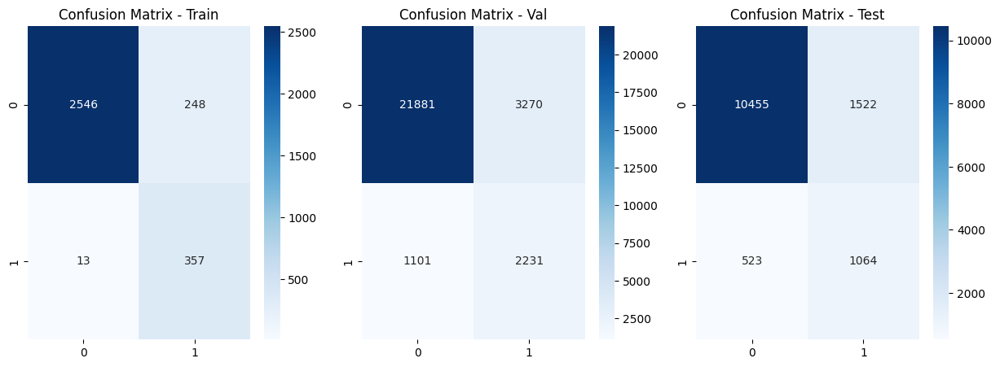

In [ ]:
print(f'Best model train_size: {train_size[best_ratio]}')
report_cm(best_model,X_train, y_train, X_val, y_val,X_bank_test, y_bank_test)

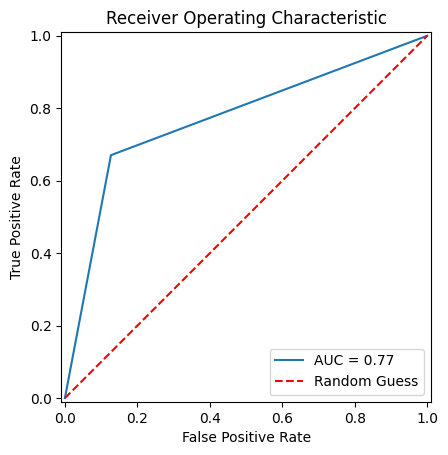

In [ ]:
plot_roc_curve(y_bank_test, yhat_test)

# Results

In [ ]:
iris_results = pd.concat([log_results_iris, dt_results_iris, rf_results_iris,knn_results_iris,svm_results_iris], ignore_index=True)
wine_results = pd.concat([log_results_wine, dt_results_wine, rf_results_wine,knn_results_wine,svm_results_wine], ignore_index=True)
cancer_results = pd.concat([log_results_cancer, dt_results_cancer, rf_results_cancer,knn_results_cancer,svm_results_cancer], ignore_index=True)
bank_results = pd.concat([log_results_bank, dt_results_bank, rf_results_bank,knn_results_bank,svm_results_bank], ignore_index=True)
iris_results = iris_results.sort_values(by=['train_size', 'accuracy_test'], ascending=[True, False])
wine_results = wine_results.sort_values(by=['train_size', 'accuracy_test'], ascending=[True, False])
cancer_results = cancer_results.sort_values(by=['train_size', 'accuracy_test'], ascending=[True, False])
bank_results = bank_results.sort_values(by=['train_size', 'accuracy_test'], ascending=[True, False])

In [ ]:
iris_results

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,LogisticRegression,0.2,1.000000,0.931572,0.972840
12,SVM,0.2,0.986111,0.941734,0.948148
3,DecisionTree,0.2,1.000000,0.922087,0.934568
6,RandomForest,0.2,1.000000,0.914634,0.933333
9,KNN,0.2,0.891667,0.856369,0.900000
13,SVM,0.5,0.960784,0.972767,0.980247
1,LogisticRegression,0.5,0.982571,0.940087,0.975309
4,DecisionTree,0.5,0.994553,0.935730,0.969136
7,RandomForest,0.5,0.980392,0.934641,0.962963
10,KNN,0.5,0.966231,0.907407,0.927160


In [ ]:
wine_results

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
6,RandomForest,0.2,0.923684,0.736531,0.716912
12,SVM,0.2,0.748538,0.735509,0.700980
0,LogisticRegression,0.2,0.806725,0.717477,0.692402
9,KNN,0.2,0.756140,0.724631,0.689270
3,DecisionTree,0.2,0.933041,0.686232,0.665441
13,SVM,0.5,0.779532,0.739496,0.709150
7,RandomForest,0.5,0.886316,0.760504,0.705882
10,KNN,0.5,0.755556,0.722572,0.695534
1,LogisticRegression,0.5,0.770058,0.729342,0.695534
4,DecisionTree,0.5,0.869942,0.691176,0.669254


In [ ]:
cancer_results

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
0,LogisticRegression,0.2,0.990858,0.954023,0.959714
12,SVM,0.2,0.957806,0.945664,0.945744
9,KNN,0.2,0.913502,0.955590,0.943145
6,RandomForest,0.2,1.000000,0.932602,0.935673
3,DecisionTree,0.2,0.996484,0.894810,0.859974
13,SVM,0.5,0.980737,0.981854,0.977908
10,KNN,0.5,0.960916,0.947795,0.963288
7,RandomForest,0.5,0.997487,0.949749,0.959064
1,LogisticRegression,0.5,0.988833,0.959799,0.950942
4,DecisionTree,0.5,0.993858,0.903685,0.906433


In [ ]:
bank_results

,classifier,train_size,accuracy_train,accuracy_val,accuracy_test
6,RandomForest,0.2,0.997946,0.899755,0.898186
9,KNN,0.2,0.906304,0.895395,0.893792
0,LogisticRegression,0.2,0.870569,0.868425,0.865657
3,DecisionTree,0.2,0.945673,0.855384,0.854218
12,SVM,0.2,0.919454,0.797338,0.797597
7,RandomForest,0.5,0.965851,0.895939,0.897007
10,KNN,0.5,0.906209,0.896837,0.896315
13,SVM,0.5,0.942152,0.863720,0.862250
4,DecisionTree,0.5,0.918758,0.852215,0.851597
1,LogisticRegression,0.5,0.849909,0.843919,0.840173
